In [54]:
from __future__ import print_function, division
import torch
import torch
import torch.nn as nn
import torch.optim as optim
import data as dt
import model as md
import copy
from pytorch_ssim import ssim
from torch.utils.data import DataLoader
# e/d

In [62]:
# print gpu
torch.cuda.set_device(1)
currentDevice = torch.cuda.current_device()
print("Current GPU: " + str(currentDevice))
print(str(torch.cuda.device_count()))
print(str(torch.cuda.get_device_capability(currentDevice)))
print(torch.__version__)
torch.cuda.empty_cache()

Current GPU: 1
8
(6, 1)
1.0.0


In [56]:
USE_GPU = 1
if USE_GPU and torch.cuda.is_available():
    device = torch.device('cuda:1')
else:
    device = "cpu"
print(device)

cuda:1


In [ ]:
# generate csv file, run only for the first time
# dt.generate_csv()

In [57]:
csvFilePath = dt.get_csv_path()
transformed_dataset = dt.HE_SHG_Dataset(csv_file=csvFilePath,
                                               transform=dt.Compose([                                              
                                               dt.Rescale(96),
                                               dt.Normalize(),
                                               dt.ToTensor()
                                           ]))
# TODO: change the normalization parameters

In [58]:
# batchsize 32->16
dataloader = DataLoader(transformed_dataset, batch_size=32,
                        shuffle=True, num_workers=0)

0 torch.Size([32, 3, 96, 96]) torch.Size([32, 96, 96])
1 torch.Size([32, 3, 96, 96]) torch.Size([32, 96, 96])
2 torch.Size([32, 3, 96, 96]) torch.Size([32, 96, 96])
3 torch.Size([32, 3, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


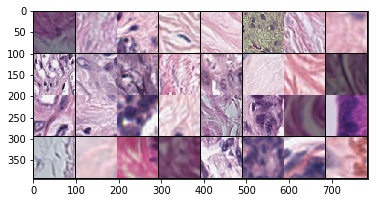

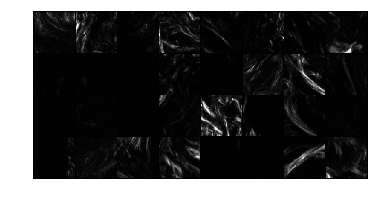

In [59]:
# TODO: insert back mean and variance to plot the image appropriately
dt.show_patch(dataloader) 

In [8]:
print('===> Building model')
model = md.Net().to(device)
criterionMSE = nn.MSELoss()

optimizer = optim.Adam(model.parameters(), lr=0.001)


===> Building model


In [35]:
def train(epoch, p, windowsize):
    epoch_loss = 0
    for iteration, batch in enumerate(dataloader):
        input, target = batch['input'].to(device), batch['output'].to(device)

        optimizer.zero_grad()
        output = model(input)
        targetf = target.float()
        targetf = targetf[:, None]
        
        lossMSE = criterionMSE(output, targetf)      
        lossSSIM = 1-ssim(output, targetf, window_size=windowsize)
        
        # 0.75->0.4 after 3 epochs
        loss = p*lossMSE + (1-p)*lossSSIM
        combineLoss = p*lossMSE.item() + (1-p)*lossSSIM.item()
        
        epoch_loss = epoch_loss + combineLoss
        loss.backward()
        optimizer.step()
    
        if iteration%50 == 0:
            print("lossMSE: " + str(lossMSE.item()) +
                  " " + "lossSSIM: " + str(lossSSIM.item()))
            print("===> Epoch[{}]({}/{}): Loss: {:.4f}".format(epoch, iteration, len(dataloader), loss.item()))

    print("===> Epoch {} Complete: Avg. Loss: {:.4f}".format(epoch, epoch_loss / len(dataloader)))


In [ ]:
# def test():
#     avg_psnr = 0
#     with torch.no_grad():
#         for batch in testing_data_loader:
#             input, target = batch[0].to(device), batch[1].to(device)

#             prediction = model(input)
#             mse = criterion(prediction, target)
#             psnr = 10 * log10(1 / mse.item())
#             avg_psnr += psnr
#     print("===> Avg. PSNR: {:.4f} dB".format(avg_psnr / len(testing_data_loader)))


In [ ]:
# def checkpoint(epoch):
#     model_out_path = "model_epoch_{}.pth".format(epoch)
#     torch.save(model, model_out_path)
#     print("Checkpoint saved to {}".format(model_out_path))

In [12]:
for epoch in range(1, 5 + 1):
    train(epoch)
#     test()
#     checkpoint(epoch)

lossMSE: 0.2236083298921585 lossSSIM: 0.9521285891532898
===> Epoch[1](0/25343): Loss: 0.4057
lossMSE: 0.22643481194972992 lossSSIM: 0.9551966190338135
===> Epoch[1](50/25343): Loss: 0.4086
lossMSE: 0.2193039357662201 lossSSIM: 0.9519645571708679
===> Epoch[1](100/25343): Loss: 0.4025
lossMSE: 0.2190506011247635 lossSSIM: 0.9496465921401978
===> Epoch[1](150/25343): Loss: 0.4017
lossMSE: 0.2177480310201645 lossSSIM: 0.9515767693519592
===> Epoch[1](200/25343): Loss: 0.4012
lossMSE: 0.20641782879829407 lossSSIM: 0.9386119842529297
===> Epoch[1](250/25343): Loss: 0.3895
lossMSE: 0.2131938338279724 lossSSIM: 0.9519171118736267
===> Epoch[1](300/25343): Loss: 0.3979
lossMSE: 0.2124307006597519 lossSSIM: 0.9516014456748962
===> Epoch[1](350/25343): Loss: 0.3972
lossMSE: 0.2133532166481018 lossSSIM: 0.9542365074157715
===> Epoch[1](400/25343): Loss: 0.3986
lossMSE: 0.2092287391424179 lossSSIM: 0.9485486745834351
===> Epoch[1](450/25343): Loss: 0.3941
lossMSE: 0.21059627830982208 lossSSIM: 0.

lossMSE: 0.13670922815799713 lossSSIM: 0.9393953680992126
===> Epoch[1](4250/25343): Loss: 0.3374
lossMSE: 0.13267141580581665 lossSSIM: 0.9376250505447388
===> Epoch[1](4300/25343): Loss: 0.3339
lossMSE: 0.13077574968338013 lossSSIM: 0.9242864847183228
===> Epoch[1](4350/25343): Loss: 0.3292
lossMSE: 0.13244499266147614 lossSSIM: 0.932690441608429
===> Epoch[1](4400/25343): Loss: 0.3325
lossMSE: 0.13878054916858673 lossSSIM: 0.9471837878227234
===> Epoch[1](4450/25343): Loss: 0.3409
lossMSE: 0.1291639506816864 lossSSIM: 0.9310170412063599
===> Epoch[1](4500/25343): Loss: 0.3296
lossMSE: 0.12972848117351532 lossSSIM: 0.9338974356651306
===> Epoch[1](4550/25343): Loss: 0.3308
lossMSE: 0.1363593488931656 lossSSIM: 0.948695182800293
===> Epoch[1](4600/25343): Loss: 0.3394
lossMSE: 0.12712505459785461 lossSSIM: 0.9296424388885498
===> Epoch[1](4650/25343): Loss: 0.3278
lossMSE: 0.12911218404769897 lossSSIM: 0.940505862236023
===> Epoch[1](4700/25343): Loss: 0.3320
lossMSE: 0.12383101880550

lossMSE: 0.08005616068840027 lossSSIM: 0.92084801197052
===> Epoch[1](8450/25343): Loss: 0.2903
lossMSE: 0.08186832070350647 lossSSIM: 0.927537739276886
===> Epoch[1](8500/25343): Loss: 0.2933
lossMSE: 0.07991956174373627 lossSSIM: 0.9171780943870544
===> Epoch[1](8550/25343): Loss: 0.2892
lossMSE: 0.07648035883903503 lossSSIM: 0.9098098278045654
===> Epoch[1](8600/25343): Loss: 0.2848
lossMSE: 0.0791129469871521 lossSSIM: 0.9119542837142944
===> Epoch[1](8650/25343): Loss: 0.2873
lossMSE: 0.07959481328725815 lossSSIM: 0.9217629432678223
===> Epoch[1](8700/25343): Loss: 0.2901
lossMSE: 0.0790601596236229 lossSSIM: 0.9221605658531189
===> Epoch[1](8750/25343): Loss: 0.2898
lossMSE: 0.07533227652311325 lossSSIM: 0.9094471335411072
===> Epoch[1](8800/25343): Loss: 0.2839
lossMSE: 0.07549329847097397 lossSSIM: 0.9226122498512268
===> Epoch[1](8850/25343): Loss: 0.2873
lossMSE: 0.07622328400611877 lossSSIM: 0.9108262062072754
===> Epoch[1](8900/25343): Loss: 0.2849
lossMSE: 0.07316195964813

lossMSE: 0.045732464641332626 lossSSIM: 0.8886842727661133
===> Epoch[1](12650/25343): Loss: 0.2565
lossMSE: 0.04733969271183014 lossSSIM: 0.8978765606880188
===> Epoch[1](12700/25343): Loss: 0.2600
lossMSE: 0.0423714853823185 lossSSIM: 0.8759424090385437
===> Epoch[1](12750/25343): Loss: 0.2508
lossMSE: 0.04442284628748894 lossSSIM: 0.8872299790382385
===> Epoch[1](12800/25343): Loss: 0.2551
lossMSE: 0.04625470191240311 lossSSIM: 0.8943043947219849
===> Epoch[1](12850/25343): Loss: 0.2583
lossMSE: 0.043292202055454254 lossSSIM: 0.8822076320648193
===> Epoch[1](12900/25343): Loss: 0.2530
lossMSE: 0.04374659061431885 lossSSIM: 0.8919510245323181
===> Epoch[1](12950/25343): Loss: 0.2558
lossMSE: 0.04116857051849365 lossSSIM: 0.8809995651245117
===> Epoch[1](13000/25343): Loss: 0.2511
lossMSE: 0.044537562876939774 lossSSIM: 0.9020398259162903
===> Epoch[1](13050/25343): Loss: 0.2589
lossMSE: 0.04080763831734657 lossSSIM: 0.864517092704773
===> Epoch[1](13100/25343): Loss: 0.2467
lossMSE: 

lossMSE: 0.02904576063156128 lossSSIM: 0.8771364688873291
===> Epoch[1](16800/25343): Loss: 0.2411
lossMSE: 0.025524752214550972 lossSSIM: 0.8375843167304993
===> Epoch[1](16850/25343): Loss: 0.2285
lossMSE: 0.025828015059232712 lossSSIM: 0.8410090208053589
===> Epoch[1](16900/25343): Loss: 0.2296
lossMSE: 0.02520345151424408 lossSSIM: 0.8527064919471741
===> Epoch[1](16950/25343): Loss: 0.2321
lossMSE: 0.024990541860461235 lossSSIM: 0.863754391670227
===> Epoch[1](17000/25343): Loss: 0.2347
lossMSE: 0.02840331941843033 lossSSIM: 0.839538037776947
===> Epoch[1](17050/25343): Loss: 0.2312
lossMSE: 0.03213782608509064 lossSSIM: 0.870921790599823
===> Epoch[1](17100/25343): Loss: 0.2418
lossMSE: 0.02588384598493576 lossSSIM: 0.8750680685043335
===> Epoch[1](17150/25343): Loss: 0.2382
lossMSE: 0.024070754647254944 lossSSIM: 0.8333703279495239
===> Epoch[1](17200/25343): Loss: 0.2264
lossMSE: 0.024234257638454437 lossSSIM: 0.8243420124053955
===> Epoch[1](17250/25343): Loss: 0.2243
lossMSE:

lossMSE: 0.016486169770359993 lossSSIM: 0.7503995895385742
===> Epoch[1](20950/25343): Loss: 0.2000
lossMSE: 0.016962263733148575 lossSSIM: 0.8046496510505676
===> Epoch[1](21000/25343): Loss: 0.2139
lossMSE: 0.020596930757164955 lossSSIM: 0.7519906759262085
===> Epoch[1](21050/25343): Loss: 0.2034
lossMSE: 0.01869705691933632 lossSSIM: 0.8084458112716675
===> Epoch[1](21100/25343): Loss: 0.2161
lossMSE: 0.01929977349936962 lossSSIM: 0.7935781478881836
===> Epoch[1](21150/25343): Loss: 0.2129
lossMSE: 0.016350699588656425 lossSSIM: 0.7797596454620361
===> Epoch[1](21200/25343): Loss: 0.2072
lossMSE: 0.018312828615307808 lossSSIM: 0.7775135636329651
===> Epoch[1](21250/25343): Loss: 0.2081
lossMSE: 0.016913142055273056 lossSSIM: 0.7475007176399231
===> Epoch[1](21300/25343): Loss: 0.1996
lossMSE: 0.016649482771754265 lossSSIM: 0.7253667116165161
===> Epoch[1](21350/25343): Loss: 0.1938
lossMSE: 0.01588626205921173 lossSSIM: 0.7543613910675049
===> Epoch[1](21400/25343): Loss: 0.2005
los

lossMSE: 0.014419879764318466 lossSSIM: 0.640129804611206
===> Epoch[1](25100/25343): Loss: 0.1708
lossMSE: 0.0158570297062397 lossSSIM: 0.6841727495193481
===> Epoch[1](25150/25343): Loss: 0.1829
lossMSE: 0.013970481231808662 lossSSIM: 0.6689863204956055
===> Epoch[1](25200/25343): Loss: 0.1777
lossMSE: 0.013557087630033493 lossSSIM: 0.6687588095664978
===> Epoch[1](25250/25343): Loss: 0.1774
lossMSE: 0.013608871959149837 lossSSIM: 0.6435325145721436
===> Epoch[1](25300/25343): Loss: 0.1711
===> Epoch 1 Complete: Avg. Loss: 0.2686
lossMSE: 0.014305021613836288 lossSSIM: 0.6639020442962646
===> Epoch[2](0/25343): Loss: 0.1767
lossMSE: 0.013263351283967495 lossSSIM: 0.648558497428894
===> Epoch[2](50/25343): Loss: 0.1721
lossMSE: 0.013801191933453083 lossSSIM: 0.6524527072906494
===> Epoch[2](100/25343): Loss: 0.1735
lossMSE: 0.012776627205312252 lossSSIM: 0.6505331993103027
===> Epoch[2](150/25343): Loss: 0.1722
lossMSE: 0.013698760420084 lossSSIM: 0.6200186014175415
===> Epoch[2](200/

lossMSE: 0.014354228973388672 lossSSIM: 0.5108766555786133
===> Epoch[2](3900/25343): Loss: 0.1385
lossMSE: 0.012409135699272156 lossSSIM: 0.5210134983062744
===> Epoch[2](3950/25343): Loss: 0.1396
lossMSE: 0.01248917356133461 lossSSIM: 0.5273481607437134
===> Epoch[2](4000/25343): Loss: 0.1412
lossMSE: 0.015621500089764595 lossSSIM: 0.5231768488883972
===> Epoch[2](4050/25343): Loss: 0.1425
lossMSE: 0.0138079933822155 lossSSIM: 0.5357787609100342
===> Epoch[2](4100/25343): Loss: 0.1443
lossMSE: 0.013485321775078773 lossSSIM: 0.5361129641532898
===> Epoch[2](4150/25343): Loss: 0.1441
lossMSE: 0.013523982837796211 lossSSIM: 0.5028262734413147
===> Epoch[2](4200/25343): Loss: 0.1358
lossMSE: 0.013852808624505997 lossSSIM: 0.520383358001709
===> Epoch[2](4250/25343): Loss: 0.1405
lossMSE: 0.013120346702635288 lossSSIM: 0.5126024484634399
===> Epoch[2](4300/25343): Loss: 0.1380
lossMSE: 0.01524224504828453 lossSSIM: 0.524026095867157
===> Epoch[2](4350/25343): Loss: 0.1424
lossMSE: 0.01515

lossMSE: 0.012590880505740643 lossSSIM: 0.4526217579841614
===> Epoch[2](8050/25343): Loss: 0.1226
lossMSE: 0.014447029680013657 lossSSIM: 0.4551613926887512
===> Epoch[2](8100/25343): Loss: 0.1246
lossMSE: 0.01039397157728672 lossSSIM: 0.41343873739242554
===> Epoch[2](8150/25343): Loss: 0.1112
lossMSE: 0.009992185980081558 lossSSIM: 0.4280949831008911
===> Epoch[2](8200/25343): Loss: 0.1145
lossMSE: 0.01074473187327385 lossSSIM: 0.41449427604675293
===> Epoch[2](8250/25343): Loss: 0.1117
lossMSE: 0.010604116134345531 lossSSIM: 0.4126567840576172
===> Epoch[2](8300/25343): Loss: 0.1111
lossMSE: 0.01274462416768074 lossSSIM: 0.43424683809280396
===> Epoch[2](8350/25343): Loss: 0.1181
lossMSE: 0.010416613891720772 lossSSIM: 0.4218027591705322
===> Epoch[2](8400/25343): Loss: 0.1133
lossMSE: 0.015206413343548775 lossSSIM: 0.43042469024658203
===> Epoch[2](8450/25343): Loss: 0.1190
lossMSE: 0.011771542020142078 lossSSIM: 0.4412039518356323
===> Epoch[2](8500/25343): Loss: 0.1191
lossMSE: 

lossMSE: 0.00795714557170868 lossSSIM: 0.34654831886291504
===> Epoch[2](12200/25343): Loss: 0.0926
lossMSE: 0.00708944583311677 lossSSIM: 0.3674570322036743
===> Epoch[2](12250/25343): Loss: 0.0972
lossMSE: 0.010632402263581753 lossSSIM: 0.35085779428482056
===> Epoch[2](12300/25343): Loss: 0.0957
lossMSE: 0.007187697570770979 lossSSIM: 0.353030264377594
===> Epoch[2](12350/25343): Loss: 0.0936
lossMSE: 0.007033708970993757 lossSSIM: 0.3500668406486511
===> Epoch[2](12400/25343): Loss: 0.0928
lossMSE: 0.009775987826287746 lossSSIM: 0.3845157027244568
===> Epoch[2](12450/25343): Loss: 0.1035
lossMSE: 0.006129915826022625 lossSSIM: 0.3630755543708801
===> Epoch[2](12500/25343): Loss: 0.0954
lossMSE: 0.010115615092217922 lossSSIM: 0.3563000559806824
===> Epoch[2](12550/25343): Loss: 0.0967
lossMSE: 0.010204918682575226 lossSSIM: 0.35118311643600464
===> Epoch[2](12600/25343): Loss: 0.0954
lossMSE: 0.00995582528412342 lossSSIM: 0.3541443943977356
===> Epoch[2](12650/25343): Loss: 0.0960
l

lossMSE: 0.0046984064392745495 lossSSIM: 0.3129519820213318
===> Epoch[2](16300/25343): Loss: 0.0818
lossMSE: 0.006114736199378967 lossSSIM: 0.2974774241447449
===> Epoch[2](16350/25343): Loss: 0.0790
lossMSE: 0.007160615641623735 lossSSIM: 0.2647779583930969
===> Epoch[2](16400/25343): Loss: 0.0716
lossMSE: 0.005751582328230143 lossSSIM: 0.2849356532096863
===> Epoch[2](16450/25343): Loss: 0.0755
lossMSE: 0.007176028564572334 lossSSIM: 0.2841693162918091
===> Epoch[2](16500/25343): Loss: 0.0764
lossMSE: 0.005781001411378384 lossSSIM: 0.30222511291503906
===> Epoch[2](16550/25343): Loss: 0.0799
lossMSE: 0.006231376901268959 lossSSIM: 0.2923816442489624
===> Epoch[2](16600/25343): Loss: 0.0778
lossMSE: 0.00949754286557436 lossSSIM: 0.33905982971191406
===> Epoch[2](16650/25343): Loss: 0.0919
lossMSE: 0.006078111007809639 lossSSIM: 0.3097380995750427
===> Epoch[2](16700/25343): Loss: 0.0820
lossMSE: 0.014982400462031364 lossSSIM: 0.3522590398788452
===> Epoch[2](16750/25343): Loss: 0.099

lossMSE: 0.0065245055593550205 lossSSIM: 0.28767794370651245
===> Epoch[2](20400/25343): Loss: 0.0768
lossMSE: 0.003338283859193325 lossSSIM: 0.2819522023200989
===> Epoch[2](20450/25343): Loss: 0.0730
lossMSE: 0.008276443928480148 lossSSIM: 0.2954952120780945
===> Epoch[2](20500/25343): Loss: 0.0801
lossMSE: 0.005291362758725882 lossSSIM: 0.2600456476211548
===> Epoch[2](20550/25343): Loss: 0.0690
lossMSE: 0.008410144597291946 lossSSIM: 0.27506178617477417
===> Epoch[2](20600/25343): Loss: 0.0751
lossMSE: 0.006765847560018301 lossSSIM: 0.3332369923591614
===> Epoch[2](20650/25343): Loss: 0.0884
lossMSE: 0.015568612143397331 lossSSIM: 0.2689414620399475
===> Epoch[2](20700/25343): Loss: 0.0789
lossMSE: 0.0031691426411271095 lossSSIM: 0.24463021755218506
===> Epoch[2](20750/25343): Loss: 0.0635
lossMSE: 0.003970829304307699 lossSSIM: 0.28040629625320435
===> Epoch[2](20800/25343): Loss: 0.0731
lossMSE: 0.010089335963129997 lossSSIM: 0.29253530502319336
===> Epoch[2](20850/25343): Loss: 

lossMSE: 0.0061204200610518456 lossSSIM: 0.3229966163635254
===> Epoch[2](24500/25343): Loss: 0.0853
lossMSE: 0.007229646667838097 lossSSIM: 0.29790687561035156
===> Epoch[2](24550/25343): Loss: 0.0799
lossMSE: 0.007699953392148018 lossSSIM: 0.2554793357849121
===> Epoch[2](24600/25343): Loss: 0.0696
lossMSE: 0.0048804935067892075 lossSSIM: 0.24223536252975464
===> Epoch[2](24650/25343): Loss: 0.0642
lossMSE: 0.007829205133020878 lossSSIM: 0.30843424797058105
===> Epoch[2](24700/25343): Loss: 0.0830
lossMSE: 0.003830274799838662 lossSSIM: 0.2505371570587158
===> Epoch[2](24750/25343): Loss: 0.0655
lossMSE: 0.004213789012283087 lossSSIM: 0.2496098279953003
===> Epoch[2](24800/25343): Loss: 0.0656
lossMSE: 0.005460390821099281 lossSSIM: 0.2755623459815979
===> Epoch[2](24850/25343): Loss: 0.0730
lossMSE: 0.008133122697472572 lossSSIM: 0.32362908124923706
===> Epoch[2](24900/25343): Loss: 0.0870
lossMSE: 0.0028392253443598747 lossSSIM: 0.2183976173400879
===> Epoch[2](24950/25343): Loss: 

lossMSE: 0.0023392969742417336 lossSSIM: 0.21593862771987915
===> Epoch[3](3250/25343): Loss: 0.0557
lossMSE: 0.005161569453775883 lossSSIM: 0.2529972791671753
===> Epoch[3](3300/25343): Loss: 0.0671
lossMSE: 0.008866348303854465 lossSSIM: 0.27335065603256226
===> Epoch[3](3350/25343): Loss: 0.0750
lossMSE: 0.006888045929372311 lossSSIM: 0.24857789278030396
===> Epoch[3](3400/25343): Loss: 0.0673
lossMSE: 0.0030673500150442123 lossSSIM: 0.2740274667739868
===> Epoch[3](3450/25343): Loss: 0.0708
lossMSE: 0.008755938149988651 lossSSIM: 0.33170825242996216
===> Epoch[3](3500/25343): Loss: 0.0895
lossMSE: 0.009855072945356369 lossSSIM: 0.30684977769851685
===> Epoch[3](3550/25343): Loss: 0.0841
lossMSE: 0.003923927899450064 lossSSIM: 0.21747606992721558
===> Epoch[3](3600/25343): Loss: 0.0573
lossMSE: 0.004195266868919134 lossSSIM: 0.2695479393005371
===> Epoch[3](3650/25343): Loss: 0.0705
lossMSE: 0.006024549249559641 lossSSIM: 0.3037327527999878
===> Epoch[3](3700/25343): Loss: 0.0805
lo

lossMSE: 0.005068617407232523 lossSSIM: 0.25117355585098267
===> Epoch[3](7400/25343): Loss: 0.0666
lossMSE: 0.004868669901043177 lossSSIM: 0.21382910013198853
===> Epoch[3](7450/25343): Loss: 0.0571
lossMSE: 0.0046758768148720264 lossSSIM: 0.2550024390220642
===> Epoch[3](7500/25343): Loss: 0.0673
lossMSE: 0.005163328722119331 lossSSIM: 0.24442213773727417
===> Epoch[3](7550/25343): Loss: 0.0650
lossMSE: 0.00999448075890541 lossSSIM: 0.32027703523635864
===> Epoch[3](7600/25343): Loss: 0.0876
lossMSE: 0.003845820901915431 lossSSIM: 0.22788578271865845
===> Epoch[3](7650/25343): Loss: 0.0599
lossMSE: 0.012136164121329784 lossSSIM: 0.26921987533569336
===> Epoch[3](7700/25343): Loss: 0.0764
lossMSE: 0.010255550965666771 lossSSIM: 0.26655644178390503
===> Epoch[3](7750/25343): Loss: 0.0743
lossMSE: 0.003919104114174843 lossSSIM: 0.21682512760162354
===> Epoch[3](7800/25343): Loss: 0.0571
lossMSE: 0.005730117205530405 lossSSIM: 0.24697619676589966
===> Epoch[3](7850/25343): Loss: 0.0660
l

lossMSE: 0.014173964969813824 lossSSIM: 0.3254772424697876
===> Epoch[3](11500/25343): Loss: 0.0920
lossMSE: 0.006325217429548502 lossSSIM: 0.22417813539505005
===> Epoch[3](11550/25343): Loss: 0.0608
lossMSE: 0.00804896093904972 lossSSIM: 0.3164365887641907
===> Epoch[3](11600/25343): Loss: 0.0851
lossMSE: 0.002080788603052497 lossSSIM: 0.23420816659927368
===> Epoch[3](11650/25343): Loss: 0.0601
lossMSE: 0.013634390197694302 lossSSIM: 0.32780444622039795
===> Epoch[3](11700/25343): Loss: 0.0922
lossMSE: 0.012181892991065979 lossSSIM: 0.34202396869659424
===> Epoch[3](11750/25343): Loss: 0.0946
lossMSE: 0.012414350174367428 lossSSIM: 0.3787221908569336
===> Epoch[3](11800/25343): Loss: 0.1040
lossMSE: 0.0046412330120801926 lossSSIM: 0.2722587585449219
===> Epoch[3](11850/25343): Loss: 0.0715
lossMSE: 0.008806543424725533 lossSSIM: 0.3062688112258911
===> Epoch[3](11900/25343): Loss: 0.0832
lossMSE: 0.003028284525498748 lossSSIM: 0.25874364376068115
===> Epoch[3](11950/25343): Loss: 0.

lossMSE: 0.013957221992313862 lossSSIM: 0.31833475828170776
===> Epoch[3](15600/25343): Loss: 0.0901
lossMSE: 0.009832567535340786 lossSSIM: 0.29249829053878784
===> Epoch[3](15650/25343): Loss: 0.0805
lossMSE: 0.01117341872304678 lossSSIM: 0.24621689319610596
===> Epoch[3](15700/25343): Loss: 0.0699
lossMSE: 0.002750615356490016 lossSSIM: 0.20654141902923584
===> Epoch[3](15750/25343): Loss: 0.0537
lossMSE: 0.007836231961846352 lossSSIM: 0.2871915102005005
===> Epoch[3](15800/25343): Loss: 0.0777
lossMSE: 0.009255912154912949 lossSSIM: 0.296583890914917
===> Epoch[3](15850/25343): Loss: 0.0811
lossMSE: 0.0042783417738974094 lossSSIM: 0.2905982732772827
===> Epoch[3](15900/25343): Loss: 0.0759
lossMSE: 0.004864477552473545 lossSSIM: 0.28217506408691406
===> Epoch[3](15950/25343): Loss: 0.0742
lossMSE: 0.013892938382923603 lossSSIM: 0.3346042037010193
===> Epoch[3](16000/25343): Loss: 0.0941
lossMSE: 0.008163548074662685 lossSSIM: 0.3211326003074646
===> Epoch[3](16050/25343): Loss: 0.0

KeyboardInterrupt: 

In [44]:
import matplotlib.pyplot as plt
from torchvision import transforms, utils
def test():
    avg_psnr = 0
    with torch.no_grad():
        for iteration, batch in enumerate(dataloader):
            input, target = batch['input'].to(device), batch['output'].to(device)
                
            prediction = model(input)

            target = target.float()

            outdataloader = {'input':prediction,'output':target}
            
            print(outdataloader['input'].size(), 
                      outdataloader['output'].size())

            plt.figure()
            input_batch, label_batch = outdataloader['input'], outdataloader['output']
            batch_size = 32
            im_size = input_batch.size(2)
            label_batch=label_batch.reshape([batch_size,1,im_size,im_size])
            print(label_batch.size())
#             for img in input_batch:
#                 for t, m, s in zip(img, [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]):
#                     t.mul_(s).add_(m)
                            
#             for img in label_batch:
#                 for t, m, s in zip(img, [0.5, 0.5, 0.5], [0.5, 0.5, 0.5]):
#                     t.mul_(s).add_(m)
            grid = utils.make_grid(input).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            plt.figure()

            grid = utils.make_grid(input_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))
            plt.figure()

            grid = utils.make_grid(label_batch).cpu()
            plt.imshow(grid.numpy().transpose((1, 2, 0)))

            plt.axis('off')
            plt.ioff()
            plt.show()
            
            targetf = target[:, None]
            
            lossMSE = criterionMSE(prediction, targetf)      
            lossSSIM = -ssim(prediction, targetf)
        
            p = 0.25
            loss = p*lossMSE + (1-p)*lossSSIM
            combineLoss = p*lossMSE.item() + (1-p)*lossSSIM.item()
#             mse = criterion(prediction, target.float())

            psnr = 10 * torch.log10(1 / loss)
            avg_psnr += psnr
            if iteration == 16:
                break
    print("===> Avg. PSNR: {:.4f} dB".format(avg_psnr / len(dataloader)))

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


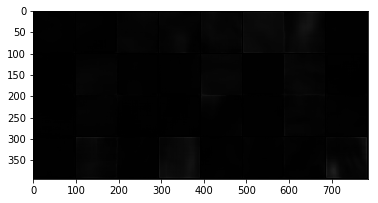

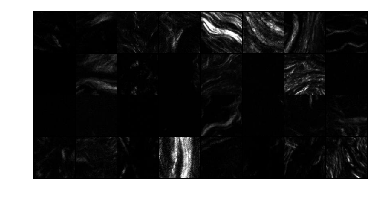

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


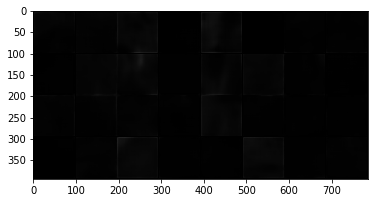

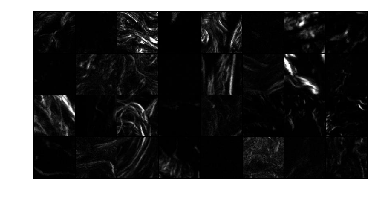

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


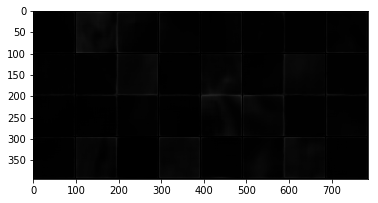

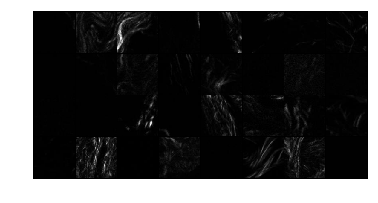

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


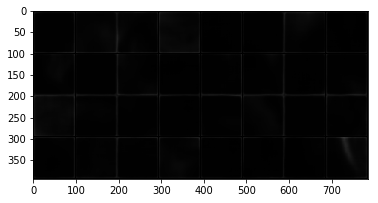

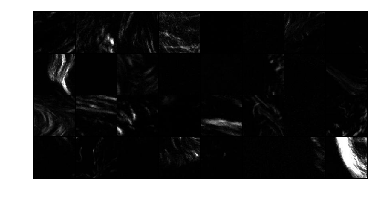

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


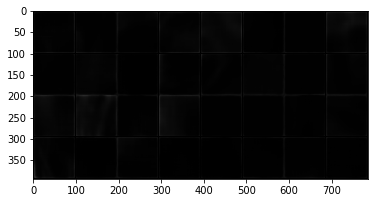

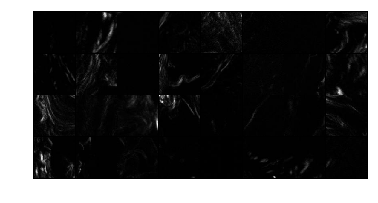

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


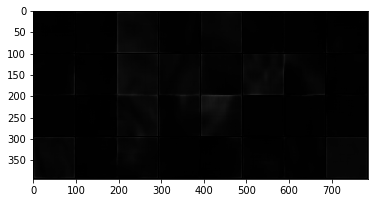

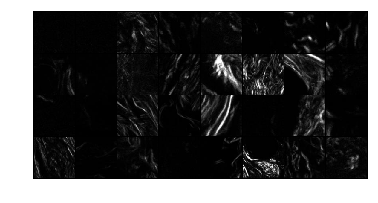

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


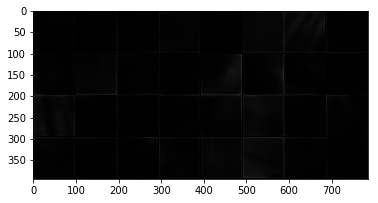

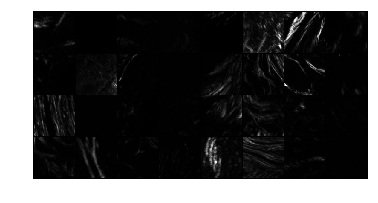

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


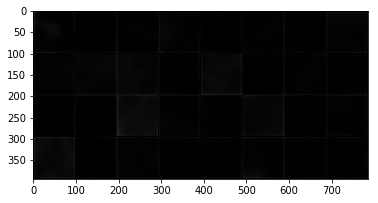

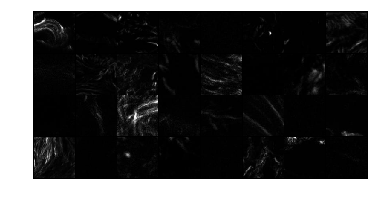

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


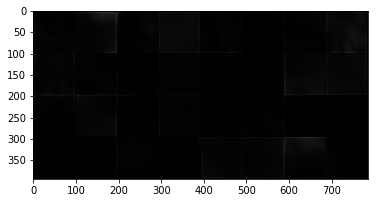

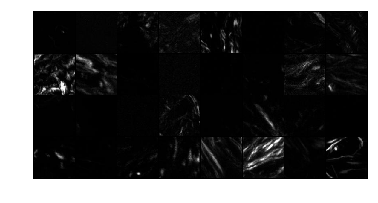

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


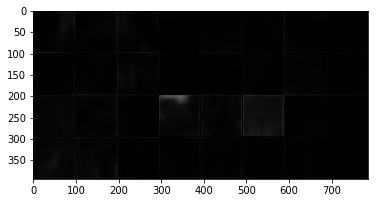

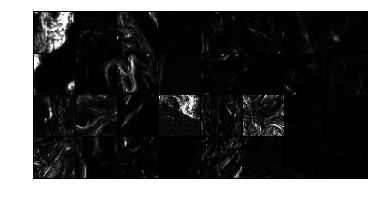

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


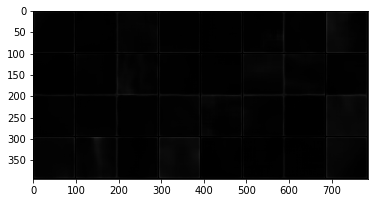

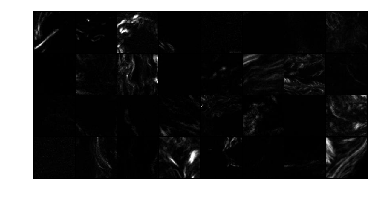

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


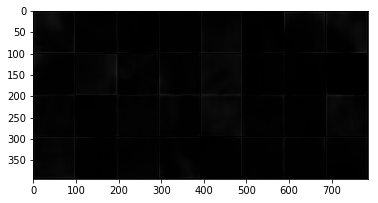

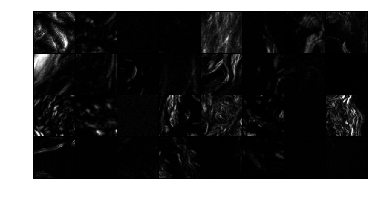

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


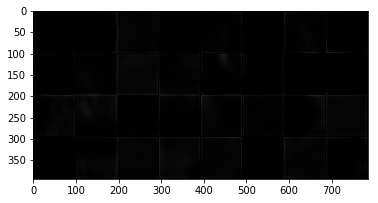

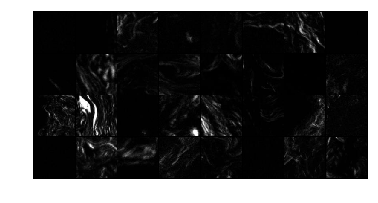

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


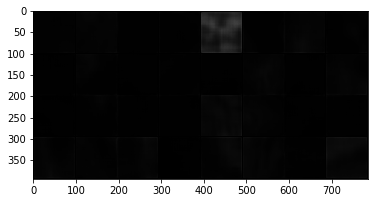

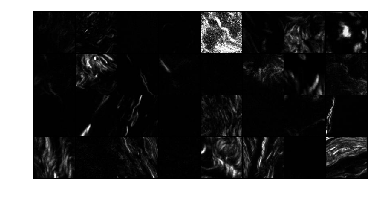

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


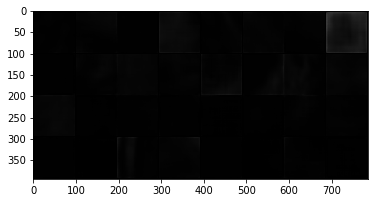

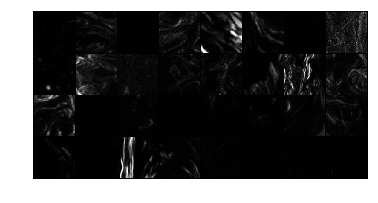

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


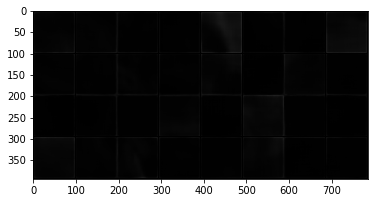

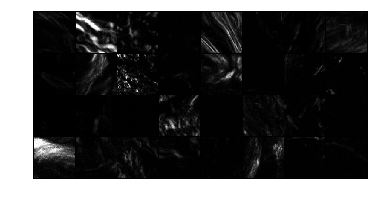

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


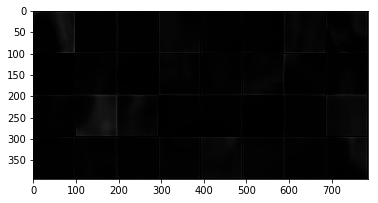

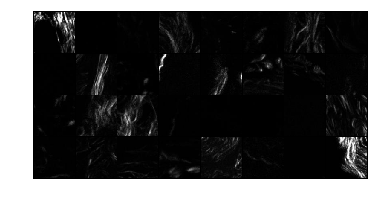

===> Avg. PSNR: nan dB


In [17]:
test()

In [18]:
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [19]:
for epoch in range(1, 20 + 1):
    train(epoch)
#     test()
#     checkpoint(epoch)

lossMSE: 0.007945235818624496 lossSSIM: 0.33534836769104004
===> Epoch[1](0/25343): Loss: 0.0898
lossMSE: 0.004066476598381996 lossSSIM: 0.24238532781600952
===> Epoch[1](50/25343): Loss: 0.0636
lossMSE: 0.004077968653291464 lossSSIM: 0.28258079290390015
===> Epoch[1](100/25343): Loss: 0.0737
lossMSE: 0.0071484679356217384 lossSSIM: 0.2803799510002136
===> Epoch[1](150/25343): Loss: 0.0755
lossMSE: 0.007389293052256107 lossSSIM: 0.24005627632141113
===> Epoch[1](200/25343): Loss: 0.0656
lossMSE: 0.0029260257724672556 lossSSIM: 0.1864500641822815
===> Epoch[1](250/25343): Loss: 0.0488
lossMSE: 0.0061559476889669895 lossSSIM: 0.2170008420944214
===> Epoch[1](300/25343): Loss: 0.0589
lossMSE: 0.015139126218855381 lossSSIM: 0.3245932459831238
===> Epoch[1](350/25343): Loss: 0.0925
lossMSE: 0.012857704423367977 lossSSIM: 0.34839117527008057
===> Epoch[1](400/25343): Loss: 0.0967
lossMSE: 0.007677312474697828 lossSSIM: 0.2671933174133301
===> Epoch[1](450/25343): Loss: 0.0726
lossMSE: 0.0036

KeyboardInterrupt: 

In [20]:
optimizer = optim.Adam(model.parameters(), lr=0.01)

In [21]:
for epoch in range(1, 20 + 1):
    train(epoch)
#     test()
#     checkpoint(epoch)

lossMSE: 0.00451630586758256 lossSSIM: 0.2781749367713928
===> Epoch[1](0/25343): Loss: 0.0729
lossMSE: 0.012334968894720078 lossSSIM: 0.3792368173599243
===> Epoch[1](50/25343): Loss: 0.1041
lossMSE: 0.014667532406747341 lossSSIM: 0.29796355962753296
===> Epoch[1](100/25343): Loss: 0.0855
lossMSE: 0.007166301365941763 lossSSIM: 0.31486523151397705
===> Epoch[1](150/25343): Loss: 0.0841
lossMSE: 0.007320455275475979 lossSSIM: 0.27221840620040894
===> Epoch[1](200/25343): Loss: 0.0735
lossMSE: 0.0050432113930583 lossSSIM: 0.3198395371437073
===> Epoch[1](250/25343): Loss: 0.0837
lossMSE: 0.005131853744387627 lossSSIM: 0.25063556432724
===> Epoch[1](300/25343): Loss: 0.0665
lossMSE: 0.006202658172696829 lossSSIM: 0.2805887460708618
===> Epoch[1](350/25343): Loss: 0.0748
lossMSE: 0.008176160044968128 lossSSIM: 0.3171144127845764
===> Epoch[1](400/25343): Loss: 0.0854
lossMSE: 0.007162471767514944 lossSSIM: 0.337712824344635
===> Epoch[1](450/25343): Loss: 0.0898
lossMSE: 0.003518610028550

KeyboardInterrupt: 

In [42]:
# batchsize 32->128
dataloader = DataLoader(transformed_dataset, batch_size=32,
                        shuffle=True, num_workers=0)

In [28]:
optimizer = optim.Adam(model.parameters(), lr=0.0001)

In [29]:
for epoch in range(1, 10 + 1):
    train(epoch)
#     test()
#     checkpoint(epoch)
#   p: 0.75->0.4

lossMSE: 0.006628135219216347 lossSSIM: 0.27069270610809326
===> Epoch[1](0/12672): Loss: 0.1651
lossMSE: 0.012355188839137554 lossSSIM: 0.3338363766670227
===> Epoch[1](50/12672): Loss: 0.2052
lossMSE: 0.00647505559027195 lossSSIM: 0.28285324573516846
===> Epoch[1](100/12672): Loss: 0.1723
lossMSE: 0.004710515029728413 lossSSIM: 0.23462313413619995
===> Epoch[1](150/12672): Loss: 0.1427
lossMSE: 0.008397608995437622 lossSSIM: 0.2900369167327881
===> Epoch[1](200/12672): Loss: 0.1774
lossMSE: 0.004393624607473612 lossSSIM: 0.2725712060928345
===> Epoch[1](250/12672): Loss: 0.1653
lossMSE: 0.007149954792112112 lossSSIM: 0.29467499256134033
===> Epoch[1](300/12672): Loss: 0.1797
lossMSE: 0.012229456566274166 lossSSIM: 0.3426175117492676
===> Epoch[1](350/12672): Loss: 0.2105
lossMSE: 0.005184449255466461 lossSSIM: 0.2668694257736206
===> Epoch[1](400/12672): Loss: 0.1622
lossMSE: 0.00963525753468275 lossSSIM: 0.2704867124557495
===> Epoch[1](450/12672): Loss: 0.1661
lossMSE: 0.0083799250

lossMSE: 0.005376753397285938 lossSSIM: 0.25341904163360596
===> Epoch[1](4150/12672): Loss: 0.1542
lossMSE: 0.009690907783806324 lossSSIM: 0.28546369075775146
===> Epoch[1](4200/12672): Loss: 0.1752
lossMSE: 0.010107623413205147 lossSSIM: 0.3210441470146179
===> Epoch[1](4250/12672): Loss: 0.1967
lossMSE: 0.00803953967988491 lossSSIM: 0.307047963142395
===> Epoch[1](4300/12672): Loss: 0.1874
lossMSE: 0.006501349154859781 lossSSIM: 0.27268511056900024
===> Epoch[1](4350/12672): Loss: 0.1662
lossMSE: 0.006909474264830351 lossSSIM: 0.25392472743988037
===> Epoch[1](4400/12672): Loss: 0.1551
lossMSE: 0.013735810294747353 lossSSIM: 0.3371453285217285
===> Epoch[1](4450/12672): Loss: 0.2078
lossMSE: 0.005699453875422478 lossSSIM: 0.2794218063354492
===> Epoch[1](4500/12672): Loss: 0.1699
lossMSE: 0.00516755785793066 lossSSIM: 0.23628908395767212
===> Epoch[1](4550/12672): Loss: 0.1438
lossMSE: 0.008453824557363987 lossSSIM: 0.282524049282074
===> Epoch[1](4600/12672): Loss: 0.1729
lossMSE: 

lossMSE: 0.006682763807475567 lossSSIM: 0.276020348072052
===> Epoch[1](8300/12672): Loss: 0.1683
lossMSE: 0.005500409286469221 lossSSIM: 0.2734360694885254
===> Epoch[1](8350/12672): Loss: 0.1663
lossMSE: 0.005970293655991554 lossSSIM: 0.2777137756347656
===> Epoch[1](8400/12672): Loss: 0.1690
lossMSE: 0.007735470775514841 lossSSIM: 0.30787479877471924
===> Epoch[1](8450/12672): Loss: 0.1878
lossMSE: 0.0076001351699233055 lossSSIM: 0.3242518901824951
===> Epoch[1](8500/12672): Loss: 0.1976
lossMSE: 0.006051091011613607 lossSSIM: 0.26839810609817505
===> Epoch[1](8550/12672): Loss: 0.1635
lossMSE: 0.00839095190167427 lossSSIM: 0.31016290187835693
===> Epoch[1](8600/12672): Loss: 0.1895
lossMSE: 0.006750250700861216 lossSSIM: 0.2921399474143982
===> Epoch[1](8650/12672): Loss: 0.1780
lossMSE: 0.007421515882015228 lossSSIM: 0.2584956884384155
===> Epoch[1](8700/12672): Loss: 0.1581
lossMSE: 0.01008373312652111 lossSSIM: 0.3093125820159912
===> Epoch[1](8750/12672): Loss: 0.1896
lossMSE: 

lossMSE: 0.006680699530988932 lossSSIM: 0.25072598457336426
===> Epoch[1](12450/12672): Loss: 0.1531
lossMSE: 0.004286604002118111 lossSSIM: 0.24674981832504272
===> Epoch[1](12500/12672): Loss: 0.1498
lossMSE: 0.013188138604164124 lossSSIM: 0.2890433669090271
===> Epoch[1](12550/12672): Loss: 0.1787
lossMSE: 0.005478466395288706 lossSSIM: 0.2489345669746399
===> Epoch[1](12600/12672): Loss: 0.1516
lossMSE: 0.006410668138414621 lossSSIM: 0.28819018602371216
===> Epoch[1](12650/12672): Loss: 0.1755
===> Epoch 1 Complete: Avg. Loss: 0.1688
lossMSE: 0.003801817772909999 lossSSIM: 0.2683888077735901
===> Epoch[2](0/12672): Loss: 0.1626
lossMSE: 0.007412710227072239 lossSSIM: 0.25993460416793823
===> Epoch[2](50/12672): Loss: 0.1589
lossMSE: 0.006428766530007124 lossSSIM: 0.28978949785232544
===> Epoch[2](100/12672): Loss: 0.1764
lossMSE: 0.003932386636734009 lossSSIM: 0.2783128023147583
===> Epoch[2](150/12672): Loss: 0.1686
lossMSE: 0.0032860818319022655 lossSSIM: 0.2248653769493103
===> 

lossMSE: 0.00638301158323884 lossSSIM: 0.24537676572799683
===> Epoch[2](3900/12672): Loss: 0.1498
lossMSE: 0.003934717737138271 lossSSIM: 0.1928032636642456
===> Epoch[2](3950/12672): Loss: 0.1173
lossMSE: 0.004143037833273411 lossSSIM: 0.2681272625923157
===> Epoch[2](4000/12672): Loss: 0.1625
lossMSE: 0.0067092496901750565 lossSSIM: 0.3037295937538147
===> Epoch[2](4050/12672): Loss: 0.1849
lossMSE: 0.0067175617441535 lossSSIM: 0.28007906675338745
===> Epoch[2](4100/12672): Loss: 0.1707
lossMSE: 0.012555448338389397 lossSSIM: 0.3186224699020386
===> Epoch[2](4150/12672): Loss: 0.1962
lossMSE: 0.007055322173982859 lossSSIM: 0.2753944396972656
===> Epoch[2](4200/12672): Loss: 0.1681
lossMSE: 0.01026330515742302 lossSSIM: 0.3141849637031555
===> Epoch[2](4250/12672): Loss: 0.1926
lossMSE: 0.005260994657874107 lossSSIM: 0.25836825370788574
===> Epoch[2](4300/12672): Loss: 0.1571
lossMSE: 0.006818598601967096 lossSSIM: 0.28208988904953003
===> Epoch[2](4350/12672): Loss: 0.1720
lossMSE: 

lossMSE: 0.006897419691085815 lossSSIM: 0.27150994539260864
===> Epoch[2](8050/12672): Loss: 0.1657
lossMSE: 0.005991686601191759 lossSSIM: 0.2570751905441284
===> Epoch[2](8100/12672): Loss: 0.1566
lossMSE: 0.008172659203410149 lossSSIM: 0.3099493980407715
===> Epoch[2](8150/12672): Loss: 0.1892
lossMSE: 0.006082913838326931 lossSSIM: 0.27940088510513306
===> Epoch[2](8200/12672): Loss: 0.1701
lossMSE: 0.005268409848213196 lossSSIM: 0.26591336727142334
===> Epoch[2](8250/12672): Loss: 0.1617
lossMSE: 0.009158658795058727 lossSSIM: 0.2661721110343933
===> Epoch[2](8300/12672): Loss: 0.1634
lossMSE: 0.007208414375782013 lossSSIM: 0.2804397940635681
===> Epoch[2](8350/12672): Loss: 0.1711
lossMSE: 0.00859712716192007 lossSSIM: 0.34740668535232544
===> Epoch[2](8400/12672): Loss: 0.2119
lossMSE: 0.005298044066876173 lossSSIM: 0.26549839973449707
===> Epoch[2](8450/12672): Loss: 0.1614
lossMSE: 0.006587914191186428 lossSSIM: 0.28497713804244995
===> Epoch[2](8500/12672): Loss: 0.1736
lossM

lossMSE: 0.0031908261589705944 lossSSIM: 0.22537589073181152
===> Epoch[2](12200/12672): Loss: 0.1365
lossMSE: 0.005786538124084473 lossSSIM: 0.27005136013031006
===> Epoch[2](12250/12672): Loss: 0.1643
lossMSE: 0.01067511085420847 lossSSIM: 0.279893159866333
===> Epoch[2](12300/12672): Loss: 0.1722
lossMSE: 0.002476181136444211 lossSSIM: 0.2330356240272522
===> Epoch[2](12350/12672): Loss: 0.1408
lossMSE: 0.004960280377417803 lossSSIM: 0.22384244203567505
===> Epoch[2](12400/12672): Loss: 0.1363
lossMSE: 0.006197283510118723 lossSSIM: 0.2624874711036682
===> Epoch[2](12450/12672): Loss: 0.1600
lossMSE: 0.007688815239816904 lossSSIM: 0.2295030951499939
===> Epoch[2](12500/12672): Loss: 0.1408
lossMSE: 0.008010290563106537 lossSSIM: 0.3313465118408203
===> Epoch[2](12550/12672): Loss: 0.2020
lossMSE: 0.008590297773480415 lossSSIM: 0.2741876244544983
===> Epoch[2](12600/12672): Loss: 0.1679
lossMSE: 0.0072501907125115395 lossSSIM: 0.28657543659210205
===> Epoch[2](12650/12672): Loss: 0.1

lossMSE: 0.005134871229529381 lossSSIM: 0.290927529335022
===> Epoch[3](3650/12672): Loss: 0.1766
lossMSE: 0.003297125454992056 lossSSIM: 0.20750999450683594
===> Epoch[3](3700/12672): Loss: 0.1258
lossMSE: 0.007895071059465408 lossSSIM: 0.3045172095298767
===> Epoch[3](3750/12672): Loss: 0.1859
lossMSE: 0.013393698260188103 lossSSIM: 0.26953619718551636
===> Epoch[3](3800/12672): Loss: 0.1671
lossMSE: 0.01380874402821064 lossSSIM: 0.299862802028656
===> Epoch[3](3850/12672): Loss: 0.1854
lossMSE: 0.0058802287094295025 lossSSIM: 0.2775292992591858
===> Epoch[3](3900/12672): Loss: 0.1689
lossMSE: 0.007950772531330585 lossSSIM: 0.2965676784515381
===> Epoch[3](3950/12672): Loss: 0.1811
lossMSE: 0.008337309584021568 lossSSIM: 0.2690693736076355
===> Epoch[3](4000/12672): Loss: 0.1648
lossMSE: 0.004558035172522068 lossSSIM: 0.2612736225128174
===> Epoch[3](4050/12672): Loss: 0.1586
lossMSE: 0.005397925619035959 lossSSIM: 0.23189783096313477
===> Epoch[3](4100/12672): Loss: 0.1413
lossMSE: 

lossMSE: 0.005688897334039211 lossSSIM: 0.27067089080810547
===> Epoch[3](7800/12672): Loss: 0.1647
lossMSE: 0.007095175329595804 lossSSIM: 0.26983338594436646
===> Epoch[3](7850/12672): Loss: 0.1647
lossMSE: 0.005962764378637075 lossSSIM: 0.2800997495651245
===> Epoch[3](7900/12672): Loss: 0.1704
lossMSE: 0.005503874737769365 lossSSIM: 0.28141939640045166
===> Epoch[3](7950/12672): Loss: 0.1711
lossMSE: 0.0103460056707263 lossSSIM: 0.3035672903060913
===> Epoch[3](8000/12672): Loss: 0.1863
lossMSE: 0.0044034323655068874 lossSSIM: 0.2472100853919983
===> Epoch[3](8050/12672): Loss: 0.1501
lossMSE: 0.0060350545682013035 lossSSIM: 0.2753726840019226
===> Epoch[3](8100/12672): Loss: 0.1676
lossMSE: 0.0028522119391709566 lossSSIM: 0.20924198627471924
===> Epoch[3](8150/12672): Loss: 0.1267
lossMSE: 0.006918247323483229 lossSSIM: 0.2728169560432434
===> Epoch[3](8200/12672): Loss: 0.1665
lossMSE: 0.008471858687698841 lossSSIM: 0.29974615573883057
===> Epoch[3](8250/12672): Loss: 0.1832
loss

lossMSE: 0.008858125656843185 lossSSIM: 0.3062673807144165
===> Epoch[3](11900/12672): Loss: 0.1873
lossMSE: 0.010805443860590458 lossSSIM: 0.25948911905288696
===> Epoch[3](11950/12672): Loss: 0.1600
lossMSE: 0.006842183414846659 lossSSIM: 0.2901790142059326
===> Epoch[3](12000/12672): Loss: 0.1768
lossMSE: 0.006169072352349758 lossSSIM: 0.28758883476257324
===> Epoch[3](12050/12672): Loss: 0.1750
lossMSE: 0.0031878112349659204 lossSSIM: 0.23582333326339722
===> Epoch[3](12100/12672): Loss: 0.1428
lossMSE: 0.00924164429306984 lossSSIM: 0.2567750811576843
===> Epoch[3](12150/12672): Loss: 0.1578
lossMSE: 0.004030083306133747 lossSSIM: 0.2386925220489502
===> Epoch[3](12200/12672): Loss: 0.1448
lossMSE: 0.007386660203337669 lossSSIM: 0.30810558795928955
===> Epoch[3](12250/12672): Loss: 0.1878
lossMSE: 0.004299754276871681 lossSSIM: 0.24452632665634155
===> Epoch[3](12300/12672): Loss: 0.1484
lossMSE: 0.007506964728236198 lossSSIM: 0.30118292570114136
===> Epoch[3](12350/12672): Loss: 0

lossMSE: 0.008834480307996273 lossSSIM: 0.271431565284729
===> Epoch[4](3300/12672): Loss: 0.1664
lossMSE: 0.006256259046494961 lossSSIM: 0.28122180700302124
===> Epoch[4](3350/12672): Loss: 0.1712
lossMSE: 0.005275099538266659 lossSSIM: 0.27542734146118164
===> Epoch[4](3400/12672): Loss: 0.1674
lossMSE: 0.004949178081005812 lossSSIM: 0.23173755407333374
===> Epoch[4](3450/12672): Loss: 0.1410
lossMSE: 0.009009773842990398 lossSSIM: 0.28537243604660034
===> Epoch[4](3500/12672): Loss: 0.1748
lossMSE: 0.013743896037340164 lossSSIM: 0.2822954058647156
===> Epoch[4](3550/12672): Loss: 0.1749
lossMSE: 0.007243565283715725 lossSSIM: 0.2572062015533447
===> Epoch[4](3600/12672): Loss: 0.1572
lossMSE: 0.006563217844814062 lossSSIM: 0.28003817796707153
===> Epoch[4](3650/12672): Loss: 0.1706
lossMSE: 0.0035627451725304127 lossSSIM: 0.25720012187957764
===> Epoch[4](3700/12672): Loss: 0.1557
lossMSE: 0.006263978313654661 lossSSIM: 0.27387893199920654
===> Epoch[4](3750/12672): Loss: 0.1668
los

lossMSE: 0.005263566970825195 lossSSIM: 0.28241634368896484
===> Epoch[4](7450/12672): Loss: 0.1716
lossMSE: 0.006169140804558992 lossSSIM: 0.2514565587043762
===> Epoch[4](7500/12672): Loss: 0.1533
lossMSE: 0.00556415319442749 lossSSIM: 0.24094420671463013
===> Epoch[4](7550/12672): Loss: 0.1468
lossMSE: 0.006000027060508728 lossSSIM: 0.2986885905265808
===> Epoch[4](7600/12672): Loss: 0.1816
lossMSE: 0.005978202447295189 lossSSIM: 0.2800900340080261
===> Epoch[4](7650/12672): Loss: 0.1704
lossMSE: 0.007713275030255318 lossSSIM: 0.2999016046524048
===> Epoch[4](7700/12672): Loss: 0.1830
lossMSE: 0.006201045587658882 lossSSIM: 0.29090195894241333
===> Epoch[4](7750/12672): Loss: 0.1770
lossMSE: 0.005629975814372301 lossSSIM: 0.26489466428756714
===> Epoch[4](7800/12672): Loss: 0.1612
lossMSE: 0.008734211325645447 lossSSIM: 0.2862701416015625
===> Epoch[4](7850/12672): Loss: 0.1753
lossMSE: 0.010090034455060959 lossSSIM: 0.2526106834411621
===> Epoch[4](7900/12672): Loss: 0.1556
lossMSE

lossMSE: 0.006103786639869213 lossSSIM: 0.2649296522140503
===> Epoch[4](11600/12672): Loss: 0.1614
lossMSE: 0.009505309164524078 lossSSIM: 0.2947655916213989
===> Epoch[4](11650/12672): Loss: 0.1807
lossMSE: 0.005196309182792902 lossSSIM: 0.22774821519851685
===> Epoch[4](11700/12672): Loss: 0.1387
lossMSE: 0.007704576477408409 lossSSIM: 0.27400457859039307
===> Epoch[4](11750/12672): Loss: 0.1675
lossMSE: 0.012768437154591084 lossSSIM: 0.30121439695358276
===> Epoch[4](11800/12672): Loss: 0.1858
lossMSE: 0.006976585369557142 lossSSIM: 0.25049281120300293
===> Epoch[4](11850/12672): Loss: 0.1531
lossMSE: 0.006910071242600679 lossSSIM: 0.30584174394607544
===> Epoch[4](11900/12672): Loss: 0.1863
lossMSE: 0.010426025837659836 lossSSIM: 0.27889907360076904
===> Epoch[4](11950/12672): Loss: 0.1715
lossMSE: 0.008184329606592655 lossSSIM: 0.29495251178741455
===> Epoch[4](12000/12672): Loss: 0.1802
lossMSE: 0.0049864803440868855 lossSSIM: 0.269554078578949
===> Epoch[4](12050/12672): Loss: 

lossMSE: 0.009679194539785385 lossSSIM: 0.3034157156944275
===> Epoch[5](3000/12672): Loss: 0.1859
lossMSE: 0.006195211783051491 lossSSIM: 0.25670135021209717
===> Epoch[5](3050/12672): Loss: 0.1565
lossMSE: 0.0041084010154008865 lossSSIM: 0.2663607597351074
===> Epoch[5](3100/12672): Loss: 0.1615
lossMSE: 0.00759074417874217 lossSSIM: 0.28037601709365845
===> Epoch[5](3150/12672): Loss: 0.1713
lossMSE: 0.010664607398211956 lossSSIM: 0.2960684895515442
===> Epoch[5](3200/12672): Loss: 0.1819
lossMSE: 0.008984032087028027 lossSSIM: 0.2880418300628662
===> Epoch[5](3250/12672): Loss: 0.1764
lossMSE: 0.0038372650742530823 lossSSIM: 0.2414599061012268
===> Epoch[5](3300/12672): Loss: 0.1464
lossMSE: 0.005947452504187822 lossSSIM: 0.22768616676330566
===> Epoch[5](3350/12672): Loss: 0.1390
lossMSE: 0.010532059706747532 lossSSIM: 0.2764437198638916
===> Epoch[5](3400/12672): Loss: 0.1701
lossMSE: 0.00424715643748641 lossSSIM: 0.24459677934646606
===> Epoch[5](3450/12672): Loss: 0.1485
lossMS

lossMSE: 0.007039599120616913 lossSSIM: 0.27470964193344116
===> Epoch[5](7150/12672): Loss: 0.1676
lossMSE: 0.006992025300860405 lossSSIM: 0.2630748152732849
===> Epoch[5](7200/12672): Loss: 0.1606
lossMSE: 0.00663885148242116 lossSSIM: 0.295315682888031
===> Epoch[5](7250/12672): Loss: 0.1798
lossMSE: 0.010819493792951107 lossSSIM: 0.2958261966705322
===> Epoch[5](7300/12672): Loss: 0.1818
lossMSE: 0.005016067530959845 lossSSIM: 0.22893297672271729
===> Epoch[5](7350/12672): Loss: 0.1394
lossMSE: 0.008536781184375286 lossSSIM: 0.30365097522735596
===> Epoch[5](7400/12672): Loss: 0.1856
lossMSE: 0.006713605485856533 lossSSIM: 0.2880175709724426
===> Epoch[5](7450/12672): Loss: 0.1755
lossMSE: 0.010038710199296474 lossSSIM: 0.28988051414489746
===> Epoch[5](7500/12672): Loss: 0.1779
lossMSE: 0.005221040919423103 lossSSIM: 0.25030040740966797
===> Epoch[5](7550/12672): Loss: 0.1523
lossMSE: 0.006137816235423088 lossSSIM: 0.2630707025527954
===> Epoch[5](7600/12672): Loss: 0.1603
lossMSE

lossMSE: 0.01202927902340889 lossSSIM: 0.305392861366272
===> Epoch[5](11300/12672): Loss: 0.1880
lossMSE: 0.011187463998794556 lossSSIM: 0.29853665828704834
===> Epoch[5](11350/12672): Loss: 0.1836
lossMSE: 0.005314886104315519 lossSSIM: 0.24700170755386353
===> Epoch[5](11400/12672): Loss: 0.1503
lossMSE: 0.008351333439350128 lossSSIM: 0.2590121030807495
===> Epoch[5](11450/12672): Loss: 0.1587
lossMSE: 0.009722305461764336 lossSSIM: 0.2847059965133667
===> Epoch[5](11500/12672): Loss: 0.1747
lossMSE: 0.007987121120095253 lossSSIM: 0.28023451566696167
===> Epoch[5](11550/12672): Loss: 0.1713
lossMSE: 0.003491149516776204 lossSSIM: 0.23151206970214844
===> Epoch[5](11600/12672): Loss: 0.1403
lossMSE: 0.005752557888627052 lossSSIM: 0.2417500615119934
===> Epoch[5](11650/12672): Loss: 0.1474
lossMSE: 0.005170139484107494 lossSSIM: 0.26641517877578735
===> Epoch[5](11700/12672): Loss: 0.1619
lossMSE: 0.006629031151533127 lossSSIM: 0.26573652029037476
===> Epoch[5](11750/12672): Loss: 0.1

lossMSE: 0.007359233219176531 lossSSIM: 0.294791579246521
===> Epoch[6](2700/12672): Loss: 0.1798
lossMSE: 0.006705883890390396 lossSSIM: 0.24078816175460815
===> Epoch[6](2750/12672): Loss: 0.1472
lossMSE: 0.010039778426289558 lossSSIM: 0.29972678422927856
===> Epoch[6](2800/12672): Loss: 0.1839
lossMSE: 0.005512372124940157 lossSSIM: 0.2297729253768921
===> Epoch[6](2850/12672): Loss: 0.1401
lossMSE: 0.007366635836660862 lossSSIM: 0.24865972995758057
===> Epoch[6](2900/12672): Loss: 0.1521
lossMSE: 0.005756784696131945 lossSSIM: 0.27921009063720703
===> Epoch[6](2950/12672): Loss: 0.1698
lossMSE: 0.013727189041674137 lossSSIM: 0.3339161276817322
===> Epoch[6](3000/12672): Loss: 0.2058
lossMSE: 0.00978971365839243 lossSSIM: 0.2904456853866577
===> Epoch[6](3050/12672): Loss: 0.1782
lossMSE: 0.007046176120638847 lossSSIM: 0.27085423469543457
===> Epoch[6](3100/12672): Loss: 0.1653
lossMSE: 0.005246750079095364 lossSSIM: 0.21371203660964966
===> Epoch[6](3150/12672): Loss: 0.1303
lossMS

lossMSE: 0.005161518231034279 lossSSIM: 0.2476428747177124
===> Epoch[6](6850/12672): Loss: 0.1507
lossMSE: 0.004709308966994286 lossSSIM: 0.24457257986068726
===> Epoch[6](6900/12672): Loss: 0.1486
lossMSE: 0.007611148990690708 lossSSIM: 0.2932435870170593
===> Epoch[6](6950/12672): Loss: 0.1790
lossMSE: 0.009952417574822903 lossSSIM: 0.29691869020462036
===> Epoch[6](7000/12672): Loss: 0.1821
lossMSE: 0.009118905290961266 lossSSIM: 0.3006974458694458
===> Epoch[6](7050/12672): Loss: 0.1841
lossMSE: 0.006063844542950392 lossSSIM: 0.261615514755249
===> Epoch[6](7100/12672): Loss: 0.1594
lossMSE: 0.004923852160573006 lossSSIM: 0.23927390575408936
===> Epoch[6](7150/12672): Loss: 0.1455
lossMSE: 0.011502590961754322 lossSSIM: 0.3526243567466736
===> Epoch[6](7200/12672): Loss: 0.2162
lossMSE: 0.007370028179138899 lossSSIM: 0.270344078540802
===> Epoch[6](7250/12672): Loss: 0.1652
lossMSE: 0.0033449912443757057 lossSSIM: 0.24406123161315918
===> Epoch[6](7300/12672): Loss: 0.1478
lossMSE

lossMSE: 0.008398452773690224 lossSSIM: 0.31814175844192505
===> Epoch[6](11000/12672): Loss: 0.1942
lossMSE: 0.00537868170067668 lossSSIM: 0.25887012481689453
===> Epoch[6](11050/12672): Loss: 0.1575
lossMSE: 0.008739861659705639 lossSSIM: 0.256736159324646
===> Epoch[6](11100/12672): Loss: 0.1575
lossMSE: 0.0058868941850960255 lossSSIM: 0.2849544882774353
===> Epoch[6](11150/12672): Loss: 0.1733
lossMSE: 0.0062959520146250725 lossSSIM: 0.2745048999786377
===> Epoch[6](11200/12672): Loss: 0.1672
lossMSE: 0.009648884646594524 lossSSIM: 0.2983875274658203
===> Epoch[6](11250/12672): Loss: 0.1829
lossMSE: 0.0038213911466300488 lossSSIM: 0.288149356842041
===> Epoch[6](11300/12672): Loss: 0.1744
lossMSE: 0.008409862406551838 lossSSIM: 0.2624468207359314
===> Epoch[6](11350/12672): Loss: 0.1608
lossMSE: 0.005141176749020815 lossSSIM: 0.26184242963790894
===> Epoch[6](11400/12672): Loss: 0.1592
lossMSE: 0.006600501015782356 lossSSIM: 0.24411672353744507
===> Epoch[6](11450/12672): Loss: 0.1

lossMSE: 0.00521240197122097 lossSSIM: 0.23115932941436768
===> Epoch[7](2400/12672): Loss: 0.1408
lossMSE: 0.010100959800183773 lossSSIM: 0.2751253843307495
===> Epoch[7](2450/12672): Loss: 0.1691
lossMSE: 0.0059534702450037 lossSSIM: 0.22007781267166138
===> Epoch[7](2500/12672): Loss: 0.1344
lossMSE: 0.005041639786213636 lossSSIM: 0.27723193168640137
===> Epoch[7](2550/12672): Loss: 0.1684
lossMSE: 0.008649875409901142 lossSSIM: 0.32122474908828735
===> Epoch[7](2600/12672): Loss: 0.1962
lossMSE: 0.005162993911653757 lossSSIM: 0.26819705963134766
===> Epoch[7](2650/12672): Loss: 0.1630
lossMSE: 0.005312974564731121 lossSSIM: 0.2919182777404785
===> Epoch[7](2700/12672): Loss: 0.1773
lossMSE: 0.015069987624883652 lossSSIM: 0.3428646922111511
===> Epoch[7](2750/12672): Loss: 0.2117
lossMSE: 0.006990058347582817 lossSSIM: 0.24429208040237427
===> Epoch[7](2800/12672): Loss: 0.1494
lossMSE: 0.008816566318273544 lossSSIM: 0.3419393301010132
===> Epoch[7](2850/12672): Loss: 0.2087
lossMSE

lossMSE: 0.007897116243839264 lossSSIM: 0.2667505741119385
===> Epoch[7](6550/12672): Loss: 0.1632
lossMSE: 0.005958057940006256 lossSSIM: 0.25426608324050903
===> Epoch[7](6600/12672): Loss: 0.1549
lossMSE: 0.007764097768813372 lossSSIM: 0.2923109531402588
===> Epoch[7](6650/12672): Loss: 0.1785
lossMSE: 0.0034071318805217743 lossSSIM: 0.255675733089447
===> Epoch[7](6700/12672): Loss: 0.1548
lossMSE: 0.006775480229407549 lossSSIM: 0.32135266065597534
===> Epoch[7](6750/12672): Loss: 0.1955
lossMSE: 0.0072864932008087635 lossSSIM: 0.2604718804359436
===> Epoch[7](6800/12672): Loss: 0.1592
lossMSE: 0.00953267328441143 lossSSIM: 0.3050689101219177
===> Epoch[7](6850/12672): Loss: 0.1869
lossMSE: 0.010225438512861729 lossSSIM: 0.25237977504730225
===> Epoch[7](6900/12672): Loss: 0.1555
lossMSE: 0.006308269686996937 lossSSIM: 0.28827041387557983
===> Epoch[7](6950/12672): Loss: 0.1755
lossMSE: 0.0071625858545303345 lossSSIM: 0.2399996519088745
===> Epoch[7](7000/12672): Loss: 0.1469
lossM

lossMSE: 0.003107498399913311 lossSSIM: 0.2448062300682068
===> Epoch[7](10700/12672): Loss: 0.1481
lossMSE: 0.005732664838433266 lossSSIM: 0.2792091965675354
===> Epoch[7](10750/12672): Loss: 0.1698
lossMSE: 0.0123139014467597 lossSSIM: 0.2767787575721741
===> Epoch[7](10800/12672): Loss: 0.1710
lossMSE: 0.006720843259245157 lossSSIM: 0.2786123752593994
===> Epoch[7](10850/12672): Loss: 0.1699
lossMSE: 0.006321674212813377 lossSSIM: 0.247114360332489
===> Epoch[7](10900/12672): Loss: 0.1508
lossMSE: 0.0074747768230736256 lossSSIM: 0.27818936109542847
===> Epoch[7](10950/12672): Loss: 0.1699
lossMSE: 0.0058784885331988335 lossSSIM: 0.26932698488235474
===> Epoch[7](11000/12672): Loss: 0.1639
lossMSE: 0.01015382632613182 lossSSIM: 0.26524633169174194
===> Epoch[7](11050/12672): Loss: 0.1632
lossMSE: 0.0054924082942306995 lossSSIM: 0.24283069372177124
===> Epoch[7](11100/12672): Loss: 0.1479
lossMSE: 0.004827756900340319 lossSSIM: 0.2580571174621582
===> Epoch[7](11150/12672): Loss: 0.15

lossMSE: 0.00455882865935564 lossSSIM: 0.2398408055305481
===> Epoch[8](2100/12672): Loss: 0.1457
lossMSE: 0.008924584835767746 lossSSIM: 0.27994704246520996
===> Epoch[8](2150/12672): Loss: 0.1715
lossMSE: 0.004397324752062559 lossSSIM: 0.2390802502632141
===> Epoch[8](2200/12672): Loss: 0.1452
lossMSE: 0.008223363198339939 lossSSIM: 0.2598176598548889
===> Epoch[8](2250/12672): Loss: 0.1592
lossMSE: 0.0037679660599678755 lossSSIM: 0.2138671875
===> Epoch[8](2300/12672): Loss: 0.1298
lossMSE: 0.010951661504805088 lossSSIM: 0.28351497650146484
===> Epoch[8](2350/12672): Loss: 0.1745
lossMSE: 0.006719266064465046 lossSSIM: 0.29676634073257446
===> Epoch[8](2400/12672): Loss: 0.1807
lossMSE: 0.007832725532352924 lossSSIM: 0.27236998081207275
===> Epoch[8](2450/12672): Loss: 0.1666
lossMSE: 0.004967674612998962 lossSSIM: 0.2869073152542114
===> Epoch[8](2500/12672): Loss: 0.1741
lossMSE: 0.007635969202965498 lossSSIM: 0.30089426040649414
===> Epoch[8](2550/12672): Loss: 0.1836
lossMSE: 0.

lossMSE: 0.004321284592151642 lossSSIM: 0.2537660598754883
===> Epoch[8](6250/12672): Loss: 0.1540
lossMSE: 0.00804514903575182 lossSSIM: 0.28733348846435547
===> Epoch[8](6300/12672): Loss: 0.1756
lossMSE: 0.0045145293697714806 lossSSIM: 0.25126707553863525
===> Epoch[8](6350/12672): Loss: 0.1526
lossMSE: 0.006975499447435141 lossSSIM: 0.2950718402862549
===> Epoch[8](6400/12672): Loss: 0.1798
lossMSE: 0.009393267333507538 lossSSIM: 0.23800450563430786
===> Epoch[8](6450/12672): Loss: 0.1466
lossMSE: 0.007551148533821106 lossSSIM: 0.29088836908340454
===> Epoch[8](6500/12672): Loss: 0.1776
lossMSE: 0.007362204138189554 lossSSIM: 0.304557204246521
===> Epoch[8](6550/12672): Loss: 0.1857
lossMSE: 0.0021919547580182552 lossSSIM: 0.2049352526664734
===> Epoch[8](6600/12672): Loss: 0.1238
lossMSE: 0.007646890357136726 lossSSIM: 0.2554965615272522
===> Epoch[8](6650/12672): Loss: 0.1564
lossMSE: 0.005929064936935902 lossSSIM: 0.2594108581542969
===> Epoch[8](6700/12672): Loss: 0.1580
lossMS

lossMSE: 0.005732993129640818 lossSSIM: 0.28205442428588867
===> Epoch[8](10400/12672): Loss: 0.1715
lossMSE: 0.006931872572749853 lossSSIM: 0.2847193479537964
===> Epoch[8](10450/12672): Loss: 0.1736
lossMSE: 0.0034710047766566277 lossSSIM: 0.25369763374328613
===> Epoch[8](10500/12672): Loss: 0.1536
lossMSE: 0.011571266688406467 lossSSIM: 0.3038559556007385
===> Epoch[8](10550/12672): Loss: 0.1869
lossMSE: 0.0028455292340368032 lossSSIM: 0.22163540124893188
===> Epoch[8](10600/12672): Loss: 0.1341
lossMSE: 0.004872169811278582 lossSSIM: 0.23558521270751953
===> Epoch[8](10650/12672): Loss: 0.1433
lossMSE: 0.005474908743053675 lossSSIM: 0.2393810749053955
===> Epoch[8](10700/12672): Loss: 0.1458
lossMSE: 0.006834292318671942 lossSSIM: 0.2928234934806824
===> Epoch[8](10750/12672): Loss: 0.1784
lossMSE: 0.008834108710289001 lossSSIM: 0.27966517210006714
===> Epoch[8](10800/12672): Loss: 0.1713
lossMSE: 0.005964952986687422 lossSSIM: 0.2601832151412964
===> Epoch[8](10850/12672): Loss: 

lossMSE: 0.006262181326746941 lossSSIM: 0.28331828117370605
===> Epoch[9](1800/12672): Loss: 0.1725
lossMSE: 0.003780780592933297 lossSSIM: 0.2798759341239929
===> Epoch[9](1850/12672): Loss: 0.1694
lossMSE: 0.005388940218836069 lossSSIM: 0.25086456537246704
===> Epoch[9](1900/12672): Loss: 0.1527
lossMSE: 0.012317116372287273 lossSSIM: 0.2868801951408386
===> Epoch[9](1950/12672): Loss: 0.1771
lossMSE: 0.0048318286426365376 lossSSIM: 0.22010844945907593
===> Epoch[9](2000/12672): Loss: 0.1340
lossMSE: 0.006321204360574484 lossSSIM: 0.23969542980194092
===> Epoch[9](2050/12672): Loss: 0.1463
lossMSE: 0.006004596594721079 lossSSIM: 0.2707718014717102
===> Epoch[9](2100/12672): Loss: 0.1649
lossMSE: 0.0038561346009373665 lossSSIM: 0.24144452810287476
===> Epoch[9](2150/12672): Loss: 0.1464
lossMSE: 0.0043208240531384945 lossSSIM: 0.27932703495025635
===> Epoch[9](2200/12672): Loss: 0.1693
lossMSE: 0.006569657940417528 lossSSIM: 0.2914511561393738
===> Epoch[9](2250/12672): Loss: 0.1775
l

lossMSE: 0.004359951242804527 lossSSIM: 0.27912670373916626
===> Epoch[9](5950/12672): Loss: 0.1692
lossMSE: 0.0064603728242218494 lossSSIM: 0.26352137327194214
===> Epoch[9](6000/12672): Loss: 0.1607
lossMSE: 0.005784061271697283 lossSSIM: 0.2371659278869629
===> Epoch[9](6050/12672): Loss: 0.1446
lossMSE: 0.008729178458452225 lossSSIM: 0.2997501492500305
===> Epoch[9](6100/12672): Loss: 0.1833
lossMSE: 0.007357701659202576 lossSSIM: 0.28820669651031494
===> Epoch[9](6150/12672): Loss: 0.1759
lossMSE: 0.008215014822781086 lossSSIM: 0.27493125200271606
===> Epoch[9](6200/12672): Loss: 0.1682
lossMSE: 0.007690171245485544 lossSSIM: 0.2541469931602478
===> Epoch[9](6250/12672): Loss: 0.1556
lossMSE: 0.003275888739153743 lossSSIM: 0.2206735610961914
===> Epoch[9](6300/12672): Loss: 0.1337
lossMSE: 0.0058733075857162476 lossSSIM: 0.30121487379074097
===> Epoch[9](6350/12672): Loss: 0.1831
lossMSE: 0.007954105734825134 lossSSIM: 0.2865315079689026
===> Epoch[9](6400/12672): Loss: 0.1751
los

lossMSE: 0.005273950751870871 lossSSIM: 0.26589399576187134
===> Epoch[9](10100/12672): Loss: 0.1616
lossMSE: 0.006453006528317928 lossSSIM: 0.2547764182090759
===> Epoch[9](10150/12672): Loss: 0.1554
lossMSE: 0.006400587502866983 lossSSIM: 0.25582385063171387
===> Epoch[9](10200/12672): Loss: 0.1561
lossMSE: 0.00637871352955699 lossSSIM: 0.2588942050933838
===> Epoch[9](10250/12672): Loss: 0.1579
lossMSE: 0.006121307145804167 lossSSIM: 0.28769922256469727
===> Epoch[9](10300/12672): Loss: 0.1751
lossMSE: 0.007497074082493782 lossSSIM: 0.290749728679657
===> Epoch[9](10350/12672): Loss: 0.1774
lossMSE: 0.0037288020830601454 lossSSIM: 0.24887412786483765
===> Epoch[9](10400/12672): Loss: 0.1508
lossMSE: 0.00782769825309515 lossSSIM: 0.30015379190444946
===> Epoch[9](10450/12672): Loss: 0.1832
lossMSE: 0.005573290400207043 lossSSIM: 0.26921170949935913
===> Epoch[9](10500/12672): Loss: 0.1638
lossMSE: 0.0049031819216907024 lossSSIM: 0.25975245237350464
===> Epoch[9](10550/12672): Loss: 0

lossMSE: 0.009682077914476395 lossSSIM: 0.29266542196273804
===> Epoch[10](1500/12672): Loss: 0.1795
lossMSE: 0.0039173513650894165 lossSSIM: 0.2604803442955017
===> Epoch[10](1550/12672): Loss: 0.1579
lossMSE: 0.007757673505693674 lossSSIM: 0.26765549182891846
===> Epoch[10](1600/12672): Loss: 0.1637
lossMSE: 0.004096102900803089 lossSSIM: 0.26998400688171387
===> Epoch[10](1650/12672): Loss: 0.1636
lossMSE: 0.010446326807141304 lossSSIM: 0.26733285188674927
===> Epoch[10](1700/12672): Loss: 0.1646
lossMSE: 0.00455078249797225 lossSSIM: 0.267641544342041
===> Epoch[10](1750/12672): Loss: 0.1624
lossMSE: 0.007589458487927914 lossSSIM: 0.2391606569290161
===> Epoch[10](1800/12672): Loss: 0.1465
lossMSE: 0.006567798089236021 lossSSIM: 0.26113420724868774
===> Epoch[10](1850/12672): Loss: 0.1593
lossMSE: 0.005373945459723473 lossSSIM: 0.30534934997558594
===> Epoch[10](1900/12672): Loss: 0.1854
lossMSE: 0.00737020606175065 lossSSIM: 0.2781875729560852
===> Epoch[10](1950/12672): Loss: 0.1

lossMSE: 0.013133615255355835 lossSSIM: 0.2625380754470825
===> Epoch[10](5600/12672): Loss: 0.1628
lossMSE: 0.0039653112180531025 lossSSIM: 0.24041587114334106
===> Epoch[10](5650/12672): Loss: 0.1458
lossMSE: 0.007702547591179609 lossSSIM: 0.25455641746520996
===> Epoch[10](5700/12672): Loss: 0.1558
lossMSE: 0.01286392193287611 lossSSIM: 0.28262782096862793
===> Epoch[10](5750/12672): Loss: 0.1747
lossMSE: 0.008141198195517063 lossSSIM: 0.26395750045776367
===> Epoch[10](5800/12672): Loss: 0.1616
lossMSE: 0.007764314766973257 lossSSIM: 0.2964370846748352
===> Epoch[10](5850/12672): Loss: 0.1810
lossMSE: 0.009425816126167774 lossSSIM: 0.2994714379310608
===> Epoch[10](5900/12672): Loss: 0.1835
lossMSE: 0.0074004074558615685 lossSSIM: 0.23248249292373657
===> Epoch[10](5950/12672): Loss: 0.1424
lossMSE: 0.0051793307065963745 lossSSIM: 0.24219292402267456
===> Epoch[10](6000/12672): Loss: 0.1474
lossMSE: 0.006978179793804884 lossSSIM: 0.295971155166626
===> Epoch[10](6050/12672): Loss: 

lossMSE: 0.0072118062525987625 lossSSIM: 0.2539949417114258
===> Epoch[10](9700/12672): Loss: 0.1553
lossMSE: 0.008542612195014954 lossSSIM: 0.3139973282814026
===> Epoch[10](9750/12672): Loss: 0.1918
lossMSE: 0.013149498030543327 lossSSIM: 0.29900652170181274
===> Epoch[10](9800/12672): Loss: 0.1847
lossMSE: 0.0078050196170806885 lossSSIM: 0.29597771167755127
===> Epoch[10](9850/12672): Loss: 0.1807
lossMSE: 0.005730729550123215 lossSSIM: 0.24911147356033325
===> Epoch[10](9900/12672): Loss: 0.1518
lossMSE: 0.006550212856382132 lossSSIM: 0.2511063814163208
===> Epoch[10](9950/12672): Loss: 0.1533
lossMSE: 0.004275858867913485 lossSSIM: 0.28721731901168823
===> Epoch[10](10000/12672): Loss: 0.1740
lossMSE: 0.004409245681017637 lossSSIM: 0.26403379440307617
===> Epoch[10](10050/12672): Loss: 0.1602
lossMSE: 0.005123928189277649 lossSSIM: 0.25129109621047974
===> Epoch[10](10100/12672): Loss: 0.1528
lossMSE: 0.006435670889914036 lossSSIM: 0.2662333846092224
===> Epoch[10](10150/12672): L

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


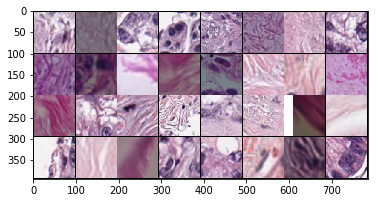

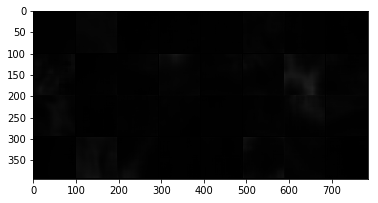

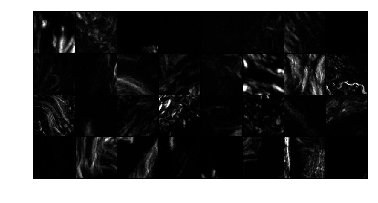

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


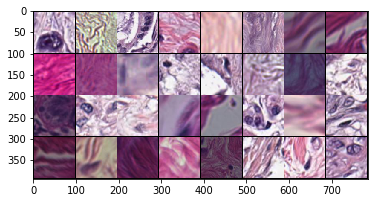

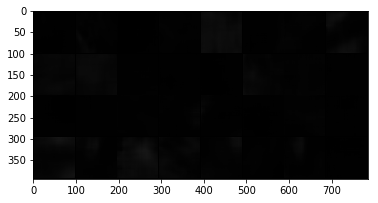

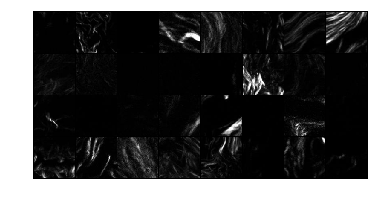

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


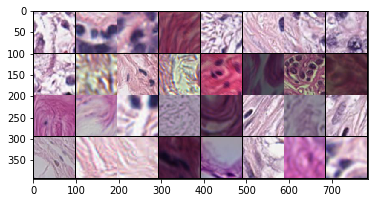

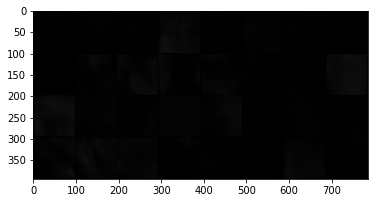

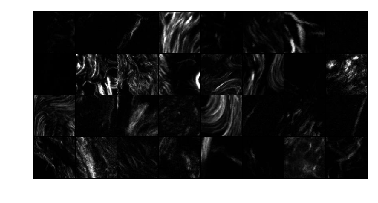

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


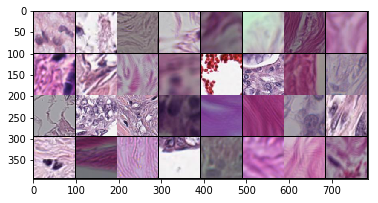

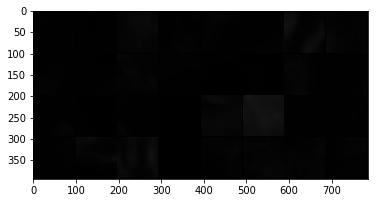

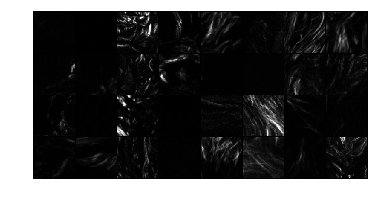

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


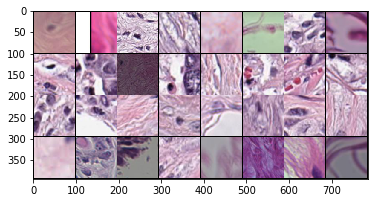

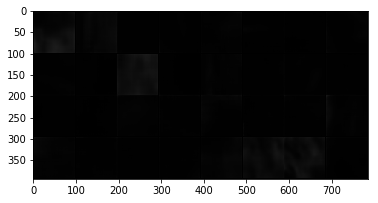

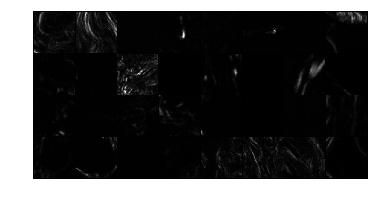

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


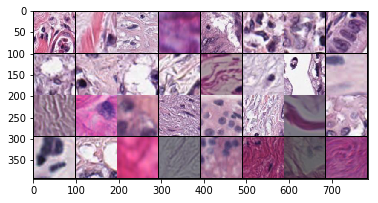

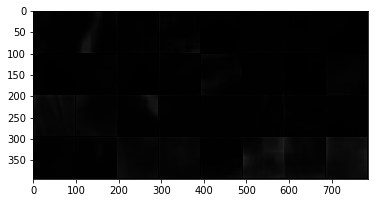

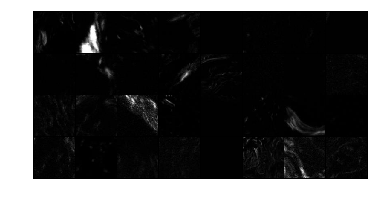

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


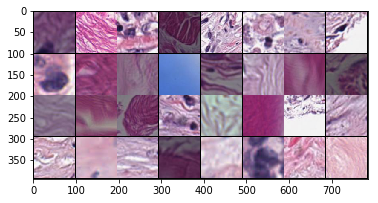

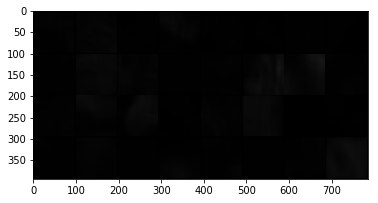

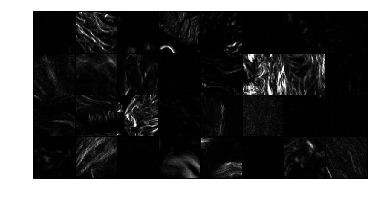

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


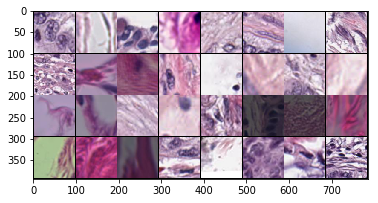

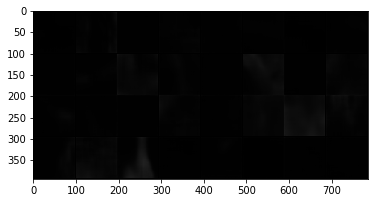

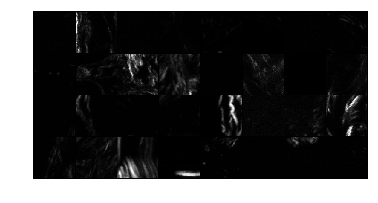

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


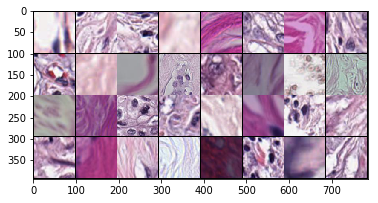

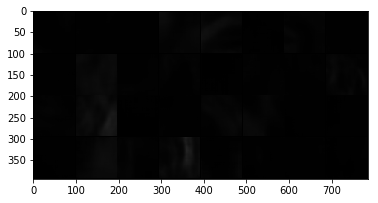

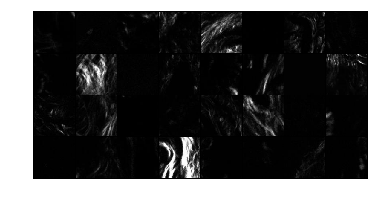

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


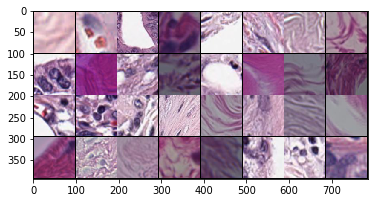

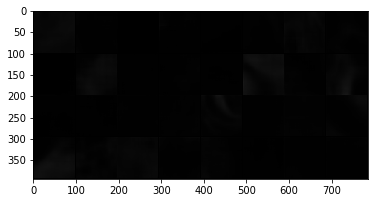

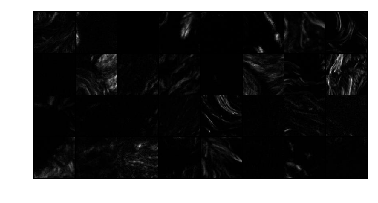

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


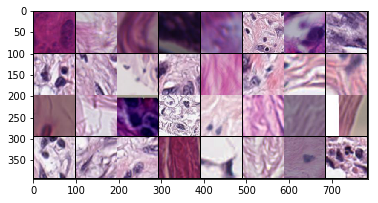

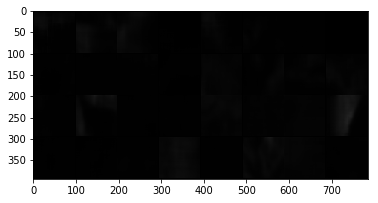

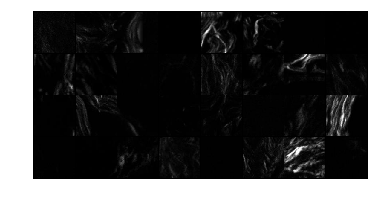

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


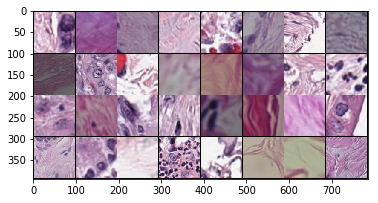

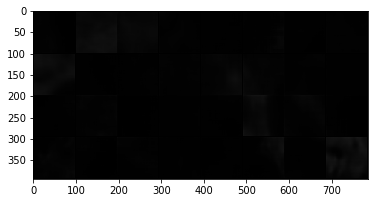

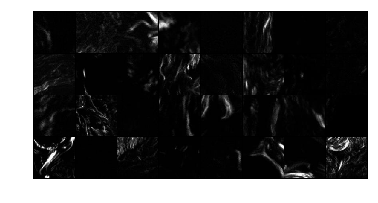

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


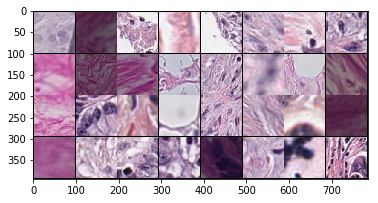

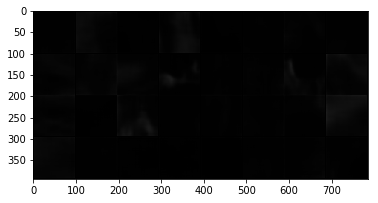

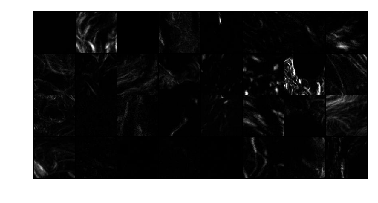

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


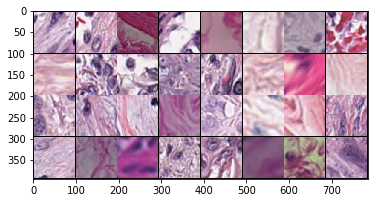

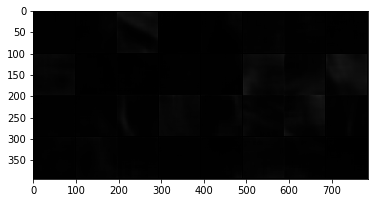

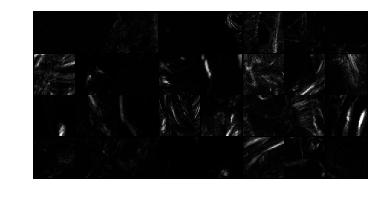

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


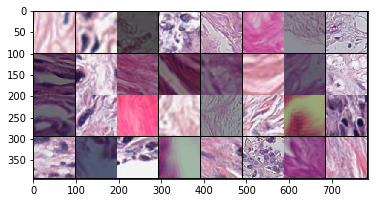

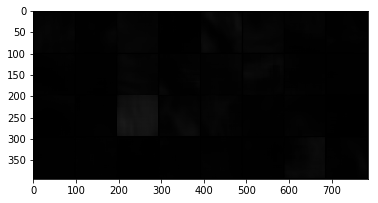

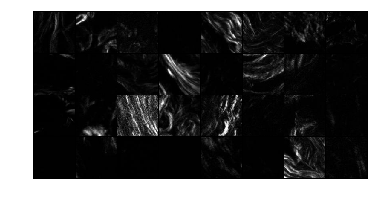

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


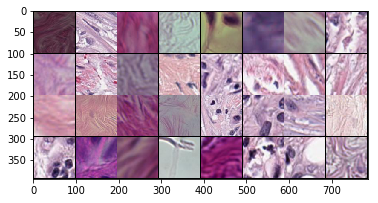

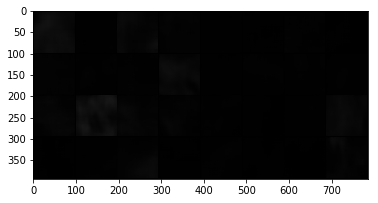

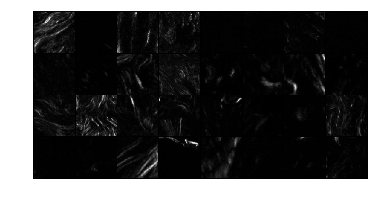

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


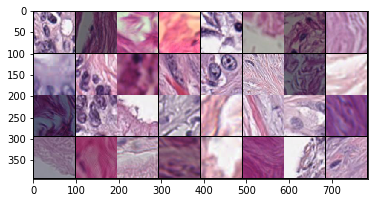

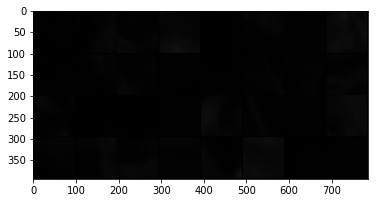

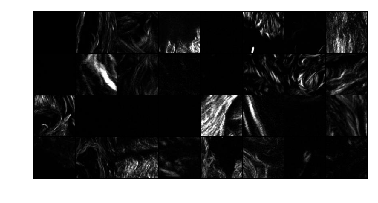

===> Avg. PSNR: nan dB


In [45]:
test()

In [49]:
l = 0.001
p = 0.5
windowsize = 4
for epoch in range(1, 18 + 1):
    if epoch%2 == 0:
        windowsize = windowsize+1
        p = p*0.8
        l = l*0.2
        if windowsize == 0:
            windowsze = 1
    optimizer = optim.Adam(model.parameters(), lr=l)
        
    train(epoch, p, windowsize)

lossMSE: 0.003864143043756485 lossSSIM: 0.22081106901168823
===> Epoch[1](0/25343): Loss: 0.1123
lossMSE: 0.009324544109404087 lossSSIM: 0.25245726108551025
===> Epoch[1](50/25343): Loss: 0.1309
lossMSE: 0.0017637461423873901 lossSSIM: 0.22006702423095703
===> Epoch[1](100/25343): Loss: 0.1109
lossMSE: 0.007370453793555498 lossSSIM: 0.25450003147125244
===> Epoch[1](150/25343): Loss: 0.1309
lossMSE: 0.00791291892528534 lossSSIM: 0.2180262804031372
===> Epoch[1](200/25343): Loss: 0.1130
lossMSE: 0.008001468144357204 lossSSIM: 0.24663305282592773
===> Epoch[1](250/25343): Loss: 0.1273
lossMSE: 0.005837003234773874 lossSSIM: 0.2741621732711792
===> Epoch[1](300/25343): Loss: 0.1400
lossMSE: 0.00781435426324606 lossSSIM: 0.24249249696731567
===> Epoch[1](350/25343): Loss: 0.1252
lossMSE: 0.005495252553373575 lossSSIM: 0.27066922187805176
===> Epoch[1](400/25343): Loss: 0.1381
lossMSE: 0.004389241803437471 lossSSIM: 0.242567777633667
===> Epoch[1](450/25343): Loss: 0.1235
lossMSE: 0.0061593

lossMSE: 0.007680365815758705 lossSSIM: 0.2793436646461487
===> Epoch[1](4150/25343): Loss: 0.1435
lossMSE: 0.0036677089519798756 lossSSIM: 0.21983754634857178
===> Epoch[1](4200/25343): Loss: 0.1118
lossMSE: 0.0061903586611151695 lossSSIM: 0.2821013927459717
===> Epoch[1](4250/25343): Loss: 0.1441
lossMSE: 0.00745006836950779 lossSSIM: 0.2737974524497986
===> Epoch[1](4300/25343): Loss: 0.1406
lossMSE: 0.005272026639431715 lossSSIM: 0.24298405647277832
===> Epoch[1](4350/25343): Loss: 0.1241
lossMSE: 0.0021259584464132786 lossSSIM: 0.18567538261413574
===> Epoch[1](4400/25343): Loss: 0.0939
lossMSE: 0.005051068030297756 lossSSIM: 0.1973699927330017
===> Epoch[1](4450/25343): Loss: 0.1012
lossMSE: 0.003710601944476366 lossSSIM: 0.2289520502090454
===> Epoch[1](4500/25343): Loss: 0.1163
lossMSE: 0.00519863935187459 lossSSIM: 0.27675431966781616
===> Epoch[1](4550/25343): Loss: 0.1410
lossMSE: 0.012836804613471031 lossSSIM: 0.2311544418334961
===> Epoch[1](4600/25343): Loss: 0.1220
lossM

lossMSE: 0.0018105001654475927 lossSSIM: 0.20447319746017456
===> Epoch[1](8300/25343): Loss: 0.1031
lossMSE: 0.0073335543274879456 lossSSIM: 0.2628737688064575
===> Epoch[1](8350/25343): Loss: 0.1351
lossMSE: 0.0038951693568378687 lossSSIM: 0.24088197946548462
===> Epoch[1](8400/25343): Loss: 0.1224
lossMSE: 0.00487572280690074 lossSSIM: 0.18781054019927979
===> Epoch[1](8450/25343): Loss: 0.0963
lossMSE: 0.0052693733014166355 lossSSIM: 0.23269355297088623
===> Epoch[1](8500/25343): Loss: 0.1190
lossMSE: 0.004094815347343683 lossSSIM: 0.2132301926612854
===> Epoch[1](8550/25343): Loss: 0.1087
lossMSE: 0.009060677140951157 lossSSIM: 0.24839073419570923
===> Epoch[1](8600/25343): Loss: 0.1287
lossMSE: 0.003990977071225643 lossSSIM: 0.23068535327911377
===> Epoch[1](8650/25343): Loss: 0.1173
lossMSE: 0.0034247685689479113 lossSSIM: 0.23694384098052979
===> Epoch[1](8700/25343): Loss: 0.1202
lossMSE: 0.0069570294581353664 lossSSIM: 0.2916356921195984
===> Epoch[1](8750/25343): Loss: 0.149

lossMSE: 0.0054781255312263966 lossSSIM: 0.2619117498397827
===> Epoch[1](12400/25343): Loss: 0.1337
lossMSE: 0.005531415343284607 lossSSIM: 0.22054153680801392
===> Epoch[1](12450/25343): Loss: 0.1130
lossMSE: 0.005523571744561195 lossSSIM: 0.23848676681518555
===> Epoch[1](12500/25343): Loss: 0.1220
lossMSE: 0.008955308236181736 lossSSIM: 0.23621559143066406
===> Epoch[1](12550/25343): Loss: 0.1226
lossMSE: 0.007484303787350655 lossSSIM: 0.23286515474319458
===> Epoch[1](12600/25343): Loss: 0.1202
lossMSE: 0.004774780478328466 lossSSIM: 0.19989913702011108
===> Epoch[1](12650/25343): Loss: 0.1023
lossMSE: 0.01009539794176817 lossSSIM: 0.28771865367889404
===> Epoch[1](12700/25343): Loss: 0.1489
lossMSE: 0.006410301197320223 lossSSIM: 0.24081045389175415
===> Epoch[1](12750/25343): Loss: 0.1236
lossMSE: 0.010970916599035263 lossSSIM: 0.2716206908226013
===> Epoch[1](12800/25343): Loss: 0.1413
lossMSE: 0.010329733602702618 lossSSIM: 0.2542514204978943
===> Epoch[1](12850/25343): Loss: 

lossMSE: 0.004249542485922575 lossSSIM: 0.25031232833862305
===> Epoch[1](16500/25343): Loss: 0.1273
lossMSE: 0.005402297712862492 lossSSIM: 0.22957229614257812
===> Epoch[1](16550/25343): Loss: 0.1175
lossMSE: 0.008181232959032059 lossSSIM: 0.23669564723968506
===> Epoch[1](16600/25343): Loss: 0.1224
lossMSE: 0.002721088007092476 lossSSIM: 0.1901611089706421
===> Epoch[1](16650/25343): Loss: 0.0964
lossMSE: 0.006487350445240736 lossSSIM: 0.25160717964172363
===> Epoch[1](16700/25343): Loss: 0.1290
lossMSE: 0.011244469322264194 lossSSIM: 0.2850103974342346
===> Epoch[1](16750/25343): Loss: 0.1481
lossMSE: 0.006457647308707237 lossSSIM: 0.2705584168434143
===> Epoch[1](16800/25343): Loss: 0.1385
lossMSE: 0.0038027067203074694 lossSSIM: 0.19992130994796753
===> Epoch[1](16850/25343): Loss: 0.1019
lossMSE: 0.007501370273530483 lossSSIM: 0.2668837308883667
===> Epoch[1](16900/25343): Loss: 0.1372
lossMSE: 0.004989546723663807 lossSSIM: 0.2467380166053772
===> Epoch[1](16950/25343): Loss: 0

lossMSE: 0.00939240027219057 lossSSIM: 0.26138871908187866
===> Epoch[1](20600/25343): Loss: 0.1354
lossMSE: 0.008895806036889553 lossSSIM: 0.2984102964401245
===> Epoch[1](20650/25343): Loss: 0.1537
lossMSE: 0.006796237546950579 lossSSIM: 0.27272695302963257
===> Epoch[1](20700/25343): Loss: 0.1398
lossMSE: 0.002451061038300395 lossSSIM: 0.22128349542617798
===> Epoch[1](20750/25343): Loss: 0.1119
lossMSE: 0.006195714697241783 lossSSIM: 0.20810776948928833
===> Epoch[1](20800/25343): Loss: 0.1072
lossMSE: 0.007922296412289143 lossSSIM: 0.2692720293998718
===> Epoch[1](20850/25343): Loss: 0.1386
lossMSE: 0.005063893273472786 lossSSIM: 0.24041622877120972
===> Epoch[1](20900/25343): Loss: 0.1227
lossMSE: 0.008457300253212452 lossSSIM: 0.26454877853393555
===> Epoch[1](20950/25343): Loss: 0.1365
lossMSE: 0.006591509561985731 lossSSIM: 0.23031657934188843
===> Epoch[1](21000/25343): Loss: 0.1185
lossMSE: 0.0031932645943015814 lossSSIM: 0.22985941171646118
===> Epoch[1](21050/25343): Loss:

lossMSE: 0.008325300179421902 lossSSIM: 0.25536972284317017
===> Epoch[1](24700/25343): Loss: 0.1318
lossMSE: 0.005869677755981684 lossSSIM: 0.2545582056045532
===> Epoch[1](24750/25343): Loss: 0.1302
lossMSE: 0.005670159589499235 lossSSIM: 0.24370157718658447
===> Epoch[1](24800/25343): Loss: 0.1247
lossMSE: 0.006418243981897831 lossSSIM: 0.266910195350647
===> Epoch[1](24850/25343): Loss: 0.1367
lossMSE: 0.00504756486043334 lossSSIM: 0.2562491297721863
===> Epoch[1](24900/25343): Loss: 0.1306
lossMSE: 0.0028827690985053778 lossSSIM: 0.1833338737487793
===> Epoch[1](24950/25343): Loss: 0.0931
lossMSE: 0.004846334457397461 lossSSIM: 0.23461222648620605
===> Epoch[1](25000/25343): Loss: 0.1197
lossMSE: 0.008667413145303726 lossSSIM: 0.2817125916481018
===> Epoch[1](25050/25343): Loss: 0.1452
lossMSE: 0.0036663785576820374 lossSSIM: 0.22379618883132935
===> Epoch[1](25100/25343): Loss: 0.1137
lossMSE: 0.006794178858399391 lossSSIM: 0.28517991304397583
===> Epoch[1](25150/25343): Loss: 0.

lossMSE: 0.0043914723210036755 lossSSIM: 0.21108287572860718
===> Epoch[2](3450/25343): Loss: 0.1284
lossMSE: 0.0076470873318612576 lossSSIM: 0.25000476837158203
===> Epoch[2](3500/25343): Loss: 0.1531
lossMSE: 0.004761362913995981 lossSSIM: 0.2524319291114807
===> Epoch[2](3550/25343): Loss: 0.1534
lossMSE: 0.001943579176440835 lossSSIM: 0.17981529235839844
===> Epoch[2](3600/25343): Loss: 0.1087
lossMSE: 0.011569923721253872 lossSSIM: 0.27499914169311523
===> Epoch[2](3650/25343): Loss: 0.1696
lossMSE: 0.009995424188673496 lossSSIM: 0.2508118748664856
===> Epoch[2](3700/25343): Loss: 0.1545
lossMSE: 0.011044942773878574 lossSSIM: 0.3392777442932129
===> Epoch[2](3750/25343): Loss: 0.2080
lossMSE: 0.0023010040167719126 lossSSIM: 0.21014612913131714
===> Epoch[2](3800/25343): Loss: 0.1270
lossMSE: 0.00288914842531085 lossSSIM: 0.20543575286865234
===> Epoch[2](3850/25343): Loss: 0.1244
lossMSE: 0.0035426882095634937 lossSSIM: 0.2398676872253418
===> Epoch[2](3900/25343): Loss: 0.1453
l

lossMSE: 0.0069310227409005165 lossSSIM: 0.27012091875076294
===> Epoch[2](7600/25343): Loss: 0.1648
lossMSE: 0.0032865533139556646 lossSSIM: 0.22038674354553223
===> Epoch[2](7650/25343): Loss: 0.1335
lossMSE: 0.005476426798850298 lossSSIM: 0.25115638971328735
===> Epoch[2](7700/25343): Loss: 0.1529
lossMSE: 0.004372652154415846 lossSSIM: 0.25501227378845215
===> Epoch[2](7750/25343): Loss: 0.1548
lossMSE: 0.004715798422694206 lossSSIM: 0.22372221946716309
===> Epoch[2](7800/25343): Loss: 0.1361
lossMSE: 0.004110939800739288 lossSSIM: 0.2758646011352539
===> Epoch[2](7850/25343): Loss: 0.1672
lossMSE: 0.005622616969048977 lossSSIM: 0.25930237770080566
===> Epoch[2](7900/25343): Loss: 0.1578
lossMSE: 0.003965540789067745 lossSSIM: 0.25130218267440796
===> Epoch[2](7950/25343): Loss: 0.1524
lossMSE: 0.0027917271945625544 lossSSIM: 0.23335766792297363
===> Epoch[2](8000/25343): Loss: 0.1411
lossMSE: 0.006295390427112579 lossSSIM: 0.3009624481201172
===> Epoch[2](8050/25343): Loss: 0.1831

lossMSE: 0.00281409895978868 lossSSIM: 0.21212983131408691
===> Epoch[2](11700/25343): Loss: 0.1284
lossMSE: 0.006365228909999132 lossSSIM: 0.2731192111968994
===> Epoch[2](11750/25343): Loss: 0.1664
lossMSE: 0.007126468699425459 lossSSIM: 0.2600657343864441
===> Epoch[2](11800/25343): Loss: 0.1589
lossMSE: 0.004617149010300636 lossSSIM: 0.23447227478027344
===> Epoch[2](11850/25343): Loss: 0.1425
lossMSE: 0.0047265756875276566 lossSSIM: 0.2194594144821167
===> Epoch[2](11900/25343): Loss: 0.1336
lossMSE: 0.005646275356411934 lossSSIM: 0.28361254930496216
===> Epoch[2](11950/25343): Loss: 0.1724
lossMSE: 0.0041588046588003635 lossSSIM: 0.21986234188079834
===> Epoch[2](12000/25343): Loss: 0.1336
lossMSE: 0.005970656871795654 lossSSIM: 0.22779470682144165
===> Epoch[2](12050/25343): Loss: 0.1391
lossMSE: 0.005652505438774824 lossSSIM: 0.2476024031639099
===> Epoch[2](12100/25343): Loss: 0.1508
lossMSE: 0.005857950542122126 lossSSIM: 0.31015563011169434
===> Epoch[2](12150/25343): Loss: 

lossMSE: 0.009789680130779743 lossSSIM: 0.2574959397315979
===> Epoch[2](15800/25343): Loss: 0.1584
lossMSE: 0.01628890633583069 lossSSIM: 0.2693100571632385
===> Epoch[2](15850/25343): Loss: 0.1681
lossMSE: 0.004147363360971212 lossSSIM: 0.2506539821624756
===> Epoch[2](15900/25343): Loss: 0.1521
lossMSE: 0.006813587620854378 lossSSIM: 0.2694981098175049
===> Epoch[2](15950/25343): Loss: 0.1644
lossMSE: 0.006254429463297129 lossSSIM: 0.26278620958328247
===> Epoch[2](16000/25343): Loss: 0.1602
lossMSE: 0.008652453310787678 lossSSIM: 0.21851307153701782
===> Epoch[2](16050/25343): Loss: 0.1346
lossMSE: 0.007368162274360657 lossSSIM: 0.31380248069763184
===> Epoch[2](16100/25343): Loss: 0.1912
lossMSE: 0.003337516915053129 lossSSIM: 0.23459148406982422
===> Epoch[2](16150/25343): Loss: 0.1421
lossMSE: 0.002619753824546933 lossSSIM: 0.2273579239845276
===> Epoch[2](16200/25343): Loss: 0.1375
lossMSE: 0.006238841917365789 lossSSIM: 0.25583136081695557
===> Epoch[2](16250/25343): Loss: 0.1

lossMSE: 0.00858423113822937 lossSSIM: 0.3094223737716675
===> Epoch[2](19900/25343): Loss: 0.1891
lossMSE: 0.007900170050561428 lossSSIM: 0.2631016969680786
===> Epoch[2](19950/25343): Loss: 0.1610
lossMSE: 0.00804481003433466 lossSSIM: 0.24326962232589722
===> Epoch[2](20000/25343): Loss: 0.1492
lossMSE: 0.008700002916157246 lossSSIM: 0.2848661541938782
===> Epoch[2](20050/25343): Loss: 0.1744
lossMSE: 0.0036788578145205975 lossSSIM: 0.24063807725906372
===> Epoch[2](20100/25343): Loss: 0.1459
lossMSE: 0.007387802004814148 lossSSIM: 0.26487672328948975
===> Epoch[2](20150/25343): Loss: 0.1619
lossMSE: 0.002923710737377405 lossSSIM: 0.1953309178352356
===> Epoch[2](20200/25343): Loss: 0.1184
lossMSE: 0.005693070590496063 lossSSIM: 0.2505931854248047
===> Epoch[2](20250/25343): Loss: 0.1526
lossMSE: 0.0031635910272598267 lossSSIM: 0.21250468492507935
===> Epoch[2](20300/25343): Loss: 0.1288
lossMSE: 0.0042406897991895676 lossSSIM: 0.22626054286956787
===> Epoch[2](20350/25343): Loss: 0

lossMSE: 0.005198145285248756 lossSSIM: 0.270469605922699
===> Epoch[2](24000/25343): Loss: 0.1644
lossMSE: 0.010435326024889946 lossSSIM: 0.26428496837615967
===> Epoch[2](24050/25343): Loss: 0.1627
lossMSE: 0.007463352754712105 lossSSIM: 0.2293764352798462
===> Epoch[2](24100/25343): Loss: 0.1406
lossMSE: 0.0070680659264326096 lossSSIM: 0.23461651802062988
===> Epoch[2](24150/25343): Loss: 0.1436
lossMSE: 0.00847606547176838 lossSSIM: 0.30072563886642456
===> Epoch[2](24200/25343): Loss: 0.1838
lossMSE: 0.004906169604510069 lossSSIM: 0.27518028020858765
===> Epoch[2](24250/25343): Loss: 0.1671
lossMSE: 0.00818901788443327 lossSSIM: 0.2549872398376465
===> Epoch[2](24300/25343): Loss: 0.1563
lossMSE: 0.003574034431949258 lossSSIM: 0.24967485666275024
===> Epoch[2](24350/25343): Loss: 0.1512
lossMSE: 0.011842887848615646 lossSSIM: 0.3097591996192932
===> Epoch[2](24400/25343): Loss: 0.1906
lossMSE: 0.005640164017677307 lossSSIM: 0.2906032204627991
===> Epoch[2](24450/25343): Loss: 0.17

lossMSE: 0.0038017937913537025 lossSSIM: 0.26810985803604126
===> Epoch[3](2750/25343): Loss: 0.1624
lossMSE: 0.009627746418118477 lossSSIM: 0.2651975154876709
===> Epoch[3](2800/25343): Loss: 0.1630
lossMSE: 0.009875627234578133 lossSSIM: 0.2744588255882263
===> Epoch[3](2850/25343): Loss: 0.1686
lossMSE: 0.0033655851148068905 lossSSIM: 0.22299915552139282
===> Epoch[3](2900/25343): Loss: 0.1351
lossMSE: 0.0056142620742321014 lossSSIM: 0.21714448928833008
===> Epoch[3](2950/25343): Loss: 0.1325
lossMSE: 0.005285437684506178 lossSSIM: 0.2299044132232666
===> Epoch[3](3000/25343): Loss: 0.1401
lossMSE: 0.005045734345912933 lossSSIM: 0.2203349471092224
===> Epoch[3](3050/25343): Loss: 0.1342
lossMSE: 0.011316942982375622 lossSSIM: 0.2911913990974426
===> Epoch[3](3100/25343): Loss: 0.1792
lossMSE: 0.0052150581032037735 lossSSIM: 0.2663450837135315
===> Epoch[3](3150/25343): Loss: 0.1619
lossMSE: 0.004082200583070517 lossSSIM: 0.242972731590271
===> Epoch[3](3200/25343): Loss: 0.1474
loss

lossMSE: 0.006909763440489769 lossSSIM: 0.28561151027679443
===> Epoch[3](6900/25343): Loss: 0.1741
lossMSE: 0.006752975285053253 lossSSIM: 0.2677687406539917
===> Epoch[3](6950/25343): Loss: 0.1634
lossMSE: 0.00624387152493 lossSSIM: 0.26982277631759644
===> Epoch[3](7000/25343): Loss: 0.1644
lossMSE: 0.004993992391973734 lossSSIM: 0.24037158489227295
===> Epoch[3](7050/25343): Loss: 0.1462
lossMSE: 0.010843907482922077 lossSSIM: 0.25957316160202026
===> Epoch[3](7100/25343): Loss: 0.1601
lossMSE: 0.01071355864405632 lossSSIM: 0.22985517978668213
===> Epoch[3](7150/25343): Loss: 0.1422
lossMSE: 0.005300197750329971 lossSSIM: 0.2916887402534485
===> Epoch[3](7200/25343): Loss: 0.1771
lossMSE: 0.009014020673930645 lossSSIM: 0.2418825626373291
===> Epoch[3](7250/25343): Loss: 0.1487
lossMSE: 0.011399637907743454 lossSSIM: 0.2689095735549927
===> Epoch[3](7300/25343): Loss: 0.1659
lossMSE: 0.0026852514129132032 lossSSIM: 0.20598763227462769
===> Epoch[3](7350/25343): Loss: 0.1247
lossMSE:

lossMSE: 0.0059389397501945496 lossSSIM: 0.26840853691101074
===> Epoch[3](11050/25343): Loss: 0.1634
lossMSE: 0.0061076791025698185 lossSSIM: 0.2515518069267273
===> Epoch[3](11100/25343): Loss: 0.1534
lossMSE: 0.007782196160405874 lossSSIM: 0.26738715171813965
===> Epoch[3](11150/25343): Loss: 0.1635
lossMSE: 0.007146946154534817 lossSSIM: 0.21337974071502686
===> Epoch[3](11200/25343): Loss: 0.1309
lossMSE: 0.004002819303423166 lossSSIM: 0.21409422159194946
===> Epoch[3](11250/25343): Loss: 0.1301
lossMSE: 0.010903739370405674 lossSSIM: 0.2433876395225525
===> Epoch[3](11300/25343): Loss: 0.1504
lossMSE: 0.00603015162050724 lossSSIM: 0.2378215789794922
===> Epoch[3](11350/25343): Loss: 0.1451
lossMSE: 0.0045078108087182045 lossSSIM: 0.25197523832321167
===> Epoch[3](11400/25343): Loss: 0.1530
lossMSE: 0.005145873408764601 lossSSIM: 0.28229743242263794
===> Epoch[3](11450/25343): Loss: 0.1714
lossMSE: 0.006098669953644276 lossSSIM: 0.22016984224319458
===> Epoch[3](11500/25343): Loss

lossMSE: 0.003919621929526329 lossSSIM: 0.23866164684295654
===> Epoch[3](15150/25343): Loss: 0.1448
lossMSE: 0.004817529581487179 lossSSIM: 0.21883785724639893
===> Epoch[3](15200/25343): Loss: 0.1332
lossMSE: 0.0031712516210973263 lossSSIM: 0.23197782039642334
===> Epoch[3](15250/25343): Loss: 0.1405
lossMSE: 0.01153864711523056 lossSSIM: 0.32979637384414673
===> Epoch[3](15300/25343): Loss: 0.2025
lossMSE: 0.007945973426103592 lossSSIM: 0.23959112167358398
===> Epoch[3](15350/25343): Loss: 0.1469
lossMSE: 0.0056762974709272385 lossSSIM: 0.2707369327545166
===> Epoch[3](15400/25343): Loss: 0.1647
lossMSE: 0.004239130299538374 lossSSIM: 0.23416417837142944
===> Epoch[3](15450/25343): Loss: 0.1422
lossMSE: 0.007496161386370659 lossSSIM: 0.27352404594421387
===> Epoch[3](15500/25343): Loss: 0.1671
lossMSE: 0.004517631605267525 lossSSIM: 0.258140504360199
===> Epoch[3](15550/25343): Loss: 0.1567
lossMSE: 0.006017459090799093 lossSSIM: 0.2578911781311035
===> Epoch[3](15600/25343): Loss: 

lossMSE: 0.010595436207950115 lossSSIM: 0.20291566848754883
===> Epoch[3](19250/25343): Loss: 0.1260
lossMSE: 0.005293572321534157 lossSSIM: 0.2537873387336731
===> Epoch[3](19300/25343): Loss: 0.1544
lossMSE: 0.002135208109393716 lossSSIM: 0.22924816608428955
===> Epoch[3](19350/25343): Loss: 0.1384
lossMSE: 0.004773755092173815 lossSSIM: 0.23248010873794556
===> Epoch[3](19400/25343): Loss: 0.1414
lossMSE: 0.0027969726361334324 lossSSIM: 0.20627206563949585
===> Epoch[3](19450/25343): Loss: 0.1249
lossMSE: 0.006064323708415031 lossSSIM: 0.2694582939147949
===> Epoch[3](19500/25343): Loss: 0.1641
lossMSE: 0.0047954474575817585 lossSSIM: 0.24834084510803223
===> Epoch[3](19550/25343): Loss: 0.1509
lossMSE: 0.008739362470805645 lossSSIM: 0.2571052312850952
===> Epoch[3](19600/25343): Loss: 0.1578
lossMSE: 0.0040307859890162945 lossSSIM: 0.23220103979110718
===> Epoch[3](19650/25343): Loss: 0.1409
lossMSE: 0.0031830263324081898 lossSSIM: 0.2192043662071228
===> Epoch[3](19700/25343): Los

lossMSE: 0.009360053576529026 lossSSIM: 0.30760663747787476
===> Epoch[3](23350/25343): Loss: 0.1883
lossMSE: 0.010652903467416763 lossSSIM: 0.2741609215736389
===> Epoch[3](23400/25343): Loss: 0.1688
lossMSE: 0.0046232230961322784 lossSSIM: 0.22899556159973145
===> Epoch[3](23450/25343): Loss: 0.1392
lossMSE: 0.0032863186206668615 lossSSIM: 0.2546617388725281
===> Epoch[3](23500/25343): Loss: 0.1541
lossMSE: 0.003709046868607402 lossSSIM: 0.22520506381988525
===> Epoch[3](23550/25343): Loss: 0.1366
lossMSE: 0.002979774959385395 lossSSIM: 0.20061320066452026
===> Epoch[3](23600/25343): Loss: 0.1216
lossMSE: 0.003154830075800419 lossSSIM: 0.2267095446586609
===> Epoch[3](23650/25343): Loss: 0.1373
lossMSE: 0.00996498391032219 lossSSIM: 0.271354079246521
===> Epoch[3](23700/25343): Loss: 0.1668
lossMSE: 0.005504499655216932 lossSSIM: 0.2598229646682739
===> Epoch[3](23750/25343): Loss: 0.1581
lossMSE: 0.002261699875816703 lossSSIM: 0.24211758375167847
===> Epoch[3](23800/25343): Loss: 0.

lossMSE: 0.0069835493341088295 lossSSIM: 0.21457171440124512
===> Epoch[4](2100/25343): Loss: 0.1481
lossMSE: 0.010230515152215958 lossSSIM: 0.33095884323120117
===> Epoch[4](2150/25343): Loss: 0.2283
lossMSE: 0.0047118752263486385 lossSSIM: 0.24978065490722656
===> Epoch[4](2200/25343): Loss: 0.1714
lossMSE: 0.004951408598572016 lossSSIM: 0.2717079520225525
===> Epoch[4](2250/25343): Loss: 0.1863
lossMSE: 0.005795738194137812 lossSSIM: 0.28273212909698486
===> Epoch[4](2300/25343): Loss: 0.1941
lossMSE: 0.0038616773672401905 lossSSIM: 0.2533096671104431
===> Epoch[4](2350/25343): Loss: 0.1735
lossMSE: 0.005747201386839151 lossSSIM: 0.2747384309768677
===> Epoch[4](2400/25343): Loss: 0.1887
lossMSE: 0.004273666068911552 lossSSIM: 0.25171488523483276
===> Epoch[4](2450/25343): Loss: 0.1725
lossMSE: 0.009431562386453152 lossSSIM: 0.255371630191803
===> Epoch[4](2500/25343): Loss: 0.1767
lossMSE: 0.0030989244114607573 lossSSIM: 0.22069239616394043
===> Epoch[4](2550/25343): Loss: 0.1511
l

lossMSE: 0.005785567685961723 lossSSIM: 0.23428255319595337
===> Epoch[4](6250/25343): Loss: 0.1612
lossMSE: 0.006086272187530994 lossSSIM: 0.2714207172393799
===> Epoch[4](6300/25343): Loss: 0.1865
lossMSE: 0.0034815031103789806 lossSSIM: 0.21672803163528442
===> Epoch[4](6350/25343): Loss: 0.1485
lossMSE: 0.005559081677347422 lossSSIM: 0.24504679441452026
===> Epoch[4](6400/25343): Loss: 0.1684
lossMSE: 0.008067437447607517 lossSSIM: 0.2948501706123352
===> Epoch[4](6450/25343): Loss: 0.2031
lossMSE: 0.007024706341326237 lossSSIM: 0.2562282085418701
===> Epoch[4](6500/25343): Loss: 0.1765
lossMSE: 0.008112410083413124 lossSSIM: 0.2690196633338928
===> Epoch[4](6550/25343): Loss: 0.1855
lossMSE: 0.0071647134609520435 lossSSIM: 0.25897276401519775
===> Epoch[4](6600/25343): Loss: 0.1784
lossMSE: 0.008421757258474827 lossSSIM: 0.29818761348724365
===> Epoch[4](6650/25343): Loss: 0.2055
lossMSE: 0.00608869967982173 lossSSIM: 0.23790401220321655
===> Epoch[4](6700/25343): Loss: 0.1637
los

lossMSE: 0.007607231382280588 lossSSIM: 0.27005404233932495
===> Epoch[4](10400/25343): Loss: 0.1861
lossMSE: 0.010530222207307816 lossSSIM: 0.3598676919937134
===> Epoch[4](10450/25343): Loss: 0.2481
lossMSE: 0.007275907322764397 lossSSIM: 0.27591896057128906
===> Epoch[4](10500/25343): Loss: 0.1900
lossMSE: 0.0048198155127465725 lossSSIM: 0.2241995930671692
===> Epoch[4](10550/25343): Loss: 0.1540
lossMSE: 0.003708025673404336 lossSSIM: 0.24713248014450073
===> Epoch[4](10600/25343): Loss: 0.1692
lossMSE: 0.006434653420001268 lossSSIM: 0.26427823305130005
===> Epoch[4](10650/25343): Loss: 0.1818
lossMSE: 0.0066925957798957825 lossSSIM: 0.22734355926513672
===> Epoch[4](10700/25343): Loss: 0.1567
lossMSE: 0.007952258922159672 lossSSIM: 0.2659858465194702
===> Epoch[4](10750/25343): Loss: 0.1834
lossMSE: 0.0042098951525986195 lossSSIM: 0.23603981733322144
===> Epoch[4](10800/25343): Loss: 0.1619
lossMSE: 0.004240710753947496 lossSSIM: 0.20616209506988525
===> Epoch[4](10850/25343): Los

lossMSE: 0.0038832323625683784 lossSSIM: 0.23430657386779785
===> Epoch[4](14500/25343): Loss: 0.1606
lossMSE: 0.0026722638867795467 lossSSIM: 0.2087949514389038
===> Epoch[4](14550/25343): Loss: 0.1428
lossMSE: 0.008905087597668171 lossSSIM: 0.3022781014442444
===> Epoch[4](14600/25343): Loss: 0.2084
lossMSE: 0.025435246527194977 lossSSIM: 0.27665597200393677
===> Epoch[4](14650/25343): Loss: 0.1963
lossMSE: 0.003192642005160451 lossSSIM: 0.2169342041015625
===> Epoch[4](14700/25343): Loss: 0.1485
lossMSE: 0.005208743270486593 lossSSIM: 0.24019038677215576
===> Epoch[4](14750/25343): Loss: 0.1650
lossMSE: 0.006212638691067696 lossSSIM: 0.2863280773162842
===> Epoch[4](14800/25343): Loss: 0.1967
lossMSE: 0.004551561549305916 lossSSIM: 0.24820160865783691
===> Epoch[4](14850/25343): Loss: 0.1702
lossMSE: 0.0036811567842960358 lossSSIM: 0.24921852350234985
===> Epoch[4](14900/25343): Loss: 0.1706
lossMSE: 0.0034244295675307512 lossSSIM: 0.2333996295928955
===> Epoch[4](14950/25343): Loss

lossMSE: 0.009256475605070591 lossSSIM: 0.2557855248451233
===> Epoch[4](18600/25343): Loss: 0.1769
lossMSE: 0.011728606186807156 lossSSIM: 0.2897565960884094
===> Epoch[4](18650/25343): Loss: 0.2008
lossMSE: 0.0040712738409638405 lossSSIM: 0.2407536506652832
===> Epoch[4](18700/25343): Loss: 0.1650
lossMSE: 0.004552064463496208 lossSSIM: 0.29249107837677
===> Epoch[4](18750/25343): Loss: 0.2004
lossMSE: 0.00762997567653656 lossSSIM: 0.26241737604141235
===> Epoch[4](18800/25343): Loss: 0.1809
lossMSE: 0.010874518193304539 lossSSIM: 0.2789049744606018
===> Epoch[4](18850/25343): Loss: 0.1931
lossMSE: 0.01716381311416626 lossSSIM: 0.298362672328949
===> Epoch[4](18900/25343): Loss: 0.2084
lossMSE: 0.003493697615340352 lossSSIM: 0.2783302068710327
===> Epoch[4](18950/25343): Loss: 0.1904
lossMSE: 0.002913477597758174 lossSSIM: 0.20386040210723877
===> Epoch[4](19000/25343): Loss: 0.1396
lossMSE: 0.00988968089222908 lossSSIM: 0.34791064262390137
===> Epoch[4](19050/25343): Loss: 0.2397
lo

lossMSE: 0.0031581090297549963 lossSSIM: 0.2131028175354004
===> Epoch[4](22700/25343): Loss: 0.1459
lossMSE: 0.006586868781596422 lossSSIM: 0.262498676776886
===> Epoch[4](22750/25343): Loss: 0.1806
lossMSE: 0.009993994608521461 lossSSIM: 0.278564989566803
===> Epoch[4](22800/25343): Loss: 0.1926
lossMSE: 0.003268283326178789 lossSSIM: 0.2373577356338501
===> Epoch[4](22850/25343): Loss: 0.1624
lossMSE: 0.0057279570028185844 lossSSIM: 0.2607225179672241
===> Epoch[4](22900/25343): Loss: 0.1791
lossMSE: 0.008982458151876926 lossSSIM: 0.29221123456954956
===> Epoch[4](22950/25343): Loss: 0.2016
lossMSE: 0.0070747327990829945 lossSSIM: 0.25687241554260254
===> Epoch[4](23000/25343): Loss: 0.1769
lossMSE: 0.007953794673085213 lossSSIM: 0.3508334755897522
===> Epoch[4](23050/25343): Loss: 0.2411
lossMSE: 0.007969090715050697 lossSSIM: 0.2603331208229065
===> Epoch[4](23100/25343): Loss: 0.1796
lossMSE: 0.004893352743238211 lossSSIM: 0.20998108386993408
===> Epoch[4](23150/25343): Loss: 0.1

lossMSE: 0.0032865286339074373 lossSSIM: 0.20446807146072388
===> Epoch[5](1450/25343): Loss: 0.1401
lossMSE: 0.005217080935835838 lossSSIM: 0.26281434297561646
===> Epoch[5](1500/25343): Loss: 0.1804
lossMSE: 0.002482653595507145 lossSSIM: 0.24283164739608765
===> Epoch[5](1550/25343): Loss: 0.1659
lossMSE: 0.005652455613017082 lossSSIM: 0.27313774824142456
===> Epoch[5](1600/25343): Loss: 0.1875
lossMSE: 0.0127313993871212 lossSSIM: 0.32563459873199463
===> Epoch[5](1650/25343): Loss: 0.2255
lossMSE: 0.004958875477313995 lossSSIM: 0.29074639081954956
===> Epoch[5](1700/25343): Loss: 0.1993
lossMSE: 0.005796073470264673 lossSSIM: 0.2594468593597412
===> Epoch[5](1750/25343): Loss: 0.1783
lossMSE: 0.002244680654257536 lossSSIM: 0.19338804483413696
===> Epoch[5](1800/25343): Loss: 0.1322
lossMSE: 0.008215440437197685 lossSSIM: 0.3043828010559082
===> Epoch[5](1850/25343): Loss: 0.2096
lossMSE: 0.007855248637497425 lossSSIM: 0.24141597747802734
===> Epoch[5](1900/25343): Loss: 0.1667
los

lossMSE: 0.006629291456192732 lossSSIM: 0.2724072337150574
===> Epoch[5](5600/25343): Loss: 0.1874
lossMSE: 0.008529468439519405 lossSSIM: 0.2613752484321594
===> Epoch[5](5650/25343): Loss: 0.1805
lossMSE: 0.0021585794165730476 lossSSIM: 0.20363163948059082
===> Epoch[5](5700/25343): Loss: 0.1392
lossMSE: 0.011296280659735203 lossSSIM: 0.2761174440383911
===> Epoch[5](5750/25343): Loss: 0.1914
lossMSE: 0.012374382466077805 lossSSIM: 0.30071860551834106
===> Epoch[5](5800/25343): Loss: 0.2084
lossMSE: 0.007250281050801277 lossSSIM: 0.26044124364852905
===> Epoch[5](5850/25343): Loss: 0.1794
lossMSE: 0.010527542792260647 lossSSIM: 0.3055860996246338
===> Epoch[5](5900/25343): Loss: 0.2112
lossMSE: 0.008131995797157288 lossSSIM: 0.2680354714393616
===> Epoch[5](5950/25343): Loss: 0.1849
lossMSE: 0.01003857422620058 lossSSIM: 0.26331835985183716
===> Epoch[5](6000/25343): Loss: 0.1823
lossMSE: 0.0076734889298677444 lossSSIM: 0.2475297451019287
===> Epoch[5](6050/25343): Loss: 0.1708
lossM

lossMSE: 0.008871469646692276 lossSSIM: 0.28675323724746704
===> Epoch[5](9750/25343): Loss: 0.1978
lossMSE: 0.011193600483238697 lossSSIM: 0.30432772636413574
===> Epoch[5](9800/25343): Loss: 0.2105
lossMSE: 0.004835804924368858 lossSSIM: 0.23511749505996704
===> Epoch[5](9850/25343): Loss: 0.1614
lossMSE: 0.005427738651633263 lossSSIM: 0.25282835960388184
===> Epoch[5](9900/25343): Loss: 0.1737
lossMSE: 0.008452879264950752 lossSSIM: 0.3231031894683838
===> Epoch[5](9950/25343): Loss: 0.2224
lossMSE: 0.007271650712937117 lossSSIM: 0.27832287549972534
===> Epoch[5](10000/25343): Loss: 0.1916
lossMSE: 0.013808680698275566 lossSSIM: 0.38672345876693726
===> Epoch[5](10050/25343): Loss: 0.2674
lossMSE: 0.015407496131956577 lossSSIM: 0.2636483907699585
===> Epoch[5](10100/25343): Loss: 0.1842
lossMSE: 0.01896820217370987 lossSSIM: 0.36714619398117065
===> Epoch[5](10150/25343): Loss: 0.2557
lossMSE: 0.003198927966877818 lossSSIM: 0.22639918327331543
===> Epoch[5](10200/25343): Loss: 0.155

lossMSE: 0.007749876938760281 lossSSIM: 0.28136956691741943
===> Epoch[5](13850/25343): Loss: 0.1938
lossMSE: 0.01265660859644413 lossSSIM: 0.29596877098083496
===> Epoch[5](13900/25343): Loss: 0.2053
lossMSE: 0.0040734317153692245 lossSSIM: 0.2234620451927185
===> Epoch[5](13950/25343): Loss: 0.1533
lossMSE: 0.005457807797938585 lossSSIM: 0.22764873504638672
===> Epoch[5](14000/25343): Loss: 0.1565
lossMSE: 0.006687063258141279 lossSSIM: 0.2034989595413208
===> Epoch[5](14050/25343): Loss: 0.1405
lossMSE: 0.003862823825329542 lossSSIM: 0.25310587882995605
===> Epoch[5](14100/25343): Loss: 0.1733
lossMSE: 0.005371210630983114 lossSSIM: 0.28146183490753174
===> Epoch[5](14150/25343): Loss: 0.1931
lossMSE: 0.006575597450137138 lossSSIM: 0.30040252208709717
===> Epoch[5](14200/25343): Loss: 0.2064
lossMSE: 0.007619368378072977 lossSSIM: 0.23503774404525757
===> Epoch[5](14250/25343): Loss: 0.1623
lossMSE: 0.004219853784888983 lossSSIM: 0.22775572538375854
===> Epoch[5](14300/25343): Loss:

lossMSE: 0.010802190750837326 lossSSIM: 0.3189411759376526
===> Epoch[5](17950/25343): Loss: 0.2203
lossMSE: 0.010599004104733467 lossSSIM: 0.2919881343841553
===> Epoch[5](18000/25343): Loss: 0.2019
lossMSE: 0.004115631338208914 lossSSIM: 0.21850979328155518
===> Epoch[5](18050/25343): Loss: 0.1499
lossMSE: 0.0073806773871183395 lossSSIM: 0.26539337635040283
===> Epoch[5](18100/25343): Loss: 0.1828
lossMSE: 0.004845229908823967 lossSSIM: 0.26933932304382324
===> Epoch[5](18150/25343): Loss: 0.1847
lossMSE: 0.0057736169546842575 lossSSIM: 0.24655312299728394
===> Epoch[5](18200/25343): Loss: 0.1695
lossMSE: 0.005545238498598337 lossSSIM: 0.1897105574607849
===> Epoch[5](18250/25343): Loss: 0.1308
lossMSE: 0.004296063911169767 lossSSIM: 0.22702282667160034
===> Epoch[5](18300/25343): Loss: 0.1558
lossMSE: 0.008735772222280502 lossSSIM: 0.23352086544036865
===> Epoch[5](18350/25343): Loss: 0.1616
lossMSE: 0.0044514150358736515 lossSSIM: 0.26663434505462646
===> Epoch[5](18400/25343): Los

lossMSE: 0.011901537887752056 lossSSIM: 0.35583949089050293
===> Epoch[5](22050/25343): Loss: 0.2458
lossMSE: 0.008665922097861767 lossSSIM: 0.2722744941711426
===> Epoch[5](22100/25343): Loss: 0.1879
lossMSE: 0.003178918268531561 lossSSIM: 0.21435809135437012
===> Epoch[5](22150/25343): Loss: 0.1468
lossMSE: 0.012322228401899338 lossSSIM: 0.3217344880104065
===> Epoch[5](22200/25343): Loss: 0.2227
lossMSE: 0.012826626189053059 lossSSIM: 0.2800906300544739
===> Epoch[5](22250/25343): Loss: 0.1946
lossMSE: 0.007683104835450649 lossSSIM: 0.2607027292251587
===> Epoch[5](22300/25343): Loss: 0.1797
lossMSE: 0.011690746992826462 lossSSIM: 0.2883825898170471
===> Epoch[5](22350/25343): Loss: 0.1998
lossMSE: 0.005513001699000597 lossSSIM: 0.279416561126709
===> Epoch[5](22400/25343): Loss: 0.1918
lossMSE: 0.005061941221356392 lossSSIM: 0.28834450244903564
===> Epoch[5](22450/25343): Loss: 0.1977
lossMSE: 0.006268303841352463 lossSSIM: 0.26323747634887695
===> Epoch[5](22500/25343): Loss: 0.18

lossMSE: 0.011424235068261623 lossSSIM: 0.2930675148963928
===> Epoch[6](800/25343): Loss: 0.2210
lossMSE: 0.008538135327398777 lossSSIM: 0.25050926208496094
===> Epoch[6](850/25343): Loss: 0.1886
lossMSE: 0.011878099292516708 lossSSIM: 0.32533395290374756
===> Epoch[6](900/25343): Loss: 0.2451
lossMSE: 0.0113098518922925 lossSSIM: 0.30049747228622437
===> Epoch[6](950/25343): Loss: 0.2265
lossMSE: 0.006297206040471792 lossSSIM: 0.2804403305053711
===> Epoch[6](1000/25343): Loss: 0.2103
lossMSE: 0.004438670817762613 lossSSIM: 0.2753991484642029
===> Epoch[6](1050/25343): Loss: 0.2060
lossMSE: 0.002933668904006481 lossSSIM: 0.20773231983184814
===> Epoch[6](1100/25343): Loss: 0.1553
lossMSE: 0.008447878062725067 lossSSIM: 0.2762720584869385
===> Epoch[6](1150/25343): Loss: 0.2077
lossMSE: 0.004620379768311977 lossSSIM: 0.24367809295654297
===> Epoch[6](1200/25343): Loss: 0.1825
lossMSE: 0.0034152173902839422 lossSSIM: 0.22817057371139526
===> Epoch[6](1250/25343): Loss: 0.1706
lossMSE: 

lossMSE: 0.007022252306342125 lossSSIM: 0.2702847123146057
===> Epoch[6](4950/25343): Loss: 0.2029
lossMSE: 0.005770541727542877 lossSSIM: 0.26494693756103516
===> Epoch[6](5000/25343): Loss: 0.1986
lossMSE: 0.004575494211167097 lossSSIM: 0.24943959712982178
===> Epoch[6](5050/25343): Loss: 0.1868
lossMSE: 0.0039011144544929266 lossSSIM: 0.21981066465377808
===> Epoch[6](5100/25343): Loss: 0.1645
lossMSE: 0.008345375768840313 lossSSIM: 0.2770785093307495
===> Epoch[6](5150/25343): Loss: 0.2083
lossMSE: 0.005350682884454727 lossSSIM: 0.2625533938407898
===> Epoch[6](5200/25343): Loss: 0.1967
lossMSE: 0.007999051362276077 lossSSIM: 0.27442610263824463
===> Epoch[6](5250/25343): Loss: 0.2062
lossMSE: 0.0031208063010126352 lossSSIM: 0.2242671251296997
===> Epoch[6](5300/25343): Loss: 0.1677
lossMSE: 0.0044488064013421535 lossSSIM: 0.24254918098449707
===> Epoch[6](5350/25343): Loss: 0.1816
lossMSE: 0.00563041539862752 lossSSIM: 0.24934345483779907
===> Epoch[6](5400/25343): Loss: 0.1870
lo

lossMSE: 0.0030941450968384743 lossSSIM: 0.23590248823165894
===> Epoch[6](9100/25343): Loss: 0.1763
lossMSE: 0.01011662557721138 lossSSIM: 0.2569512724876404
===> Epoch[6](9150/25343): Loss: 0.1938
lossMSE: 0.006145738530904055 lossSSIM: 0.2559719681739807
===> Epoch[6](9200/25343): Loss: 0.1920
lossMSE: 0.003749377094209194 lossSSIM: 0.2141391634941101
===> Epoch[6](9250/25343): Loss: 0.1603
lossMSE: 0.0015867087058722973 lossSSIM: 0.17835360765457153
===> Epoch[6](9300/25343): Loss: 0.1331
lossMSE: 0.008518904447555542 lossSSIM: 0.26718801259994507
===> Epoch[6](9350/25343): Loss: 0.2010
lossMSE: 0.005121294874697924 lossSSIM: 0.2736414670944214
===> Epoch[6](9400/25343): Loss: 0.2049
lossMSE: 0.004848983604460955 lossSSIM: 0.25154709815979004
===> Epoch[6](9450/25343): Loss: 0.1884
lossMSE: 0.006440533325076103 lossSSIM: 0.2612302303314209
===> Epoch[6](9500/25343): Loss: 0.1960
lossMSE: 0.0109550254419446 lossSSIM: 0.2660728096961975
===> Epoch[6](9550/25343): Loss: 0.2008
lossMSE

lossMSE: 0.010659039951860905 lossSSIM: 0.26553869247436523
===> Epoch[6](13200/25343): Loss: 0.2003
lossMSE: 0.002525397576391697 lossSSIM: 0.21853262186050415
===> Epoch[6](13250/25343): Loss: 0.1632
lossMSE: 0.024722903966903687 lossSSIM: 0.4327883720397949
===> Epoch[6](13300/25343): Loss: 0.3283
lossMSE: 0.007436123210936785 lossSSIM: 0.2685456871986389
===> Epoch[6](13350/25343): Loss: 0.2017
lossMSE: 0.010057010687887669 lossSSIM: 0.2900598645210266
===> Epoch[6](13400/25343): Loss: 0.2184
lossMSE: 0.004378762096166611 lossSSIM: 0.2438257336616516
===> Epoch[6](13450/25343): Loss: 0.1825
lossMSE: 0.0031317402608692646 lossSSIM: 0.2527182102203369
===> Epoch[6](13500/25343): Loss: 0.1888
lossMSE: 0.008477451279759407 lossSSIM: 0.2991716265678406
===> Epoch[6](13550/25343): Loss: 0.2248
lossMSE: 0.005269729532301426 lossSSIM: 0.2775150537490845
===> Epoch[6](13600/25343): Loss: 0.2078
lossMSE: 0.01128611620515585 lossSSIM: 0.23451542854309082
===> Epoch[6](13650/25343): Loss: 0.17

lossMSE: 0.01592354103922844 lossSSIM: 0.2836887836456299
===> Epoch[6](17300/25343): Loss: 0.2151
lossMSE: 0.011442475952208042 lossSSIM: 0.2777877449989319
===> Epoch[6](17350/25343): Loss: 0.2096
lossMSE: 0.00986566673964262 lossSSIM: 0.2860921621322632
===> Epoch[6](17400/25343): Loss: 0.2154
lossMSE: 0.005852334201335907 lossSSIM: 0.25281351804733276
===> Epoch[6](17450/25343): Loss: 0.1896
lossMSE: 0.0030182332266122103 lossSSIM: 0.24507689476013184
===> Epoch[6](17500/25343): Loss: 0.1831
lossMSE: 0.002951338654384017 lossSSIM: 0.19703733921051025
===> Epoch[6](17550/25343): Loss: 0.1474
lossMSE: 0.005663309711962938 lossSSIM: 0.2554224729537964
===> Epoch[6](17600/25343): Loss: 0.1915
lossMSE: 0.007554213982075453 lossSSIM: 0.26887601613998413
===> Epoch[6](17650/25343): Loss: 0.2020
lossMSE: 0.005662016570568085 lossSSIM: 0.3223985433578491
===> Epoch[6](17700/25343): Loss: 0.2413
lossMSE: 0.00953115988522768 lossSSIM: 0.239549458026886
===> Epoch[6](17750/25343): Loss: 0.1807

lossMSE: 0.004714508540928364 lossSSIM: 0.2961491346359253
===> Epoch[6](21400/25343): Loss: 0.2215
lossMSE: 0.0076588839292526245 lossSSIM: 0.279931902885437
===> Epoch[6](21450/25343): Loss: 0.2102
lossMSE: 0.004282169044017792 lossSSIM: 0.22329330444335938
===> Epoch[6](21500/25343): Loss: 0.1672
lossMSE: 0.010291842743754387 lossSSIM: 0.29061347246170044
===> Epoch[6](21550/25343): Loss: 0.2189
lossMSE: 0.009080318734049797 lossSSIM: 0.31773126125335693
===> Epoch[6](21600/25343): Loss: 0.2387
lossMSE: 0.005520586855709553 lossSSIM: 0.2386491894721985
===> Epoch[6](21650/25343): Loss: 0.1790
lossMSE: 0.010962385684251785 lossSSIM: 0.30383390188217163
===> Epoch[6](21700/25343): Loss: 0.2289
lossMSE: 0.004319611471146345 lossSSIM: 0.23720413446426392
===> Epoch[6](21750/25343): Loss: 0.1776
lossMSE: 0.009197698906064034 lossSSIM: 0.2642320394515991
===> Epoch[6](21800/25343): Loss: 0.1989
lossMSE: 0.004052902106195688 lossSSIM: 0.21600854396820068
===> Epoch[6](21850/25343): Loss: 0

lossMSE: 0.008540352806448936 lossSSIM: 0.3009588122367859
===> Epoch[7](150/25343): Loss: 0.2261
lossMSE: 0.004210609942674637 lossSSIM: 0.2407207489013672
===> Epoch[7](200/25343): Loss: 0.1802
lossMSE: 0.004316740669310093 lossSSIM: 0.2855980396270752
===> Epoch[7](250/25343): Loss: 0.2136
lossMSE: 0.008041094057261944 lossSSIM: 0.261696457862854
===> Epoch[7](300/25343): Loss: 0.1968
lossMSE: 0.007691249251365662 lossSSIM: 0.27448517084121704
===> Epoch[7](350/25343): Loss: 0.2062
lossMSE: 0.019675523042678833 lossSSIM: 0.2970920205116272
===> Epoch[7](400/25343): Loss: 0.2261
lossMSE: 0.007071683648973703 lossSSIM: 0.268393337726593
===> Epoch[7](450/25343): Loss: 0.2015
lossMSE: 0.005826280452311039 lossSSIM: 0.23604047298431396
===> Epoch[7](500/25343): Loss: 0.1771
lossMSE: 0.005201802123337984 lossSSIM: 0.2176055908203125
===> Epoch[7](550/25343): Loss: 0.1632
lossMSE: 0.002947743982076645 lossSSIM: 0.18390262126922607
===> Epoch[7](600/25343): Loss: 0.1376
lossMSE: 0.01916596

lossMSE: 0.005780521314591169 lossSSIM: 0.29099780321121216
===> Epoch[7](4300/25343): Loss: 0.2180
lossMSE: 0.008333178237080574 lossSSIM: 0.3597504496574402
===> Epoch[7](4350/25343): Loss: 0.2698
lossMSE: 0.005221412051469088 lossSSIM: 0.2555691599845886
===> Epoch[7](4400/25343): Loss: 0.1915
lossMSE: 0.00889893714338541 lossSSIM: 0.27939027547836304
===> Epoch[7](4450/25343): Loss: 0.2101
lossMSE: 0.0049216351471841335 lossSSIM: 0.2698419690132141
===> Epoch[7](4500/25343): Loss: 0.2020
lossMSE: 0.0030975649133324623 lossSSIM: 0.21419304609298706
===> Epoch[7](4550/25343): Loss: 0.1602
lossMSE: 0.006537736859172583 lossSSIM: 0.260343074798584
===> Epoch[7](4600/25343): Loss: 0.1954
lossMSE: 0.013499761931598186 lossSSIM: 0.32088637351989746
===> Epoch[7](4650/25343): Loss: 0.2422
lossMSE: 0.010205265134572983 lossSSIM: 0.21488046646118164
===> Epoch[7](4700/25343): Loss: 0.1625
lossMSE: 0.004083466250449419 lossSSIM: 0.2544591426849365
===> Epoch[7](4750/25343): Loss: 0.1904
lossM

lossMSE: 0.006648965645581484 lossSSIM: 0.27970266342163086
===> Epoch[7](8450/25343): Loss: 0.2098
lossMSE: 0.002019327599555254 lossSSIM: 0.2585603594779968
===> Epoch[7](8500/25343): Loss: 0.1929
lossMSE: 0.009858029894530773 lossSSIM: 0.3050551414489746
===> Epoch[7](8550/25343): Loss: 0.2295
lossMSE: 0.007451929152011871 lossSSIM: 0.2746885418891907
===> Epoch[7](8600/25343): Loss: 0.2063
lossMSE: 0.01724431663751602 lossSSIM: 0.3165273666381836
===> Epoch[7](8650/25343): Loss: 0.2399
lossMSE: 0.007244637235999107 lossSSIM: 0.28044116497039795
===> Epoch[7](8700/25343): Loss: 0.2105
lossMSE: 0.008045533671975136 lossSSIM: 0.25920987129211426
===> Epoch[7](8750/25343): Loss: 0.1949
lossMSE: 0.004307517781853676 lossSSIM: 0.2107502818107605
===> Epoch[7](8800/25343): Loss: 0.1579
lossMSE: 0.01032587792724371 lossSSIM: 0.2589808702468872
===> Epoch[7](8850/25343): Loss: 0.1953
lossMSE: 0.004492392763495445 lossSSIM: 0.2461414337158203
===> Epoch[7](8900/25343): Loss: 0.1843
lossMSE: 

lossMSE: 0.00442085275426507 lossSSIM: 0.265064001083374
===> Epoch[7](12550/25343): Loss: 0.1983
lossMSE: 0.004433874972164631 lossSSIM: 0.2938266396522522
===> Epoch[7](12600/25343): Loss: 0.2197
lossMSE: 0.005415380001068115 lossSSIM: 0.25155752897262573
===> Epoch[7](12650/25343): Loss: 0.1885
lossMSE: 0.016590505838394165 lossSSIM: 0.2987903952598572
===> Epoch[7](12700/25343): Loss: 0.2265
lossMSE: 0.0021557435393333435 lossSSIM: 0.20642375946044922
===> Epoch[7](12750/25343): Loss: 0.1541
lossMSE: 0.01970706321299076 lossSSIM: 0.3268618583679199
===> Epoch[7](12800/25343): Loss: 0.2482
lossMSE: 0.004369192756712437 lossSSIM: 0.2651953101158142
===> Epoch[7](12850/25343): Loss: 0.1984
lossMSE: 0.002408952685073018 lossSSIM: 0.23658239841461182
===> Epoch[7](12900/25343): Loss: 0.1766
lossMSE: 0.007027536630630493 lossSSIM: 0.2258322834968567
===> Epoch[7](12950/25343): Loss: 0.1698
lossMSE: 0.011874662712216377 lossSSIM: 0.3343573808670044
===> Epoch[7](13000/25343): Loss: 0.2518

lossMSE: 0.02324545755982399 lossSSIM: 0.33601969480514526
===> Epoch[7](16650/25343): Loss: 0.2559
lossMSE: 0.003991118166595697 lossSSIM: 0.23761332035064697
===> Epoch[7](16700/25343): Loss: 0.1778
lossMSE: 0.0030912745278328657 lossSSIM: 0.23797565698623657
===> Epoch[7](16750/25343): Loss: 0.1778
lossMSE: 0.003374784719198942 lossSSIM: 0.2142978310585022
===> Epoch[7](16800/25343): Loss: 0.1603
lossMSE: 0.00339674879796803 lossSSIM: 0.25397175550460815
===> Epoch[7](16850/25343): Loss: 0.1898
lossMSE: 0.00311425793915987 lossSSIM: 0.22541338205337524
===> Epoch[7](16900/25343): Loss: 0.1685
lossMSE: 0.009937761351466179 lossSSIM: 0.26705485582351685
===> Epoch[7](16950/25343): Loss: 0.2012
lossMSE: 0.004918762482702732 lossSSIM: 0.2738279104232788
===> Epoch[7](17000/25343): Loss: 0.2050
lossMSE: 0.00916355662047863 lossSSIM: 0.3031168580055237
===> Epoch[7](17050/25343): Loss: 0.2279
lossMSE: 0.005594437941908836 lossSSIM: 0.24327462911605835
===> Epoch[7](17100/25343): Loss: 0.1

lossMSE: 0.003596132853999734 lossSSIM: 0.27267467975616455
===> Epoch[7](20750/25343): Loss: 0.2038
lossMSE: 0.004023075103759766 lossSSIM: 0.22315287590026855
===> Epoch[7](20800/25343): Loss: 0.1671
lossMSE: 0.0024053016677498817 lossSSIM: 0.19265639781951904
===> Epoch[7](20850/25343): Loss: 0.1440
lossMSE: 0.012218798510730267 lossSSIM: 0.3433445692062378
===> Epoch[7](20900/25343): Loss: 0.2586
lossMSE: 0.005391472950577736 lossSSIM: 0.2510412931442261
===> Epoch[7](20950/25343): Loss: 0.1882
lossMSE: 0.013355770148336887 lossSSIM: 0.3246039152145386
===> Epoch[7](21000/25343): Loss: 0.2449
lossMSE: 0.007921327836811543 lossSSIM: 0.28184235095977783
===> Epoch[7](21050/25343): Loss: 0.2117
lossMSE: 0.006361634470522404 lossSSIM: 0.2957199811935425
===> Epoch[7](21100/25343): Loss: 0.2216
lossMSE: 0.0038606002926826477 lossSSIM: 0.2291126847267151
===> Epoch[7](21150/25343): Loss: 0.1714
lossMSE: 0.006160973571240902 lossSSIM: 0.2935987710952759
===> Epoch[7](21200/25343): Loss: 0

lossMSE: 0.0037733742501586676 lossSSIM: 0.2543777823448181
===> Epoch[7](24850/25343): Loss: 0.1902
lossMSE: 0.006771468091756105 lossSSIM: 0.26007163524627686
===> Epoch[7](24900/25343): Loss: 0.1952
lossMSE: 0.0031573371961712837 lossSSIM: 0.21835827827453613
===> Epoch[7](24950/25343): Loss: 0.1633
lossMSE: 0.012253009714186192 lossSSIM: 0.31554651260375977
===> Epoch[7](25000/25343): Loss: 0.2379
lossMSE: 0.0022065555676817894 lossSSIM: 0.23605889081954956
===> Epoch[7](25050/25343): Loss: 0.1762
lossMSE: 0.006196391768753529 lossSSIM: 0.2911330461502075
===> Epoch[7](25100/25343): Loss: 0.2182
lossMSE: 0.0035658436827361584 lossSSIM: 0.2342907190322876
===> Epoch[7](25150/25343): Loss: 0.1752
lossMSE: 0.008263073861598969 lossSSIM: 0.270902156829834
===> Epoch[7](25200/25343): Loss: 0.2037
lossMSE: 0.00446117902174592 lossSSIM: 0.2736050486564636
===> Epoch[7](25250/25343): Loss: 0.2047
lossMSE: 0.004686485975980759 lossSSIM: 0.25223785638809204
===> Epoch[7](25300/25343): Loss: 

lossMSE: 0.0028058269526809454 lossSSIM: 0.22624129056930542
===> Epoch[8](3600/25343): Loss: 0.1805
lossMSE: 0.009504768997430801 lossSSIM: 0.3008684515953064
===> Epoch[8](3650/25343): Loss: 0.2412
lossMSE: 0.007649310864508152 lossSSIM: 0.27933400869369507
===> Epoch[8](3700/25343): Loss: 0.2237
lossMSE: 0.005708919372409582 lossSSIM: 0.23734897375106812
===> Epoch[8](3750/25343): Loss: 0.1899
lossMSE: 0.004291607532650232 lossSSIM: 0.21520781517028809
===> Epoch[8](3800/25343): Loss: 0.1720
lossMSE: 0.008829032070934772 lossSSIM: 0.29537880420684814
===> Epoch[8](3850/25343): Loss: 0.2367
lossMSE: 0.0044479514472186565 lossSSIM: 0.2955998182296753
===> Epoch[8](3900/25343): Loss: 0.2360
lossMSE: 0.005131819285452366 lossSSIM: 0.26841920614242554
===> Epoch[8](3950/25343): Loss: 0.2145
lossMSE: 0.011951337568461895 lossSSIM: 0.3028257489204407
===> Epoch[8](4000/25343): Loss: 0.2433
lossMSE: 0.006962954998016357 lossSSIM: 0.3194466829299927
===> Epoch[8](4050/25343): Loss: 0.2555
lo

lossMSE: 0.006827184930443764 lossSSIM: 0.22983914613723755
===> Epoch[8](7750/25343): Loss: 0.1842
lossMSE: 0.0066590989008545876 lossSSIM: 0.2264522910118103
===> Epoch[8](7800/25343): Loss: 0.1814
lossMSE: 0.008822302334010601 lossSSIM: 0.24897092580795288
===> Epoch[8](7850/25343): Loss: 0.1998
lossMSE: 0.0038677817210555077 lossSSIM: 0.21648871898651123
===> Epoch[8](7900/25343): Loss: 0.1729
lossMSE: 0.004059562459588051 lossSSIM: 0.2624317407608032
===> Epoch[8](7950/25343): Loss: 0.2095
lossMSE: 0.005188377574086189 lossSSIM: 0.25023889541625977
===> Epoch[8](8000/25343): Loss: 0.2001
lossMSE: 0.006374694406986237 lossSSIM: 0.25488197803497314
===> Epoch[8](8050/25343): Loss: 0.2040
lossMSE: 0.0034723717253655195 lossSSIM: 0.26046639680862427
===> Epoch[8](8100/25343): Loss: 0.2078
lossMSE: 0.013249920681118965 lossSSIM: 0.30671781301498413
===> Epoch[8](8150/25343): Loss: 0.2466
lossMSE: 0.006104521453380585 lossSSIM: 0.2824365496635437
===> Epoch[8](8200/25343): Loss: 0.2258


lossMSE: 0.010900846682488918 lossSSIM: 0.2558287978172302
===> Epoch[8](11850/25343): Loss: 0.2057
lossMSE: 0.005344286095350981 lossSSIM: 0.26711076498031616
===> Epoch[8](11900/25343): Loss: 0.2135
lossMSE: 0.00538296764716506 lossSSIM: 0.25527840852737427
===> Epoch[8](11950/25343): Loss: 0.2041
lossMSE: 0.006237921305000782 lossSSIM: 0.26102709770202637
===> Epoch[8](12000/25343): Loss: 0.2088
lossMSE: 0.007441961206495762 lossSSIM: 0.2709782123565674
===> Epoch[8](12050/25343): Loss: 0.2170
lossMSE: 0.009603217244148254 lossSSIM: 0.2962489724159241
===> Epoch[8](12100/25343): Loss: 0.2375
lossMSE: 0.004899225197732449 lossSSIM: 0.3106645345687866
===> Epoch[8](12150/25343): Loss: 0.2480
lossMSE: 0.00887131318449974 lossSSIM: 0.24437451362609863
===> Epoch[8](12200/25343): Loss: 0.1961
lossMSE: 0.0048705157823860645 lossSSIM: 0.24298381805419922
===> Epoch[8](12250/25343): Loss: 0.1942
lossMSE: 0.003551929024979472 lossSSIM: 0.24256736040115356
===> Epoch[8](12300/25343): Loss: 0.

lossMSE: 0.005738688167184591 lossSSIM: 0.2638217806816101
===> Epoch[8](15950/25343): Loss: 0.2110
lossMSE: 0.006535417400300503 lossSSIM: 0.29450392723083496
===> Epoch[8](16000/25343): Loss: 0.2355
lossMSE: 0.006898032501339912 lossSSIM: 0.2725735306739807
===> Epoch[8](16050/25343): Loss: 0.2182
lossMSE: 0.0035707023926079273 lossSSIM: 0.2621936798095703
===> Epoch[8](16100/25343): Loss: 0.2092
lossMSE: 0.01645681820809841 lossSSIM: 0.3088423013687134
===> Epoch[8](16150/25343): Loss: 0.2490
lossMSE: 0.004584033973515034 lossSSIM: 0.2908746600151062
===> Epoch[8](16200/25343): Loss: 0.2322
lossMSE: 0.010787205770611763 lossSSIM: 0.3063511848449707
===> Epoch[8](16250/25343): Loss: 0.2458
lossMSE: 0.0070898523554205894 lossSSIM: 0.324505090713501
===> Epoch[8](16300/25343): Loss: 0.2595
lossMSE: 0.00270144734531641 lossSSIM: 0.2202109694480896
===> Epoch[8](16350/25343): Loss: 0.1757
lossMSE: 0.008088957518339157 lossSSIM: 0.3014976382255554
===> Epoch[8](16400/25343): Loss: 0.2414


lossMSE: 0.0038629372138530016 lossSSIM: 0.19534587860107422
===> Epoch[8](20050/25343): Loss: 0.1561
lossMSE: 0.005352392792701721 lossSSIM: 0.27643144130706787
===> Epoch[8](20100/25343): Loss: 0.2209
lossMSE: 0.01569378562271595 lossSSIM: 0.33219122886657715
===> Epoch[8](20150/25343): Loss: 0.2674
lossMSE: 0.006793980952352285 lossSSIM: 0.23640531301498413
===> Epoch[8](20200/25343): Loss: 0.1894
lossMSE: 0.0064247120171785355 lossSSIM: 0.30783432722091675
===> Epoch[8](20250/25343): Loss: 0.2461
lossMSE: 0.005523094907402992 lossSSIM: 0.2837793231010437
===> Epoch[8](20300/25343): Loss: 0.2268
lossMSE: 0.0088368970900774 lossSSIM: 0.2657192349433899
===> Epoch[8](20350/25343): Loss: 0.2131
lossMSE: 0.004915384575724602 lossSSIM: 0.2708247900009155
===> Epoch[8](20400/25343): Loss: 0.2164
lossMSE: 0.0043722232803702354 lossSSIM: 0.21527022123336792
===> Epoch[8](20450/25343): Loss: 0.1721
lossMSE: 0.007855594158172607 lossSSIM: 0.24977809190750122
===> Epoch[8](20500/25343): Loss: 

lossMSE: 0.0032767856027930975 lossSSIM: 0.22855991125106812
===> Epoch[8](24150/25343): Loss: 0.1824
lossMSE: 0.00684552825987339 lossSSIM: 0.2469618320465088
===> Epoch[8](24200/25343): Loss: 0.1978
lossMSE: 0.0036267274990677834 lossSSIM: 0.2328762412071228
===> Epoch[8](24250/25343): Loss: 0.1859
lossMSE: 0.006102481856942177 lossSSIM: 0.2432897686958313
===> Epoch[8](24300/25343): Loss: 0.1947
lossMSE: 0.004008053801953793 lossSSIM: 0.2508138418197632
===> Epoch[8](24350/25343): Loss: 0.2003
lossMSE: 0.0044206478632986546 lossSSIM: 0.24272382259368896
===> Epoch[8](24400/25343): Loss: 0.1939
lossMSE: 0.006748216692358255 lossSSIM: 0.2757507562637329
===> Epoch[8](24450/25343): Loss: 0.2207
lossMSE: 0.005949630867689848 lossSSIM: 0.2374911904335022
===> Epoch[8](24500/25343): Loss: 0.1901
lossMSE: 0.0037687942385673523 lossSSIM: 0.22996783256530762
===> Epoch[8](24550/25343): Loss: 0.1836
lossMSE: 0.01931936666369438 lossSSIM: 0.30852383375167847
===> Epoch[8](24600/25343): Loss: 0

lossMSE: 0.006270077079534531 lossSSIM: 0.2729607820510864
===> Epoch[9](2900/25343): Loss: 0.2183
lossMSE: 0.0049315267242491245 lossSSIM: 0.2297319769859314
===> Epoch[9](2950/25343): Loss: 0.1837
lossMSE: 0.005907385144382715 lossSSIM: 0.21936827898025513
===> Epoch[9](3000/25343): Loss: 0.1757
lossMSE: 0.0022144848480820656 lossSSIM: 0.21732687950134277
===> Epoch[9](3050/25343): Loss: 0.1733
lossMSE: 0.018369562923908234 lossSSIM: 0.3593461513519287
===> Epoch[9](3100/25343): Loss: 0.2895
lossMSE: 0.0060155633836984634 lossSSIM: 0.2311687469482422
===> Epoch[9](3150/25343): Loss: 0.1851
lossMSE: 0.010384812019765377 lossSSIM: 0.2768506407737732
===> Epoch[9](3200/25343): Loss: 0.2223
lossMSE: 0.010273518040776253 lossSSIM: 0.21486598253250122
===> Epoch[9](3250/25343): Loss: 0.1730
lossMSE: 0.0046251085586845875 lossSSIM: 0.2279108762741089
===> Epoch[9](3300/25343): Loss: 0.1822
lossMSE: 0.0033428589813411236 lossSSIM: 0.2295885682106018
===> Epoch[9](3350/25343): Loss: 0.1833
lo

lossMSE: 0.006781720090657473 lossSSIM: 0.26295411586761475
===> Epoch[9](7050/25343): Loss: 0.2105
lossMSE: 0.002588043687865138 lossSSIM: 0.22906023263931274
===> Epoch[9](7100/25343): Loss: 0.1827
lossMSE: 0.004408935084939003 lossSSIM: 0.2353021502494812
===> Epoch[9](7150/25343): Loss: 0.1880
lossMSE: 0.005691219586879015 lossSSIM: 0.29126429557800293
===> Epoch[9](7200/25343): Loss: 0.2328
lossMSE: 0.00879687163978815 lossSSIM: 0.23302799463272095
===> Epoch[9](7250/25343): Loss: 0.1871
lossMSE: 0.003493264317512512 lossSSIM: 0.2434665560722351
===> Epoch[9](7300/25343): Loss: 0.1943
lossMSE: 0.006933251861482859 lossSSIM: 0.262745201587677
===> Epoch[9](7350/25343): Loss: 0.2104
lossMSE: 0.008479755371809006 lossSSIM: 0.28681129217147827
===> Epoch[9](7400/25343): Loss: 0.2298
lossMSE: 0.004354589618742466 lossSSIM: 0.23669862747192383
===> Epoch[9](7450/25343): Loss: 0.1891
lossMSE: 0.0029130936600267887 lossSSIM: 0.2380487322807312
===> Epoch[9](7500/25343): Loss: 0.1899
lossM

lossMSE: 0.005246350541710854 lossSSIM: 0.2678769826889038
===> Epoch[9](11200/25343): Loss: 0.2141
lossMSE: 0.0036603729240596294 lossSSIM: 0.26946645975112915
===> Epoch[9](11250/25343): Loss: 0.2150
lossMSE: 0.004477286711335182 lossSSIM: 0.2735145688056946
===> Epoch[9](11300/25343): Loss: 0.2184
lossMSE: 0.0062074544839560986 lossSSIM: 0.3023627996444702
===> Epoch[9](11350/25343): Loss: 0.2417
lossMSE: 0.012676272541284561 lossSSIM: 0.2630577087402344
===> Epoch[9](11400/25343): Loss: 0.2118
lossMSE: 0.0032992183696478605 lossSSIM: 0.22780269384384155
===> Epoch[9](11450/25343): Loss: 0.1818
lossMSE: 0.006398695055395365 lossSSIM: 0.30651718378067017
===> Epoch[9](11500/25343): Loss: 0.2451
lossMSE: 0.006349124480038881 lossSSIM: 0.3103000521659851
===> Epoch[9](11550/25343): Loss: 0.2481
lossMSE: 0.013046098873019218 lossSSIM: 0.28344058990478516
===> Epoch[9](11600/25343): Loss: 0.2281
lossMSE: 0.015430673956871033 lossSSIM: 0.3908692002296448
===> Epoch[9](11650/25343): Loss: 

lossMSE: 0.006101690232753754 lossSSIM: 0.23929625749588013
===> Epoch[9](15300/25343): Loss: 0.1915
lossMSE: 0.008518149144947529 lossSSIM: 0.36654436588287354
===> Epoch[9](15350/25343): Loss: 0.2932
lossMSE: 0.008732271380722523 lossSSIM: 0.313173770904541
===> Epoch[9](15400/25343): Loss: 0.2508
lossMSE: 0.007036102470010519 lossSSIM: 0.24280613660812378
===> Epoch[9](15450/25343): Loss: 0.1945
lossMSE: 0.006374168209731579 lossSSIM: 0.3059383034706116
===> Epoch[9](15500/25343): Loss: 0.2446
lossMSE: 0.004397508222609758 lossSSIM: 0.24663853645324707
===> Epoch[9](15550/25343): Loss: 0.1970
lossMSE: 0.0083682956174016 lossSSIM: 0.28874343633651733
===> Epoch[9](15600/25343): Loss: 0.2313
lossMSE: 0.0170194823294878 lossSSIM: 0.31651943922042847
===> Epoch[9](15650/25343): Loss: 0.2552
lossMSE: 0.005159277003258467 lossSSIM: 0.282049298286438
===> Epoch[9](15700/25343): Loss: 0.2253
lossMSE: 0.014472237788140774 lossSSIM: 0.2983573079109192
===> Epoch[9](15750/25343): Loss: 0.2402


lossMSE: 0.003882783465087414 lossSSIM: 0.2935038208961487
===> Epoch[9](19400/25343): Loss: 0.2342
lossMSE: 0.012175747193396091 lossSSIM: 0.36641359329223633
===> Epoch[9](19450/25343): Loss: 0.2939
lossMSE: 0.006523740012198687 lossSSIM: 0.3065130114555359
===> Epoch[9](19500/25343): Loss: 0.2451
lossMSE: 0.006196440663188696 lossSSIM: 0.3033161163330078
===> Epoch[9](19550/25343): Loss: 0.2425
lossMSE: 0.0023795776069164276 lossSSIM: 0.21894407272338867
===> Epoch[9](19600/25343): Loss: 0.1746
lossMSE: 0.008004911243915558 lossSSIM: 0.2782164216041565
===> Epoch[9](19650/25343): Loss: 0.2229
lossMSE: 0.00961256679147482 lossSSIM: 0.30982744693756104
===> Epoch[9](19700/25343): Loss: 0.2483
lossMSE: 0.006260300520807505 lossSSIM: 0.29028624296188354
===> Epoch[9](19750/25343): Loss: 0.2321
lossMSE: 0.00769522599875927 lossSSIM: 0.32691437005996704
===> Epoch[9](19800/25343): Loss: 0.2615
lossMSE: 0.011616293340921402 lossSSIM: 0.24303460121154785
===> Epoch[9](19850/25343): Loss: 0.

lossMSE: 0.012758005410432816 lossSSIM: 0.32458043098449707
===> Epoch[9](23500/25343): Loss: 0.2607
lossMSE: 0.005318549927324057 lossSSIM: 0.25432080030441284
===> Epoch[9](23550/25343): Loss: 0.2033
lossMSE: 0.011312674731016159 lossSSIM: 0.37548691034317017
===> Epoch[9](23600/25343): Loss: 0.3009
lossMSE: 0.008281542919576168 lossSSIM: 0.36374062299728394
===> Epoch[9](23650/25343): Loss: 0.2909
lossMSE: 0.008934784680604935 lossSSIM: 0.33108049631118774
===> Epoch[9](23700/25343): Loss: 0.2651
lossMSE: 0.004508393816649914 lossSSIM: 0.23693358898162842
===> Epoch[9](23750/25343): Loss: 0.1893
lossMSE: 0.004270521923899651 lossSSIM: 0.23026275634765625
===> Epoch[9](23800/25343): Loss: 0.1840
lossMSE: 0.0050313398241996765 lossSSIM: 0.2956368327140808
===> Epoch[9](23850/25343): Loss: 0.2361
lossMSE: 0.0017068840097635984 lossSSIM: 0.20598965883255005
===> Epoch[9](23900/25343): Loss: 0.1642
lossMSE: 0.005210010800510645 lossSSIM: 0.26260727643966675
===> Epoch[9](23950/25343): Lo

lossMSE: 0.002839072607457638 lossSSIM: 0.24022990465164185
===> Epoch[10](2250/25343): Loss: 0.2013
lossMSE: 0.011480096727609634 lossSSIM: 0.25944608449935913
===> Epoch[10](2300/25343): Loss: 0.2188
lossMSE: 0.00605625519528985 lossSSIM: 0.24057424068450928
===> Epoch[10](2350/25343): Loss: 0.2022
lossMSE: 0.006271970923990011 lossSSIM: 0.20513540506362915
===> Epoch[10](2400/25343): Loss: 0.1726
lossMSE: 0.008528928272426128 lossSSIM: 0.3086189031600952
===> Epoch[10](2450/25343): Loss: 0.2595
lossMSE: 0.011295720934867859 lossSSIM: 0.2977985143661499
===> Epoch[10](2500/25343): Loss: 0.2509
lossMSE: 0.013001548126339912 lossSSIM: 0.286426842212677
===> Epoch[10](2550/25343): Loss: 0.2416
lossMSE: 0.005529726389795542 lossSSIM: 0.2962900996208191
===> Epoch[10](2600/25343): Loss: 0.2487
lossMSE: 0.003275520633906126 lossSSIM: 0.2250288724899292
===> Epoch[10](2650/25343): Loss: 0.1887
lossMSE: 0.007455483078956604 lossSSIM: 0.2922500967979431
===> Epoch[10](2700/25343): Loss: 0.245

lossMSE: 0.0036056158132851124 lossSSIM: 0.23511290550231934
===> Epoch[10](6350/25343): Loss: 0.1972
lossMSE: 0.006926184054464102 lossSSIM: 0.28109532594680786
===> Epoch[10](6400/25343): Loss: 0.2362
lossMSE: 0.013964574784040451 lossSSIM: 0.28745633363723755
===> Epoch[10](6450/25343): Loss: 0.2426
lossMSE: 0.004222693853080273 lossSSIM: 0.23903769254684448
===> Epoch[10](6500/25343): Loss: 0.2006
lossMSE: 0.004442248959094286 lossSSIM: 0.26810121536254883
===> Epoch[10](6550/25343): Loss: 0.2249
lossMSE: 0.0035165424924343824 lossSSIM: 0.23431527614593506
===> Epoch[10](6600/25343): Loss: 0.1965
lossMSE: 0.005403847433626652 lossSSIM: 0.28741371631622314
===> Epoch[10](6650/25343): Loss: 0.2412
lossMSE: 0.004052550531923771 lossSSIM: 0.252834677696228
===> Epoch[10](6700/25343): Loss: 0.2121
lossMSE: 0.005716589279472828 lossSSIM: 0.2636672258377075
===> Epoch[10](6750/25343): Loss: 0.2214
lossMSE: 0.005553620867431164 lossSSIM: 0.24657249450683594
===> Epoch[10](6800/25343): Loss

lossMSE: 0.007160840090364218 lossSSIM: 0.2792186737060547
===> Epoch[10](10450/25343): Loss: 0.2346
lossMSE: 0.007072558160871267 lossSSIM: 0.3081713318824768
===> Epoch[10](10500/25343): Loss: 0.2588
lossMSE: 0.005779558792710304 lossSSIM: 0.3048393726348877
===> Epoch[10](10550/25343): Loss: 0.2558
lossMSE: 0.004108356311917305 lossSSIM: 0.2542598247528076
===> Epoch[10](10600/25343): Loss: 0.2133
lossMSE: 0.010410800576210022 lossSSIM: 0.2745649218559265
===> Epoch[10](10650/25343): Loss: 0.2313
lossMSE: 0.004297396168112755 lossSSIM: 0.23403394222259521
===> Epoch[10](10700/25343): Loss: 0.1964
lossMSE: 0.008316305465996265 lossSSIM: 0.286706805229187
===> Epoch[10](10750/25343): Loss: 0.2411
lossMSE: 0.008063381537795067 lossSSIM: 0.27245354652404785
===> Epoch[10](10800/25343): Loss: 0.2291
lossMSE: 0.004563718102872372 lossSSIM: 0.26109784841537476
===> Epoch[10](10850/25343): Loss: 0.2191
lossMSE: 0.006721900776028633 lossSSIM: 0.2446795105934143
===> Epoch[10](10900/25343): L

lossMSE: 0.010345717892050743 lossSSIM: 0.2278727889060974
===> Epoch[10](14500/25343): Loss: 0.1922
lossMSE: 0.007671670988202095 lossSSIM: 0.2706410884857178
===> Epoch[10](14550/25343): Loss: 0.2276
lossMSE: 0.009480716660618782 lossSSIM: 0.27837228775024414
===> Epoch[10](14600/25343): Loss: 0.2343
lossMSE: 0.0034493941348046064 lossSSIM: 0.2333499789237976
===> Epoch[10](14650/25343): Loss: 0.1957
lossMSE: 0.015583624131977558 lossSSIM: 0.30857139825820923
===> Epoch[10](14700/25343): Loss: 0.2606
lossMSE: 0.0047308653593063354 lossSSIM: 0.30395323038101196
===> Epoch[10](14750/25343): Loss: 0.2549
lossMSE: 0.009449144825339317 lossSSIM: 0.3211182951927185
===> Epoch[10](14800/25343): Loss: 0.2701
lossMSE: 0.009890646673738956 lossSSIM: 0.2749444246292114
===> Epoch[10](14850/25343): Loss: 0.2315
lossMSE: 0.00783148780465126 lossSSIM: 0.27061235904693604
===> Epoch[10](14900/25343): Loss: 0.2276
lossMSE: 0.010918878018856049 lossSSIM: 0.3277883529663086
===> Epoch[10](14950/25343)

lossMSE: 0.006865315139293671 lossSSIM: 0.34674376249313354
===> Epoch[10](18550/25343): Loss: 0.2911
lossMSE: 0.006644649896770716 lossSSIM: 0.24104022979736328
===> Epoch[10](18600/25343): Loss: 0.2026
lossMSE: 0.006843092385679483 lossSSIM: 0.23012161254882812
===> Epoch[10](18650/25343): Loss: 0.1935
lossMSE: 0.012408258393406868 lossSSIM: 0.30079716444015503
===> Epoch[10](18700/25343): Loss: 0.2535
lossMSE: 0.008666276931762695 lossSSIM: 0.329373836517334
===> Epoch[10](18750/25343): Loss: 0.2768
lossMSE: 0.003860929049551487 lossSSIM: 0.2406327724456787
===> Epoch[10](18800/25343): Loss: 0.2018
lossMSE: 0.004525982774794102 lossSSIM: 0.20454871654510498
===> Epoch[10](18850/25343): Loss: 0.1718
lossMSE: 0.008545201271772385 lossSSIM: 0.3100520372390747
===> Epoch[10](18900/25343): Loss: 0.2607
lossMSE: 0.006644675973802805 lossSSIM: 0.2487642765045166
===> Epoch[10](18950/25343): Loss: 0.2091
lossMSE: 0.0033715383615344763 lossSSIM: 0.22026723623275757
===> Epoch[10](19000/25343

lossMSE: 0.008795710280537605 lossSSIM: 0.3022853136062622
===> Epoch[10](22600/25343): Loss: 0.2542
lossMSE: 0.0077392361126840115 lossSSIM: 0.24176740646362305
===> Epoch[10](22650/25343): Loss: 0.2034
lossMSE: 0.008967076428234577 lossSSIM: 0.3161500096321106
===> Epoch[10](22700/25343): Loss: 0.2658
lossMSE: 0.00704500637948513 lossSSIM: 0.24890518188476562
===> Epoch[10](22750/25343): Loss: 0.2093
lossMSE: 0.005392810795456171 lossSSIM: 0.2912629246711731
===> Epoch[10](22800/25343): Loss: 0.2444
lossMSE: 0.014815638773143291 lossSSIM: 0.28739452362060547
===> Epoch[10](22850/25343): Loss: 0.2427
lossMSE: 0.004934630822390318 lossSSIM: 0.2345348596572876
===> Epoch[10](22900/25343): Loss: 0.1969
lossMSE: 0.008866251446306705 lossSSIM: 0.3079785108566284
===> Epoch[10](22950/25343): Loss: 0.2590
lossMSE: 0.007161937654018402 lossSSIM: 0.1999678611755371
===> Epoch[10](23000/25343): Loss: 0.1684
lossMSE: 0.005067978519946337 lossSSIM: 0.24788004159927368
===> Epoch[10](23050/25343):

lossMSE: 0.007129250094294548 lossSSIM: 0.2894938588142395
===> Epoch[11](1300/25343): Loss: 0.2432
lossMSE: 0.005021167919039726 lossSSIM: 0.2443472146987915
===> Epoch[11](1350/25343): Loss: 0.2051
lossMSE: 0.003850864013656974 lossSSIM: 0.22984051704406738
===> Epoch[11](1400/25343): Loss: 0.1928
lossMSE: 0.007177735213190317 lossSSIM: 0.2679906487464905
===> Epoch[11](1450/25343): Loss: 0.2253
lossMSE: 0.009072289802134037 lossSSIM: 0.3356943726539612
===> Epoch[11](1500/25343): Loss: 0.2822
lossMSE: 0.003988210577517748 lossSSIM: 0.24245470762252808
===> Epoch[11](1550/25343): Loss: 0.2034
lossMSE: 0.004659558646380901 lossSSIM: 0.24874502420425415
===> Epoch[11](1600/25343): Loss: 0.2088
lossMSE: 0.008040739223361015 lossSSIM: 0.2359108328819275
===> Epoch[11](1650/25343): Loss: 0.1986
lossMSE: 0.004488188307732344 lossSSIM: 0.22871077060699463
===> Epoch[11](1700/25343): Loss: 0.1920
lossMSE: 0.005978970788419247 lossSSIM: 0.2744513154029846
===> Epoch[11](1750/25343): Loss: 0.2

lossMSE: 0.005561118945479393 lossSSIM: 0.22558027505874634
===> Epoch[11](5400/25343): Loss: 0.1895
lossMSE: 0.004840692039579153 lossSSIM: 0.2513198256492615
===> Epoch[11](5450/25343): Loss: 0.2109
lossMSE: 0.012523331679403782 lossSSIM: 0.2981474995613098
===> Epoch[11](5500/25343): Loss: 0.2514
lossMSE: 0.014359412714838982 lossSSIM: 0.3340761065483093
===> Epoch[11](5550/25343): Loss: 0.2817
lossMSE: 0.006426425185054541 lossSSIM: 0.264787495136261
===> Epoch[11](5600/25343): Loss: 0.2225
lossMSE: 0.01362212561070919 lossSSIM: 0.28828030824661255
===> Epoch[11](5650/25343): Loss: 0.2433
lossMSE: 0.003993526101112366 lossSSIM: 0.23582792282104492
===> Epoch[11](5700/25343): Loss: 0.1978
lossMSE: 0.004282359965145588 lossSSIM: 0.22421813011169434
===> Epoch[11](5750/25343): Loss: 0.1882
lossMSE: 0.01132465060800314 lossSSIM: 0.28715091943740845
===> Epoch[11](5800/25343): Loss: 0.2420
lossMSE: 0.0036773260217159986 lossSSIM: 0.21847623586654663
===> Epoch[11](5850/25343): Loss: 0.1

lossMSE: 0.008040618151426315 lossSSIM: 0.2722055912017822
===> Epoch[11](9500/25343): Loss: 0.2289
lossMSE: 0.014014806598424911 lossSSIM: 0.2625633478164673
===> Epoch[11](9550/25343): Loss: 0.2218
lossMSE: 0.009444131515920162 lossSSIM: 0.3067360520362854
===> Epoch[11](9600/25343): Loss: 0.2580
lossMSE: 0.01138386595994234 lossSSIM: 0.2920980453491211
===> Epoch[11](9650/25343): Loss: 0.2461
lossMSE: 0.0113406116142869 lossSSIM: 0.3273150324821472
===> Epoch[11](9700/25343): Loss: 0.2755
lossMSE: 0.003868460189551115 lossSSIM: 0.2462894320487976
===> Epoch[11](9750/25343): Loss: 0.2066
lossMSE: 0.006283383350819349 lossSSIM: 0.25983119010925293
===> Epoch[11](9800/25343): Loss: 0.2183
lossMSE: 0.004566564224660397 lossSSIM: 0.23833870887756348
===> Epoch[11](9850/25343): Loss: 0.2000
lossMSE: 0.005597021896392107 lossSSIM: 0.2678338289260864
===> Epoch[11](9900/25343): Loss: 0.2249
lossMSE: 0.0049909558147192 lossSSIM: 0.2405495047569275
===> Epoch[11](9950/25343): Loss: 0.2020
los

lossMSE: 0.009591026231646538 lossSSIM: 0.35593587160110474
===> Epoch[11](13550/25343): Loss: 0.2992
lossMSE: 0.010036762803792953 lossSSIM: 0.33502840995788574
===> Epoch[11](13600/25343): Loss: 0.2818
lossMSE: 0.01141071505844593 lossSSIM: 0.2861441969871521
===> Epoch[11](13650/25343): Loss: 0.2411
lossMSE: 0.0031998641788959503 lossSSIM: 0.2235308289527893
===> Epoch[11](13700/25343): Loss: 0.1874
lossMSE: 0.005381404422223568 lossSSIM: 0.27587854862213135
===> Epoch[11](13750/25343): Loss: 0.2316
lossMSE: 0.006763092242181301 lossSSIM: 0.3095524311065674
===> Epoch[11](13800/25343): Loss: 0.2599
lossMSE: 0.00760625721886754 lossSSIM: 0.26429295539855957
===> Epoch[11](13850/25343): Loss: 0.2222
lossMSE: 0.006919033359736204 lossSSIM: 0.28542274236679077
===> Epoch[11](13900/25343): Loss: 0.2398
lossMSE: 0.013126441277563572 lossSSIM: 0.2983149290084839
===> Epoch[11](13950/25343): Loss: 0.2516
lossMSE: 0.006963212508708239 lossSSIM: 0.2616227865219116
===> Epoch[11](14000/25343):

lossMSE: 0.008516225963830948 lossSSIM: 0.24432134628295898
===> Epoch[11](17600/25343): Loss: 0.2057
lossMSE: 0.005451364442706108 lossSSIM: 0.2573849558830261
===> Epoch[11](17650/25343): Loss: 0.2161
lossMSE: 0.009250383824110031 lossSSIM: 0.2792239785194397
===> Epoch[11](17700/25343): Loss: 0.2350
lossMSE: 0.003068697638809681 lossSSIM: 0.23904389142990112
===> Epoch[11](17750/25343): Loss: 0.2004
lossMSE: 0.006518406793475151 lossSSIM: 0.305713951587677
===> Epoch[11](17800/25343): Loss: 0.2567
lossMSE: 0.005884332582354546 lossSSIM: 0.22070789337158203
===> Epoch[11](17850/25343): Loss: 0.1855
lossMSE: 0.005471097771078348 lossSSIM: 0.2722993493080139
===> Epoch[11](17900/25343): Loss: 0.2286
lossMSE: 0.008000112138688564 lossSSIM: 0.30245697498321533
===> Epoch[11](17950/25343): Loss: 0.2542
lossMSE: 0.011604858562350273 lossSSIM: 0.2538708448410034
===> Epoch[11](18000/25343): Loss: 0.2142
lossMSE: 0.010870552621781826 lossSSIM: 0.35022276639938354
===> Epoch[11](18050/25343):

lossMSE: 0.009356965310871601 lossSSIM: 0.27708566188812256
===> Epoch[11](21650/25343): Loss: 0.2332
lossMSE: 0.006531089544296265 lossSSIM: 0.26596325635910034
===> Epoch[11](21700/25343): Loss: 0.2235
lossMSE: 0.003846435807645321 lossSSIM: 0.208335280418396
===> Epoch[11](21750/25343): Loss: 0.1748
lossMSE: 0.005263766273856163 lossSSIM: 0.24595201015472412
===> Epoch[11](21800/25343): Loss: 0.2065
lossMSE: 0.0012900014407932758 lossSSIM: 0.20084917545318604
===> Epoch[11](21850/25343): Loss: 0.1682
lossMSE: 0.0033862064592540264 lossSSIM: 0.2459462285041809
===> Epoch[11](21900/25343): Loss: 0.2062
lossMSE: 0.006452986039221287 lossSSIM: 0.27539491653442383
===> Epoch[11](21950/25343): Loss: 0.2313
lossMSE: 0.005435234867036343 lossSSIM: 0.28952717781066895
===> Epoch[11](22000/25343): Loss: 0.2430
lossMSE: 0.00536597752943635 lossSSIM: 0.2839641571044922
===> Epoch[11](22050/25343): Loss: 0.2383
lossMSE: 0.026612555608153343 lossSSIM: 0.35483789443969727
===> Epoch[11](22100/2534

lossMSE: 0.008327445946633816 lossSSIM: 0.26086997985839844
===> Epoch[12](350/25343): Loss: 0.2278
lossMSE: 0.0033204706851392984 lossSSIM: 0.2523706555366516
===> Epoch[12](400/25343): Loss: 0.2197
lossMSE: 0.004545512143522501 lossSSIM: 0.25144892930984497
===> Epoch[12](450/25343): Loss: 0.2191
lossMSE: 0.0023789536207914352 lossSSIM: 0.23893535137176514
===> Epoch[12](500/25343): Loss: 0.2079
lossMSE: 0.008462567813694477 lossSSIM: 0.31547731161117554
===> Epoch[12](550/25343): Loss: 0.2752
lossMSE: 0.006620892323553562 lossSSIM: 0.23745334148406982
===> Epoch[12](600/25343): Loss: 0.2072
lossMSE: 0.006853177677839994 lossSSIM: 0.2563434839248657
===> Epoch[12](650/25343): Loss: 0.2236
lossMSE: 0.006834756582975388 lossSSIM: 0.24799394607543945
===> Epoch[12](700/25343): Loss: 0.2164
lossMSE: 0.004552202299237251 lossSSIM: 0.27483588457107544
===> Epoch[12](750/25343): Loss: 0.2394
lossMSE: 0.00648132199421525 lossSSIM: 0.27049243450164795
===> Epoch[12](800/25343): Loss: 0.2359
l

lossMSE: 0.0068352604284882545 lossSSIM: 0.2649264931678772
===> Epoch[12](4450/25343): Loss: 0.2311
lossMSE: 0.016840003430843353 lossSSIM: 0.27994024753570557
===> Epoch[12](4500/25343): Loss: 0.2455
lossMSE: 0.009340748190879822 lossSSIM: 0.23459404706954956
===> Epoch[12](4550/25343): Loss: 0.2051
lossMSE: 0.008252142928540707 lossSSIM: 0.34484541416168213
===> Epoch[12](4600/25343): Loss: 0.3007
lossMSE: 0.0039686113595962524 lossSSIM: 0.23621201515197754
===> Epoch[12](4650/25343): Loss: 0.2058
lossMSE: 0.007192397955805063 lossSSIM: 0.2866199016571045
===> Epoch[12](4700/25343): Loss: 0.2500
lossMSE: 0.00840747356414795 lossSSIM: 0.27450209856033325
===> Epoch[12](4750/25343): Loss: 0.2396
lossMSE: 0.014014065265655518 lossSSIM: 0.2676542401313782
===> Epoch[12](4800/25343): Loss: 0.2344
lossMSE: 0.008162194862961769 lossSSIM: 0.27067136764526367
===> Epoch[12](4850/25343): Loss: 0.2363
lossMSE: 0.004120754078030586 lossSSIM: 0.20497798919677734
===> Epoch[12](4900/25343): Loss:

lossMSE: 0.001818894874304533 lossSSIM: 0.17252343893051147
===> Epoch[12](8550/25343): Loss: 0.1501
lossMSE: 0.006810158025473356 lossSSIM: 0.3094552755355835
===> Epoch[12](8600/25343): Loss: 0.2698
lossMSE: 0.00596454506739974 lossSSIM: 0.24470281600952148
===> Epoch[12](8650/25343): Loss: 0.2134
lossMSE: 0.004812036175280809 lossSSIM: 0.24845635890960693
===> Epoch[12](8700/25343): Loss: 0.2165
lossMSE: 0.0035305405035614967 lossSSIM: 0.23305630683898926
===> Epoch[12](8750/25343): Loss: 0.2030
lossMSE: 0.008628446608781815 lossSSIM: 0.2776045799255371
===> Epoch[12](8800/25343): Loss: 0.2423
lossMSE: 0.005654334090650082 lossSSIM: 0.28590136766433716
===> Epoch[12](8850/25343): Loss: 0.2492
lossMSE: 0.009988042525947094 lossSSIM: 0.2699849009513855
===> Epoch[12](8900/25343): Loss: 0.2359
lossMSE: 0.004629585891962051 lossSSIM: 0.22639530897140503
===> Epoch[12](8950/25343): Loss: 0.1973
lossMSE: 0.009280407801270485 lossSSIM: 0.2781546711921692
===> Epoch[12](9000/25343): Loss: 0

lossMSE: 0.0071646603755652905 lossSSIM: 0.2977878451347351
===> Epoch[12](12650/25343): Loss: 0.2597
lossMSE: 0.005262445658445358 lossSSIM: 0.23716992139816284
===> Epoch[12](12700/25343): Loss: 0.2068
lossMSE: 0.00575838889926672 lossSSIM: 0.24313032627105713
===> Epoch[12](12750/25343): Loss: 0.2120
lossMSE: 0.004744645208120346 lossSSIM: 0.2680172324180603
===> Epoch[12](12800/25343): Loss: 0.2335
lossMSE: 0.003232436953112483 lossSSIM: 0.23079288005828857
===> Epoch[12](12850/25343): Loss: 0.2010
lossMSE: 0.0034738543909043074 lossSSIM: 0.25151145458221436
===> Epoch[12](12900/25343): Loss: 0.2190
lossMSE: 0.007486511487513781 lossSSIM: 0.249889075756073
===> Epoch[12](12950/25343): Loss: 0.2181
lossMSE: 0.005644979886710644 lossSSIM: 0.29489779472351074
===> Epoch[12](13000/25343): Loss: 0.2570
lossMSE: 0.00645704660564661 lossSSIM: 0.3029862642288208
===> Epoch[12](13050/25343): Loss: 0.2641
lossMSE: 0.01244954951107502 lossSSIM: 0.30954110622406006
===> Epoch[12](13100/25343):

lossMSE: 0.012480591423809528 lossSSIM: 0.3344041705131531
===> Epoch[12](16700/25343): Loss: 0.2922
lossMSE: 0.004479760769754648 lossSSIM: 0.25219815969467163
===> Epoch[12](16750/25343): Loss: 0.2197
lossMSE: 0.004573206417262554 lossSSIM: 0.24994301795959473
===> Epoch[12](16800/25343): Loss: 0.2178
lossMSE: 0.016481837257742882 lossSSIM: 0.2874770164489746
===> Epoch[12](16850/25343): Loss: 0.2520
lossMSE: 0.013311811722815037 lossSSIM: 0.29105448722839355
===> Epoch[12](16900/25343): Loss: 0.2547
lossMSE: 0.004832391627132893 lossSSIM: 0.25820398330688477
===> Epoch[12](16950/25343): Loss: 0.2250
lossMSE: 0.008629846386611462 lossSSIM: 0.3302037715911865
===> Epoch[12](17000/25343): Loss: 0.2881
lossMSE: 0.005152431782335043 lossSSIM: 0.2623026371002197
===> Epoch[12](17050/25343): Loss: 0.2286
lossMSE: 0.009857790544629097 lossSSIM: 0.3086179494857788
===> Epoch[12](17100/25343): Loss: 0.2695
lossMSE: 0.012347468174993992 lossSSIM: 0.2613280415534973
===> Epoch[12](17150/25343):

lossMSE: 0.011674020439386368 lossSSIM: 0.27585870027542114
===> Epoch[12](20750/25343): Loss: 0.2412
lossMSE: 0.006362964864820242 lossSSIM: 0.24716335535049438
===> Epoch[12](20800/25343): Loss: 0.2156
lossMSE: 0.00853019393980503 lossSSIM: 0.29456818103790283
===> Epoch[12](20850/25343): Loss: 0.2571
lossMSE: 0.0023369453847408295 lossSSIM: 0.20616859197616577
===> Epoch[12](20900/25343): Loss: 0.1795
lossMSE: 0.008547427132725716 lossSSIM: 0.32265806198120117
===> Epoch[12](20950/25343): Loss: 0.2815
lossMSE: 0.0030167149379849434 lossSSIM: 0.26201528310775757
===> Epoch[12](21000/25343): Loss: 0.2281
lossMSE: 0.009374093264341354 lossSSIM: 0.31862711906433105
===> Epoch[12](21050/25343): Loss: 0.2781
lossMSE: 0.015204044058918953 lossSSIM: 0.3269083499908447
===> Epoch[12](21100/25343): Loss: 0.2861
lossMSE: 0.006284003145992756 lossSSIM: 0.2802475690841675
===> Epoch[12](21150/25343): Loss: 0.2443
lossMSE: 0.005869741551578045 lossSSIM: 0.33167028427124023
===> Epoch[12](21200/25

lossMSE: 0.008269275538623333 lossSSIM: 0.3104148507118225
===> Epoch[12](24800/25343): Loss: 0.2708
lossMSE: 0.0014748445246368647 lossSSIM: 0.20714622735977173
===> Epoch[12](24850/25343): Loss: 0.1802
lossMSE: 0.003763959277421236 lossSSIM: 0.23997342586517334
===> Epoch[12](24900/25343): Loss: 0.2090
lossMSE: 0.0059249261394143105 lossSSIM: 0.28799939155578613
===> Epoch[12](24950/25343): Loss: 0.2510
lossMSE: 0.012512409128248692 lossSSIM: 0.3397616147994995
===> Epoch[12](25000/25343): Loss: 0.2969
lossMSE: 0.0038375977892428637 lossSSIM: 0.270754873752594
===> Epoch[12](25050/25343): Loss: 0.2358
lossMSE: 0.003845639992505312 lossSSIM: 0.24811118841171265
===> Epoch[12](25100/25343): Loss: 0.2161
lossMSE: 0.009906899183988571 lossSSIM: 0.2903757691383362
===> Epoch[12](25150/25343): Loss: 0.2536
lossMSE: 0.011533420532941818 lossSSIM: 0.2846299409866333
===> Epoch[12](25200/25343): Loss: 0.2488
lossMSE: 0.00317120598629117 lossSSIM: 0.22917431592941284
===> Epoch[12](25250/25343

lossMSE: 0.009271468035876751 lossSSIM: 0.297315776348114
===> Epoch[13](3550/25343): Loss: 0.2596
lossMSE: 0.012542735785245895 lossSSIM: 0.3230913281440735
===> Epoch[13](3600/25343): Loss: 0.2824
lossMSE: 0.003925351891666651 lossSSIM: 0.2278193235397339
===> Epoch[13](3650/25343): Loss: 0.1985
lossMSE: 0.010549568571150303 lossSSIM: 0.29455316066741943
===> Epoch[13](3700/25343): Loss: 0.2573
lossMSE: 0.011581150814890862 lossSSIM: 0.3652796745300293
===> Epoch[13](3750/25343): Loss: 0.3189
lossMSE: 0.003560791490599513 lossSSIM: 0.1994529366493225
===> Epoch[13](3800/25343): Loss: 0.1738
lossMSE: 0.008698989637196064 lossSSIM: 0.2739618420600891
===> Epoch[13](3850/25343): Loss: 0.2392
lossMSE: 0.003826760221272707 lossSSIM: 0.23318713903427124
===> Epoch[13](3900/25343): Loss: 0.2031
lossMSE: 0.005164928734302521 lossSSIM: 0.2417222261428833
===> Epoch[13](3950/25343): Loss: 0.2107
lossMSE: 0.0027424932923167944 lossSSIM: 0.24964755773544312
===> Epoch[13](4000/25343): Loss: 0.21

lossMSE: 0.0021580830216407776 lossSSIM: 0.19760918617248535
===> Epoch[13](7650/25343): Loss: 0.1720
lossMSE: 0.0067197359167039394 lossSSIM: 0.2661546468734741
===> Epoch[13](7700/25343): Loss: 0.2321
lossMSE: 0.010227276012301445 lossSSIM: 0.2907816171646118
===> Epoch[13](7750/25343): Loss: 0.2540
lossMSE: 0.0034467836376279593 lossSSIM: 0.21534854173660278
===> Epoch[13](7800/25343): Loss: 0.1876
lossMSE: 0.008517488837242126 lossSSIM: 0.2963171601295471
===> Epoch[13](7850/25343): Loss: 0.2586
lossMSE: 0.0036482347641140223 lossSSIM: 0.25215667486190796
===> Epoch[13](7900/25343): Loss: 0.2196
lossMSE: 0.0038420301862061024 lossSSIM: 0.20386022329330444
===> Epoch[13](7950/25343): Loss: 0.1776
lossMSE: 0.005118580535054207 lossSSIM: 0.25660568475723267
===> Epoch[13](8000/25343): Loss: 0.2236
lossMSE: 0.005246221087872982 lossSSIM: 0.21968364715576172
===> Epoch[13](8050/25343): Loss: 0.1916
lossMSE: 0.0030595087446272373 lossSSIM: 0.20735770463943481
===> Epoch[13](8100/25343): 

lossMSE: 0.005997910629957914 lossSSIM: 0.2360418438911438
===> Epoch[13](11750/25343): Loss: 0.2059
lossMSE: 0.005843896884471178 lossSSIM: 0.26398491859436035
===> Epoch[13](11800/25343): Loss: 0.2301
lossMSE: 0.01161771547049284 lossSSIM: 0.3220279812812805
===> Epoch[13](11850/25343): Loss: 0.2813
lossMSE: 0.009732098318636417 lossSSIM: 0.3213275671005249
===> Epoch[13](11900/25343): Loss: 0.2805
lossMSE: 0.0038456255570054054 lossSSIM: 0.251120924949646
===> Epoch[13](11950/25343): Loss: 0.2187
lossMSE: 0.0035999109968543053 lossSSIM: 0.23329782485961914
===> Epoch[13](12000/25343): Loss: 0.2032
lossMSE: 0.00431768037378788 lossSSIM: 0.25619447231292725
===> Epoch[13](12050/25343): Loss: 0.2232
lossMSE: 0.004482639487832785 lossSSIM: 0.2138526439666748
===> Epoch[13](12100/25343): Loss: 0.1864
lossMSE: 0.00945526733994484 lossSSIM: 0.3029899001121521
===> Epoch[13](12150/25343): Loss: 0.2645
lossMSE: 0.011509951204061508 lossSSIM: 0.3144083619117737
===> Epoch[13](12200/25343): Lo

lossMSE: 0.004629828035831451 lossSSIM: 0.28041332960128784
===> Epoch[13](15800/25343): Loss: 0.2443
lossMSE: 0.00738114956766367 lossSSIM: 0.28964710235595703
===> Epoch[13](15850/25343): Loss: 0.2526
lossMSE: 0.00438682409003377 lossSSIM: 0.2938336133956909
===> Epoch[13](15900/25343): Loss: 0.2559
lossMSE: 0.005753510165959597 lossSSIM: 0.26891952753067017
===> Epoch[13](15950/25343): Loss: 0.2344
lossMSE: 0.005589889362454414 lossSSIM: 0.2907813787460327
===> Epoch[13](16000/25343): Loss: 0.2534
lossMSE: 0.004302848596125841 lossSSIM: 0.2817044258117676
===> Epoch[13](16050/25343): Loss: 0.2453
lossMSE: 0.003478546626865864 lossSSIM: 0.22604066133499146
===> Epoch[13](16100/25343): Loss: 0.1969
lossMSE: 0.0019442337797954679 lossSSIM: 0.19974547624588013
===> Epoch[13](16150/25343): Loss: 0.1738
lossMSE: 0.007007633801549673 lossSSIM: 0.3297460675239563
===> Epoch[13](16200/25343): Loss: 0.2874
lossMSE: 0.009100089780986309 lossSSIM: 0.3036155700683594
===> Epoch[13](16250/25343):

lossMSE: 0.008092801086604595 lossSSIM: 0.27655500173568726
===> Epoch[13](19850/25343): Loss: 0.2414
lossMSE: 0.00993545725941658 lossSSIM: 0.3257511854171753
===> Epoch[13](19900/25343): Loss: 0.2844
lossMSE: 0.005784071050584316 lossSSIM: 0.25621867179870605
===> Epoch[13](19950/25343): Loss: 0.2234
lossMSE: 0.014588677324354649 lossSSIM: 0.36921006441116333
===> Epoch[13](20000/25343): Loss: 0.3227
lossMSE: 0.003573533147573471 lossSSIM: 0.20812904834747314
===> Epoch[13](20050/25343): Loss: 0.1813
lossMSE: 0.006406441330909729 lossSSIM: 0.32108235359191895
===> Epoch[13](20100/25343): Loss: 0.2798
lossMSE: 0.006116610951721668 lossSSIM: 0.27208423614501953
===> Epoch[13](20150/25343): Loss: 0.2372
lossMSE: 0.009615101851522923 lossSSIM: 0.29973089694976807
===> Epoch[13](20200/25343): Loss: 0.2617
lossMSE: 0.009018310345709324 lossSSIM: 0.3396267294883728
===> Epoch[13](20250/25343): Loss: 0.2963
lossMSE: 0.0055137574672698975 lossSSIM: 0.27004945278167725
===> Epoch[13](20300/253

KeyboardInterrupt: 

In [52]:
import os
cwd = os.getcwd();
path = os.path.join(cwd, 'Saved model', 'encoderres.pth')
torch.save(model.state_dict(), path)

In [60]:
model = md.Net()
model.load_state_dict(torch.load(path))
model.eval()
model.to(device)

Net(
  (block0): Sequential(
    (0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.1)
  )
  (block1): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.1)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): LeakyReLU(negative_slope=0.1)
  )
  (block2): Sequential(
    (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): LeakyReLU(negative_slope=0.1)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=

In [51]:
l = 0.001
p = 0.0
windowsize = 4
for epoch in range(1, 20 + 1):
    if epoch%5 == 0:
        windowsize = windowsize+1
        p = p*0.8
        l = l*0.2
        if windowsize == 0:
            windowsze = 1
    optimizer = optim.Adam(model.parameters(), lr=l)
        
    train(epoch, p, windowsize)

lossMSE: 0.00520640704780817 lossSSIM: 0.22429043054580688
===> Epoch[1](0/25343): Loss: 0.2243
lossMSE: 0.0055005233734846115 lossSSIM: 0.2519097924232483
===> Epoch[1](50/25343): Loss: 0.2519
lossMSE: 0.00746644102036953 lossSSIM: 0.2911842465400696
===> Epoch[1](100/25343): Loss: 0.2912
lossMSE: 0.007271620910614729 lossSSIM: 0.23065811395645142
===> Epoch[1](150/25343): Loss: 0.2307
lossMSE: 0.007835131138563156 lossSSIM: 0.2568453550338745
===> Epoch[1](200/25343): Loss: 0.2568
lossMSE: 0.0057108416222035885 lossSSIM: 0.2606493830680847
===> Epoch[1](250/25343): Loss: 0.2606
lossMSE: 0.011579375714063644 lossSSIM: 0.265408992767334
===> Epoch[1](300/25343): Loss: 0.2654
lossMSE: 0.004327613860368729 lossSSIM: 0.23889797925949097
===> Epoch[1](350/25343): Loss: 0.2389
lossMSE: 0.008878424763679504 lossSSIM: 0.323055624961853
===> Epoch[1](400/25343): Loss: 0.3231
lossMSE: 0.004900062456727028 lossSSIM: 0.23362970352172852
===> Epoch[1](450/25343): Loss: 0.2336
lossMSE: 0.0098829241

lossMSE: 0.005676968023180962 lossSSIM: 0.22073864936828613
===> Epoch[1](4150/25343): Loss: 0.2207
lossMSE: 0.010401167906820774 lossSSIM: 0.2943710684776306
===> Epoch[1](4200/25343): Loss: 0.2944
lossMSE: 0.004570154473185539 lossSSIM: 0.2144780158996582
===> Epoch[1](4250/25343): Loss: 0.2145
lossMSE: 0.005049188155680895 lossSSIM: 0.22732001543045044
===> Epoch[1](4300/25343): Loss: 0.2273
lossMSE: 0.004070392809808254 lossSSIM: 0.2949475646018982
===> Epoch[1](4350/25343): Loss: 0.2949
lossMSE: 0.006460308562964201 lossSSIM: 0.23029285669326782
===> Epoch[1](4400/25343): Loss: 0.2303
lossMSE: 0.009660784155130386 lossSSIM: 0.286410927772522
===> Epoch[1](4450/25343): Loss: 0.2864
lossMSE: 0.01655450649559498 lossSSIM: 0.24328559637069702
===> Epoch[1](4500/25343): Loss: 0.2433
lossMSE: 0.009349549189209938 lossSSIM: 0.29424458742141724
===> Epoch[1](4550/25343): Loss: 0.2942
lossMSE: 0.0021137804724276066 lossSSIM: 0.1934071183204651
===> Epoch[1](4600/25343): Loss: 0.1934
lossMS

lossMSE: 0.009442850947380066 lossSSIM: 0.2736528515815735
===> Epoch[1](8300/25343): Loss: 0.2737
lossMSE: 0.015064775943756104 lossSSIM: 0.3129771947860718
===> Epoch[1](8350/25343): Loss: 0.3130
lossMSE: 0.007196969352662563 lossSSIM: 0.25242364406585693
===> Epoch[1](8400/25343): Loss: 0.2524
lossMSE: 0.01864125020802021 lossSSIM: 0.29100799560546875
===> Epoch[1](8450/25343): Loss: 0.2910
lossMSE: 0.013987100683152676 lossSSIM: 0.317033588886261
===> Epoch[1](8500/25343): Loss: 0.3170
lossMSE: 0.006618080195039511 lossSSIM: 0.30263614654541016
===> Epoch[1](8550/25343): Loss: 0.3026
lossMSE: 0.009662361815571785 lossSSIM: 0.2916117310523987
===> Epoch[1](8600/25343): Loss: 0.2916
lossMSE: 0.003041478805243969 lossSSIM: 0.19298958778381348
===> Epoch[1](8650/25343): Loss: 0.1930
lossMSE: 0.0035442274529486895 lossSSIM: 0.21655058860778809
===> Epoch[1](8700/25343): Loss: 0.2166
lossMSE: 0.004896458238363266 lossSSIM: 0.2394256591796875
===> Epoch[1](8750/25343): Loss: 0.2394
lossMS

lossMSE: 0.0033692095894366503 lossSSIM: 0.22496575117111206
===> Epoch[1](12400/25343): Loss: 0.2250
lossMSE: 0.006198782939463854 lossSSIM: 0.22049373388290405
===> Epoch[1](12450/25343): Loss: 0.2205
lossMSE: 0.006664651446044445 lossSSIM: 0.2606127858161926
===> Epoch[1](12500/25343): Loss: 0.2606
lossMSE: 0.004621230531483889 lossSSIM: 0.23658132553100586
===> Epoch[1](12550/25343): Loss: 0.2366
lossMSE: 0.012062327936291695 lossSSIM: 0.2603529095649719
===> Epoch[1](12600/25343): Loss: 0.2604
lossMSE: 0.002089772606268525 lossSSIM: 0.21841830015182495
===> Epoch[1](12650/25343): Loss: 0.2184
lossMSE: 0.007673449814319611 lossSSIM: 0.2969821095466614
===> Epoch[1](12700/25343): Loss: 0.2970
lossMSE: 0.003704820293933153 lossSSIM: 0.2605054974555969
===> Epoch[1](12750/25343): Loss: 0.2605
lossMSE: 0.013080685399472713 lossSSIM: 0.3089637756347656
===> Epoch[1](12800/25343): Loss: 0.3090
lossMSE: 0.0044504860416054726 lossSSIM: 0.2361777424812317
===> Epoch[1](12850/25343): Loss: 0

lossMSE: 0.012348809279501438 lossSSIM: 0.33529168367385864
===> Epoch[1](16500/25343): Loss: 0.3353
lossMSE: 0.003724253736436367 lossSSIM: 0.22362971305847168
===> Epoch[1](16550/25343): Loss: 0.2236
lossMSE: 0.004860391840338707 lossSSIM: 0.21725404262542725
===> Epoch[1](16600/25343): Loss: 0.2173
lossMSE: 0.005763203836977482 lossSSIM: 0.2348141074180603
===> Epoch[1](16650/25343): Loss: 0.2348
lossMSE: 0.004141125828027725 lossSSIM: 0.22227782011032104
===> Epoch[1](16700/25343): Loss: 0.2223
lossMSE: 0.010290061123669147 lossSSIM: 0.26752954721450806
===> Epoch[1](16750/25343): Loss: 0.2675
lossMSE: 0.004153239540755749 lossSSIM: 0.22020184993743896
===> Epoch[1](16800/25343): Loss: 0.2202
lossMSE: 0.002227937104180455 lossSSIM: 0.20218950510025024
===> Epoch[1](16850/25343): Loss: 0.2022
lossMSE: 0.002482461743056774 lossSSIM: 0.2400948405265808
===> Epoch[1](16900/25343): Loss: 0.2401
lossMSE: 0.005030304193496704 lossSSIM: 0.24119621515274048
===> Epoch[1](16950/25343): Loss:

lossMSE: 0.0097713777795434 lossSSIM: 0.26895570755004883
===> Epoch[1](20600/25343): Loss: 0.2690
lossMSE: 0.005978381261229515 lossSSIM: 0.23555153608322144
===> Epoch[1](20650/25343): Loss: 0.2356
lossMSE: 0.008014295250177383 lossSSIM: 0.2590412497520447
===> Epoch[1](20700/25343): Loss: 0.2590
lossMSE: 0.012455889023840427 lossSSIM: 0.27811717987060547
===> Epoch[1](20750/25343): Loss: 0.2781
lossMSE: 0.007760196924209595 lossSSIM: 0.2979799509048462
===> Epoch[1](20800/25343): Loss: 0.2980
lossMSE: 0.009678532369434834 lossSSIM: 0.30212002992630005
===> Epoch[1](20850/25343): Loss: 0.3021
lossMSE: 0.008192580193281174 lossSSIM: 0.251064658164978
===> Epoch[1](20900/25343): Loss: 0.2511
lossMSE: 0.006332898046821356 lossSSIM: 0.2571786642074585
===> Epoch[1](20950/25343): Loss: 0.2572
lossMSE: 0.0046682399697601795 lossSSIM: 0.23242485523223877
===> Epoch[1](21000/25343): Loss: 0.2324
lossMSE: 0.0024055629037320614 lossSSIM: 0.19522058963775635
===> Epoch[1](21050/25343): Loss: 0.

lossMSE: 0.017701609060168266 lossSSIM: 0.24290651082992554
===> Epoch[1](24700/25343): Loss: 0.2429
lossMSE: 0.0025894816499203444 lossSSIM: 0.18659597635269165
===> Epoch[1](24750/25343): Loss: 0.1866
lossMSE: 0.011893118731677532 lossSSIM: 0.2606245279312134
===> Epoch[1](24800/25343): Loss: 0.2606
lossMSE: 0.013298754580318928 lossSSIM: 0.2683637738227844
===> Epoch[1](24850/25343): Loss: 0.2684
lossMSE: 0.009026173502206802 lossSSIM: 0.31212109327316284
===> Epoch[1](24900/25343): Loss: 0.3121
lossMSE: 0.009254507720470428 lossSSIM: 0.27993243932724
===> Epoch[1](24950/25343): Loss: 0.2799
lossMSE: 0.009312627837061882 lossSSIM: 0.30688488483428955
===> Epoch[1](25000/25343): Loss: 0.3069
lossMSE: 0.01788211613893509 lossSSIM: 0.3193340301513672
===> Epoch[1](25050/25343): Loss: 0.3193
lossMSE: 0.011737587861716747 lossSSIM: 0.261732816696167
===> Epoch[1](25100/25343): Loss: 0.2617
lossMSE: 0.010572295635938644 lossSSIM: 0.3067794442176819
===> Epoch[1](25150/25343): Loss: 0.3068

lossMSE: 0.007611721754074097 lossSSIM: 0.2533624768257141
===> Epoch[2](3500/25343): Loss: 0.2534
lossMSE: 0.006887184921652079 lossSSIM: 0.23450034856796265
===> Epoch[2](3550/25343): Loss: 0.2345
lossMSE: 0.0034853836987167597 lossSSIM: 0.20596051216125488
===> Epoch[2](3600/25343): Loss: 0.2060
lossMSE: 0.009218228980898857 lossSSIM: 0.28859156370162964
===> Epoch[2](3650/25343): Loss: 0.2886
lossMSE: 0.007663408759981394 lossSSIM: 0.23965269327163696
===> Epoch[2](3700/25343): Loss: 0.2397
lossMSE: 0.0039054080843925476 lossSSIM: 0.2776604890823364
===> Epoch[2](3750/25343): Loss: 0.2777
lossMSE: 0.012762284837663174 lossSSIM: 0.31789183616638184
===> Epoch[2](3800/25343): Loss: 0.3179
lossMSE: 0.006715351715683937 lossSSIM: 0.2873028516769409
===> Epoch[2](3850/25343): Loss: 0.2873
lossMSE: 0.003717539133504033 lossSSIM: 0.27361148595809937
===> Epoch[2](3900/25343): Loss: 0.2736
lossMSE: 0.004850628785789013 lossSSIM: 0.2462625503540039
===> Epoch[2](3950/25343): Loss: 0.2463
lo

lossMSE: 0.010789076797664165 lossSSIM: 0.22811156511306763
===> Epoch[2](7650/25343): Loss: 0.2281
lossMSE: 0.017878694459795952 lossSSIM: 0.32773929834365845
===> Epoch[2](7700/25343): Loss: 0.3277
lossMSE: 0.016458190977573395 lossSSIM: 0.3308233618736267
===> Epoch[2](7750/25343): Loss: 0.3308
lossMSE: 0.004390963818877935 lossSSIM: 0.24126410484313965
===> Epoch[2](7800/25343): Loss: 0.2413
lossMSE: 0.006724786479026079 lossSSIM: 0.2346172332763672
===> Epoch[2](7850/25343): Loss: 0.2346
lossMSE: 0.0046480633318424225 lossSSIM: 0.23759490251541138
===> Epoch[2](7900/25343): Loss: 0.2376
lossMSE: 0.007529267109930515 lossSSIM: 0.2683379054069519
===> Epoch[2](7950/25343): Loss: 0.2683
lossMSE: 0.006896176375448704 lossSSIM: 0.2805458903312683
===> Epoch[2](8000/25343): Loss: 0.2805
lossMSE: 0.0025561200454831123 lossSSIM: 0.2335665225982666
===> Epoch[2](8050/25343): Loss: 0.2336
lossMSE: 0.0064090159721672535 lossSSIM: 0.279116153717041
===> Epoch[2](8100/25343): Loss: 0.2791
loss

lossMSE: 0.01024926733225584 lossSSIM: 0.2971227169036865
===> Epoch[2](11750/25343): Loss: 0.2971
lossMSE: 0.012742859311401844 lossSSIM: 0.26278889179229736
===> Epoch[2](11800/25343): Loss: 0.2628
lossMSE: 0.005115396808832884 lossSSIM: 0.23487287759780884
===> Epoch[2](11850/25343): Loss: 0.2349
lossMSE: 0.013019568286836147 lossSSIM: 0.2518892288208008
===> Epoch[2](11900/25343): Loss: 0.2519
lossMSE: 0.00348856789059937 lossSSIM: 0.2039947509765625
===> Epoch[2](11950/25343): Loss: 0.2040
lossMSE: 0.005770477000623941 lossSSIM: 0.2430741786956787
===> Epoch[2](12000/25343): Loss: 0.2431
lossMSE: 0.004636306781321764 lossSSIM: 0.19642245769500732
===> Epoch[2](12050/25343): Loss: 0.1964
lossMSE: 0.00363802257925272 lossSSIM: 0.18248844146728516
===> Epoch[2](12100/25343): Loss: 0.1825
lossMSE: 0.003073489759117365 lossSSIM: 0.19252032041549683
===> Epoch[2](12150/25343): Loss: 0.1925
lossMSE: 0.0074077751487493515 lossSSIM: 0.26724785566329956
===> Epoch[2](12200/25343): Loss: 0.2

lossMSE: 0.005433726590126753 lossSSIM: 0.2420479655265808
===> Epoch[2](15850/25343): Loss: 0.2420
lossMSE: 0.005886503495275974 lossSSIM: 0.26054704189300537
===> Epoch[2](15900/25343): Loss: 0.2605
lossMSE: 0.0064964150078594685 lossSSIM: 0.28264087438583374
===> Epoch[2](15950/25343): Loss: 0.2826
lossMSE: 0.007561462000012398 lossSSIM: 0.28232163190841675
===> Epoch[2](16000/25343): Loss: 0.2823
lossMSE: 0.004383085295557976 lossSSIM: 0.24999570846557617
===> Epoch[2](16050/25343): Loss: 0.2500
lossMSE: 0.006119582802057266 lossSSIM: 0.26122575998306274
===> Epoch[2](16100/25343): Loss: 0.2612
lossMSE: 0.006133144721388817 lossSSIM: 0.2388453483581543
===> Epoch[2](16150/25343): Loss: 0.2388
lossMSE: 0.004398575983941555 lossSSIM: 0.26081275939941406
===> Epoch[2](16200/25343): Loss: 0.2608
lossMSE: 0.003399779088795185 lossSSIM: 0.21278780698776245
===> Epoch[2](16250/25343): Loss: 0.2128
lossMSE: 0.008192579261958599 lossSSIM: 0.2594001889228821
===> Epoch[2](16300/25343): Loss:

lossMSE: 0.005852384027093649 lossSSIM: 0.24839013814926147
===> Epoch[2](19950/25343): Loss: 0.2484
lossMSE: 0.006148012820631266 lossSSIM: 0.2599335312843323
===> Epoch[2](20000/25343): Loss: 0.2599
lossMSE: 0.003696390660479665 lossSSIM: 0.2137981653213501
===> Epoch[2](20050/25343): Loss: 0.2138
lossMSE: 0.005858017597347498 lossSSIM: 0.2462741732597351
===> Epoch[2](20100/25343): Loss: 0.2463
lossMSE: 0.009544964879751205 lossSSIM: 0.24326187372207642
===> Epoch[2](20150/25343): Loss: 0.2433
lossMSE: 0.007060373201966286 lossSSIM: 0.28490447998046875
===> Epoch[2](20200/25343): Loss: 0.2849
lossMSE: 0.001875648507848382 lossSSIM: 0.19253259897232056
===> Epoch[2](20250/25343): Loss: 0.1925
lossMSE: 0.004969694651663303 lossSSIM: 0.2349182367324829
===> Epoch[2](20300/25343): Loss: 0.2349
lossMSE: 0.007003181613981724 lossSSIM: 0.24997031688690186
===> Epoch[2](20350/25343): Loss: 0.2500
lossMSE: 0.006269387900829315 lossSSIM: 0.2545120120048523
===> Epoch[2](20400/25343): Loss: 0.

lossMSE: 0.008567014709115028 lossSSIM: 0.2366420030593872
===> Epoch[2](24050/25343): Loss: 0.2366
lossMSE: 0.005915572866797447 lossSSIM: 0.24415123462677002
===> Epoch[2](24100/25343): Loss: 0.2442
lossMSE: 0.008460450917482376 lossSSIM: 0.26014000177383423
===> Epoch[2](24150/25343): Loss: 0.2601
lossMSE: 0.011431433260440826 lossSSIM: 0.33466780185699463
===> Epoch[2](24200/25343): Loss: 0.3347
lossMSE: 0.0037759998813271523 lossSSIM: 0.23604589700698853
===> Epoch[2](24250/25343): Loss: 0.2360
lossMSE: 0.0024739624932408333 lossSSIM: 0.1920490264892578
===> Epoch[2](24300/25343): Loss: 0.1920
lossMSE: 0.002288338728249073 lossSSIM: 0.20170164108276367
===> Epoch[2](24350/25343): Loss: 0.2017
lossMSE: 0.008410668931901455 lossSSIM: 0.25135207176208496
===> Epoch[2](24400/25343): Loss: 0.2514
lossMSE: 0.00450896704569459 lossSSIM: 0.23143064975738525
===> Epoch[2](24450/25343): Loss: 0.2314
lossMSE: 0.004140154458582401 lossSSIM: 0.2475283145904541
===> Epoch[2](24500/25343): Loss:

lossMSE: 0.004782077390700579 lossSSIM: 0.24568843841552734
===> Epoch[3](2800/25343): Loss: 0.2457
lossMSE: 0.0067497012205421925 lossSSIM: 0.27607500553131104
===> Epoch[3](2850/25343): Loss: 0.2761
lossMSE: 0.004828434903174639 lossSSIM: 0.3030339479446411
===> Epoch[3](2900/25343): Loss: 0.3030
lossMSE: 0.003910394385457039 lossSSIM: 0.24487125873565674
===> Epoch[3](2950/25343): Loss: 0.2449
lossMSE: 0.005906091537326574 lossSSIM: 0.26417481899261475
===> Epoch[3](3000/25343): Loss: 0.2642
lossMSE: 0.007756176870316267 lossSSIM: 0.2960890531539917
===> Epoch[3](3050/25343): Loss: 0.2961
lossMSE: 0.004646030720323324 lossSSIM: 0.21028238534927368
===> Epoch[3](3100/25343): Loss: 0.2103
lossMSE: 0.025897817686200142 lossSSIM: 0.30565762519836426
===> Epoch[3](3150/25343): Loss: 0.3057
lossMSE: 0.004155172035098076 lossSSIM: 0.22592121362686157
===> Epoch[3](3200/25343): Loss: 0.2259
lossMSE: 0.007839939557015896 lossSSIM: 0.25824397802352905
===> Epoch[3](3250/25343): Loss: 0.2582
l

lossMSE: 0.012214993126690388 lossSSIM: 0.30733662843704224
===> Epoch[3](6950/25343): Loss: 0.3073
lossMSE: 0.010976112447679043 lossSSIM: 0.3262860178947449
===> Epoch[3](7000/25343): Loss: 0.3263
lossMSE: 0.004424710292369127 lossSSIM: 0.25610339641571045
===> Epoch[3](7050/25343): Loss: 0.2561
lossMSE: 0.012173047289252281 lossSSIM: 0.2445441484451294
===> Epoch[3](7100/25343): Loss: 0.2445
lossMSE: 0.004553731996566057 lossSSIM: 0.24201905727386475
===> Epoch[3](7150/25343): Loss: 0.2420
lossMSE: 0.004351895768195391 lossSSIM: 0.2558938264846802
===> Epoch[3](7200/25343): Loss: 0.2559
lossMSE: 0.0025420875754207373 lossSSIM: 0.21429443359375
===> Epoch[3](7250/25343): Loss: 0.2143
lossMSE: 0.01045033149421215 lossSSIM: 0.28439682722091675
===> Epoch[3](7300/25343): Loss: 0.2844
lossMSE: 0.010381530039012432 lossSSIM: 0.22995424270629883
===> Epoch[3](7350/25343): Loss: 0.2300
lossMSE: 0.007945600897073746 lossSSIM: 0.26029032468795776
===> Epoch[3](7400/25343): Loss: 0.2603
lossMS

lossMSE: 0.003938748501241207 lossSSIM: 0.24721390008926392
===> Epoch[3](11100/25343): Loss: 0.2472
lossMSE: 0.005771071184426546 lossSSIM: 0.2620388865470886
===> Epoch[3](11150/25343): Loss: 0.2620
lossMSE: 0.005853570532053709 lossSSIM: 0.25211066007614136
===> Epoch[3](11200/25343): Loss: 0.2521
lossMSE: 0.003439525840803981 lossSSIM: 0.21559596061706543
===> Epoch[3](11250/25343): Loss: 0.2156
lossMSE: 0.003501118393614888 lossSSIM: 0.20414042472839355
===> Epoch[3](11300/25343): Loss: 0.2041
lossMSE: 0.007288704160600901 lossSSIM: 0.28143006563186646
===> Epoch[3](11350/25343): Loss: 0.2814
lossMSE: 0.009277451783418655 lossSSIM: 0.28919458389282227
===> Epoch[3](11400/25343): Loss: 0.2892
lossMSE: 0.005517604760825634 lossSSIM: 0.2633368968963623
===> Epoch[3](11450/25343): Loss: 0.2633
lossMSE: 0.003414498409256339 lossSSIM: 0.24993973970413208
===> Epoch[3](11500/25343): Loss: 0.2499
lossMSE: 0.006335770711302757 lossSSIM: 0.26531982421875
===> Epoch[3](11550/25343): Loss: 0.

lossMSE: 0.0031710986513644457 lossSSIM: 0.20451444387435913
===> Epoch[3](15200/25343): Loss: 0.2045
lossMSE: 0.02583700604736805 lossSSIM: 0.3099331855773926
===> Epoch[3](15250/25343): Loss: 0.3099
lossMSE: 0.007591455243527889 lossSSIM: 0.2460373044013977
===> Epoch[3](15300/25343): Loss: 0.2460
lossMSE: 0.012956637889146805 lossSSIM: 0.2573188543319702
===> Epoch[3](15350/25343): Loss: 0.2573
lossMSE: 0.006341767963021994 lossSSIM: 0.24437224864959717
===> Epoch[3](15400/25343): Loss: 0.2444
lossMSE: 0.005581873003393412 lossSSIM: 0.2769275903701782
===> Epoch[3](15450/25343): Loss: 0.2769
lossMSE: 0.0026171612553298473 lossSSIM: 0.18865764141082764
===> Epoch[3](15500/25343): Loss: 0.1887
lossMSE: 0.0034837210550904274 lossSSIM: 0.21693217754364014
===> Epoch[3](15550/25343): Loss: 0.2169
lossMSE: 0.011849161237478256 lossSSIM: 0.2633545994758606
===> Epoch[3](15600/25343): Loss: 0.2634
lossMSE: 0.0072153424844145775 lossSSIM: 0.23150956630706787
===> Epoch[3](15650/25343): Loss:

lossMSE: 0.009215664118528366 lossSSIM: 0.314145028591156
===> Epoch[3](19300/25343): Loss: 0.3141
lossMSE: 0.003134506056085229 lossSSIM: 0.221194326877594
===> Epoch[3](19350/25343): Loss: 0.2212
lossMSE: 0.007413430139422417 lossSSIM: 0.2454913854598999
===> Epoch[3](19400/25343): Loss: 0.2455
lossMSE: 0.0033804832492023706 lossSSIM: 0.21550434827804565
===> Epoch[3](19450/25343): Loss: 0.2155
lossMSE: 0.011195397935807705 lossSSIM: 0.2315748929977417
===> Epoch[3](19500/25343): Loss: 0.2316
lossMSE: 0.0008372601587325335 lossSSIM: 0.1630123257637024
===> Epoch[3](19550/25343): Loss: 0.1630
lossMSE: 0.004519201815128326 lossSSIM: 0.22087013721466064
===> Epoch[3](19600/25343): Loss: 0.2209
lossMSE: 0.003799479454755783 lossSSIM: 0.23481214046478271
===> Epoch[3](19650/25343): Loss: 0.2348
lossMSE: 0.011807054281234741 lossSSIM: 0.3078172206878662
===> Epoch[3](19700/25343): Loss: 0.3078
lossMSE: 0.004748246166855097 lossSSIM: 0.2478243112564087
===> Epoch[3](19750/25343): Loss: 0.24

lossMSE: 0.010137945413589478 lossSSIM: 0.23369020223617554
===> Epoch[3](23400/25343): Loss: 0.2337
lossMSE: 0.00602648314088583 lossSSIM: 0.28407979011535645
===> Epoch[3](23450/25343): Loss: 0.2841
lossMSE: 0.008378269150853157 lossSSIM: 0.26889312267303467
===> Epoch[3](23500/25343): Loss: 0.2689
lossMSE: 0.00588268181309104 lossSSIM: 0.25887298583984375
===> Epoch[3](23550/25343): Loss: 0.2589
lossMSE: 0.005683458410203457 lossSSIM: 0.24085819721221924
===> Epoch[3](23600/25343): Loss: 0.2409
lossMSE: 0.005179333966225386 lossSSIM: 0.26696962118148804
===> Epoch[3](23650/25343): Loss: 0.2670
lossMSE: 0.00802367553114891 lossSSIM: 0.25610607862472534
===> Epoch[3](23700/25343): Loss: 0.2561
lossMSE: 0.007465002592653036 lossSSIM: 0.2847967743873596
===> Epoch[3](23750/25343): Loss: 0.2848
lossMSE: 0.004322919063270092 lossSSIM: 0.20437562465667725
===> Epoch[3](23800/25343): Loss: 0.2044
lossMSE: 0.005710428114980459 lossSSIM: 0.23080015182495117
===> Epoch[3](23850/25343): Loss: 0

lossMSE: 0.0035654869861900806 lossSSIM: 0.20841950178146362
===> Epoch[4](2150/25343): Loss: 0.2084
lossMSE: 0.006550803780555725 lossSSIM: 0.29654544591903687
===> Epoch[4](2200/25343): Loss: 0.2965
lossMSE: 0.005634320434182882 lossSSIM: 0.2963486909866333
===> Epoch[4](2250/25343): Loss: 0.2963
lossMSE: 0.010397883132100105 lossSSIM: 0.2281585931777954
===> Epoch[4](2300/25343): Loss: 0.2282
lossMSE: 0.003920933231711388 lossSSIM: 0.26077407598495483
===> Epoch[4](2350/25343): Loss: 0.2608
lossMSE: 0.0023881597444415092 lossSSIM: 0.17606377601623535
===> Epoch[4](2400/25343): Loss: 0.1761
lossMSE: 0.005384891759604216 lossSSIM: 0.23237162828445435
===> Epoch[4](2450/25343): Loss: 0.2324
lossMSE: 0.005711871199309826 lossSSIM: 0.22681093215942383
===> Epoch[4](2500/25343): Loss: 0.2268
lossMSE: 0.003444827161729336 lossSSIM: 0.21829968690872192
===> Epoch[4](2550/25343): Loss: 0.2183
lossMSE: 0.004138404503464699 lossSSIM: 0.19943666458129883
===> Epoch[4](2600/25343): Loss: 0.1994


lossMSE: 0.010164886713027954 lossSSIM: 0.2391783595085144
===> Epoch[4](6300/25343): Loss: 0.2392
lossMSE: 0.01286339107900858 lossSSIM: 0.29655617475509644
===> Epoch[4](6350/25343): Loss: 0.2966
lossMSE: 0.023030199110507965 lossSSIM: 0.3384917974472046
===> Epoch[4](6400/25343): Loss: 0.3385
lossMSE: 0.006514821667224169 lossSSIM: 0.2242538332939148
===> Epoch[4](6450/25343): Loss: 0.2243
lossMSE: 0.007316046394407749 lossSSIM: 0.21928757429122925
===> Epoch[4](6500/25343): Loss: 0.2193
lossMSE: 0.0063360389322042465 lossSSIM: 0.28386545181274414
===> Epoch[4](6550/25343): Loss: 0.2839
lossMSE: 0.006230582017451525 lossSSIM: 0.24994122982025146
===> Epoch[4](6600/25343): Loss: 0.2499
lossMSE: 0.004186850972473621 lossSSIM: 0.22055763006210327
===> Epoch[4](6650/25343): Loss: 0.2206
lossMSE: 0.002727742772549391 lossSSIM: 0.21027708053588867
===> Epoch[4](6700/25343): Loss: 0.2103
lossMSE: 0.00243501178920269 lossSSIM: 0.2299773097038269
===> Epoch[4](6750/25343): Loss: 0.2300
lossM

lossMSE: 0.00800713524222374 lossSSIM: 0.2604409456253052
===> Epoch[4](10450/25343): Loss: 0.2604
lossMSE: 0.006328474264591932 lossSSIM: 0.26034635305404663
===> Epoch[4](10500/25343): Loss: 0.2603
lossMSE: 0.008775481022894382 lossSSIM: 0.31584101915359497
===> Epoch[4](10550/25343): Loss: 0.3158
lossMSE: 0.007304302416741848 lossSSIM: 0.19815129041671753
===> Epoch[4](10600/25343): Loss: 0.1982
lossMSE: 0.009590690024197102 lossSSIM: 0.27736490964889526
===> Epoch[4](10650/25343): Loss: 0.2774
lossMSE: 0.010064716450870037 lossSSIM: 0.26976948976516724
===> Epoch[4](10700/25343): Loss: 0.2698
lossMSE: 0.003625022480264306 lossSSIM: 0.22425460815429688
===> Epoch[4](10750/25343): Loss: 0.2243
lossMSE: 0.00786267127841711 lossSSIM: 0.27990931272506714
===> Epoch[4](10800/25343): Loss: 0.2799
lossMSE: 0.005455249920487404 lossSSIM: 0.2382798194885254
===> Epoch[4](10850/25343): Loss: 0.2383
lossMSE: 0.005644930060952902 lossSSIM: 0.24234122037887573
===> Epoch[4](10900/25343): Loss: 0

lossMSE: 0.008387258276343346 lossSSIM: 0.2316960096359253
===> Epoch[4](14550/25343): Loss: 0.2317
lossMSE: 0.002699713222682476 lossSSIM: 0.19783270359039307
===> Epoch[4](14600/25343): Loss: 0.1978
lossMSE: 0.0030562463216483593 lossSSIM: 0.22135305404663086
===> Epoch[4](14650/25343): Loss: 0.2214
lossMSE: 0.0032346779480576515 lossSSIM: 0.20408093929290771
===> Epoch[4](14700/25343): Loss: 0.2041
lossMSE: 0.002909046830609441 lossSSIM: 0.22416746616363525
===> Epoch[4](14750/25343): Loss: 0.2242
lossMSE: 0.0028625999111682177 lossSSIM: 0.23488813638687134
===> Epoch[4](14800/25343): Loss: 0.2349
lossMSE: 0.007012610789388418 lossSSIM: 0.25222742557525635
===> Epoch[4](14850/25343): Loss: 0.2522
lossMSE: 0.00781067693606019 lossSSIM: 0.21312600374221802
===> Epoch[4](14900/25343): Loss: 0.2131
lossMSE: 0.008109587244689465 lossSSIM: 0.29224348068237305
===> Epoch[4](14950/25343): Loss: 0.2922
lossMSE: 0.006614626385271549 lossSSIM: 0.2454090714454651
===> Epoch[4](15000/25343): Los

lossMSE: 0.008911778219044209 lossSSIM: 0.257936954498291
===> Epoch[4](18650/25343): Loss: 0.2579
lossMSE: 0.0033044188749045134 lossSSIM: 0.2418554425239563
===> Epoch[4](18700/25343): Loss: 0.2419
lossMSE: 0.009519659914076328 lossSSIM: 0.2488405704498291
===> Epoch[4](18750/25343): Loss: 0.2488
lossMSE: 0.0041771987453103065 lossSSIM: 0.16928160190582275
===> Epoch[4](18800/25343): Loss: 0.1693
lossMSE: 0.008383371867239475 lossSSIM: 0.25923508405685425
===> Epoch[4](18850/25343): Loss: 0.2592
lossMSE: 0.004833738785237074 lossSSIM: 0.214072585105896
===> Epoch[4](18900/25343): Loss: 0.2141
lossMSE: 0.002943496685475111 lossSSIM: 0.23208022117614746
===> Epoch[4](18950/25343): Loss: 0.2321
lossMSE: 0.006764756981283426 lossSSIM: 0.2402712106704712
===> Epoch[4](19000/25343): Loss: 0.2403
lossMSE: 0.01568739302456379 lossSSIM: 0.31235313415527344
===> Epoch[4](19050/25343): Loss: 0.3124
lossMSE: 0.004150404129177332 lossSSIM: 0.2647015452384949
===> Epoch[4](19100/25343): Loss: 0.26

lossMSE: 0.006572699174284935 lossSSIM: 0.26013147830963135
===> Epoch[4](22750/25343): Loss: 0.2601
lossMSE: 0.004376738332211971 lossSSIM: 0.23372101783752441
===> Epoch[4](22800/25343): Loss: 0.2337
lossMSE: 0.003708471544086933 lossSSIM: 0.21916097402572632
===> Epoch[4](22850/25343): Loss: 0.2192
lossMSE: 0.005100329872220755 lossSSIM: 0.27341902256011963
===> Epoch[4](22900/25343): Loss: 0.2734
lossMSE: 0.0039047198370099068 lossSSIM: 0.2619556784629822
===> Epoch[4](22950/25343): Loss: 0.2620
lossMSE: 0.008461308665573597 lossSSIM: 0.27474266290664673
===> Epoch[4](23000/25343): Loss: 0.2747
lossMSE: 0.0017030362505465746 lossSSIM: 0.18211275339126587
===> Epoch[4](23050/25343): Loss: 0.1821
lossMSE: 0.017152884975075722 lossSSIM: 0.2481839656829834
===> Epoch[4](23100/25343): Loss: 0.2482
lossMSE: 0.0021623617503792048 lossSSIM: 0.19219732284545898
===> Epoch[4](23150/25343): Loss: 0.1922
lossMSE: 0.0030088613275438547 lossSSIM: 0.23067474365234375
===> Epoch[4](23200/25343): L

lossMSE: 0.01786753535270691 lossSSIM: 0.2847372889518738
===> Epoch[5](1500/25343): Loss: 0.2847
lossMSE: 0.008447030559182167 lossSSIM: 0.26110392808914185
===> Epoch[5](1550/25343): Loss: 0.2611
lossMSE: 0.003893860848620534 lossSSIM: 0.25474077463150024
===> Epoch[5](1600/25343): Loss: 0.2547
lossMSE: 0.0037168930284678936 lossSSIM: 0.21666336059570312
===> Epoch[5](1650/25343): Loss: 0.2167
lossMSE: 0.008038204163312912 lossSSIM: 0.2663291096687317
===> Epoch[5](1700/25343): Loss: 0.2663
lossMSE: 0.012536618858575821 lossSSIM: 0.2947044372558594
===> Epoch[5](1750/25343): Loss: 0.2947
lossMSE: 0.004559802822768688 lossSSIM: 0.26138538122177124
===> Epoch[5](1800/25343): Loss: 0.2614
lossMSE: 0.003369169542565942 lossSSIM: 0.21780502796173096
===> Epoch[5](1850/25343): Loss: 0.2178
lossMSE: 0.005445207003504038 lossSSIM: 0.2694470286369324
===> Epoch[5](1900/25343): Loss: 0.2694
lossMSE: 0.0034228703007102013 lossSSIM: 0.22263264656066895
===> Epoch[5](1950/25343): Loss: 0.2226
los

lossMSE: 0.004662268795073032 lossSSIM: 0.22664999961853027
===> Epoch[5](5650/25343): Loss: 0.2266
lossMSE: 0.0024008171167224646 lossSSIM: 0.2284175157546997
===> Epoch[5](5700/25343): Loss: 0.2284
lossMSE: 0.0038948361761868 lossSSIM: 0.20709973573684692
===> Epoch[5](5750/25343): Loss: 0.2071
lossMSE: 0.016097577288746834 lossSSIM: 0.308118999004364
===> Epoch[5](5800/25343): Loss: 0.3081
lossMSE: 0.007110158447176218 lossSSIM: 0.22661948204040527
===> Epoch[5](5850/25343): Loss: 0.2266
lossMSE: 0.009081048890948296 lossSSIM: 0.28013497591018677
===> Epoch[5](5900/25343): Loss: 0.2801
lossMSE: 0.004158928524702787 lossSSIM: 0.2864193916320801
===> Epoch[5](5950/25343): Loss: 0.2864
lossMSE: 0.004284664522856474 lossSSIM: 0.22308772802352905
===> Epoch[5](6000/25343): Loss: 0.2231
lossMSE: 0.01320305559784174 lossSSIM: 0.2832529544830322
===> Epoch[5](6050/25343): Loss: 0.2833
lossMSE: 0.0051171365194022655 lossSSIM: 0.20090162754058838
===> Epoch[5](6100/25343): Loss: 0.2009
lossMS

lossMSE: 0.011495744809508324 lossSSIM: 0.24090147018432617
===> Epoch[5](9800/25343): Loss: 0.2409
lossMSE: 0.0029507458675652742 lossSSIM: 0.24368691444396973
===> Epoch[5](9850/25343): Loss: 0.2437
lossMSE: 0.005711414851248264 lossSSIM: 0.251251757144928
===> Epoch[5](9900/25343): Loss: 0.2513
lossMSE: 0.0032871656585484743 lossSSIM: 0.21775448322296143
===> Epoch[5](9950/25343): Loss: 0.2178
lossMSE: 0.006181417033076286 lossSSIM: 0.2561843991279602
===> Epoch[5](10000/25343): Loss: 0.2562
lossMSE: 0.010989712551236153 lossSSIM: 0.2741836905479431
===> Epoch[5](10050/25343): Loss: 0.2742
lossMSE: 0.002932717092335224 lossSSIM: 0.19731277227401733
===> Epoch[5](10100/25343): Loss: 0.1973
lossMSE: 0.012809816747903824 lossSSIM: 0.29952698945999146
===> Epoch[5](10150/25343): Loss: 0.2995
lossMSE: 0.012598167173564434 lossSSIM: 0.27289992570877075
===> Epoch[5](10200/25343): Loss: 0.2729
lossMSE: 0.00422107195481658 lossSSIM: 0.21356868743896484
===> Epoch[5](10250/25343): Loss: 0.21

lossMSE: 0.017300453037023544 lossSSIM: 0.2462695837020874
===> Epoch[5](13900/25343): Loss: 0.2463
lossMSE: 0.0025601719971746206 lossSSIM: 0.21971625089645386
===> Epoch[5](13950/25343): Loss: 0.2197
lossMSE: 0.00369126140139997 lossSSIM: 0.2024865746498108
===> Epoch[5](14000/25343): Loss: 0.2025
lossMSE: 0.0037045562639832497 lossSSIM: 0.2212238907814026
===> Epoch[5](14050/25343): Loss: 0.2212
lossMSE: 0.0030235121957957745 lossSSIM: 0.2203778624534607
===> Epoch[5](14100/25343): Loss: 0.2204
lossMSE: 0.00452641025185585 lossSSIM: 0.19285285472869873
===> Epoch[5](14150/25343): Loss: 0.1929
lossMSE: 0.0092333247885108 lossSSIM: 0.3164110779762268
===> Epoch[5](14200/25343): Loss: 0.3164
lossMSE: 0.010507755912840366 lossSSIM: 0.27181369066238403
===> Epoch[5](14250/25343): Loss: 0.2718
lossMSE: 0.012289512902498245 lossSSIM: 0.2789459228515625
===> Epoch[5](14300/25343): Loss: 0.2789
lossMSE: 0.009700019843876362 lossSSIM: 0.2834749221801758
===> Epoch[5](14350/25343): Loss: 0.283

lossMSE: 0.0037822206504642963 lossSSIM: 0.24198108911514282
===> Epoch[5](18000/25343): Loss: 0.2420
lossMSE: 0.006338223814964294 lossSSIM: 0.27734053134918213
===> Epoch[5](18050/25343): Loss: 0.2773
lossMSE: 0.005290516652166843 lossSSIM: 0.21624755859375
===> Epoch[5](18100/25343): Loss: 0.2162
lossMSE: 0.012847788631916046 lossSSIM: 0.33260512351989746
===> Epoch[5](18150/25343): Loss: 0.3326
lossMSE: 0.0062151141464710236 lossSSIM: 0.28333818912506104
===> Epoch[5](18200/25343): Loss: 0.2833
lossMSE: 0.008599336259067059 lossSSIM: 0.26414722204208374
===> Epoch[5](18250/25343): Loss: 0.2641
lossMSE: 0.004985728766769171 lossSSIM: 0.2385583519935608
===> Epoch[5](18300/25343): Loss: 0.2386
lossMSE: 0.0031494854483753443 lossSSIM: 0.20715004205703735
===> Epoch[5](18350/25343): Loss: 0.2072
lossMSE: 0.00679294066503644 lossSSIM: 0.2710781693458557
===> Epoch[5](18400/25343): Loss: 0.2711
lossMSE: 0.004181326366961002 lossSSIM: 0.2190697193145752
===> Epoch[5](18450/25343): Loss: 0

lossMSE: 0.00294980825856328 lossSSIM: 0.2272765040397644
===> Epoch[5](22100/25343): Loss: 0.2273
lossMSE: 0.00817252416163683 lossSSIM: 0.28233790397644043
===> Epoch[5](22150/25343): Loss: 0.2823
lossMSE: 0.00835423544049263 lossSSIM: 0.3014107346534729
===> Epoch[5](22200/25343): Loss: 0.3014
lossMSE: 0.006496387999504805 lossSSIM: 0.2725486755371094
===> Epoch[5](22250/25343): Loss: 0.2725
lossMSE: 0.008434372954070568 lossSSIM: 0.24436712265014648
===> Epoch[5](22300/25343): Loss: 0.2444
lossMSE: 0.012508015148341656 lossSSIM: 0.2837877869606018
===> Epoch[5](22350/25343): Loss: 0.2838
lossMSE: 0.00900376308709383 lossSSIM: 0.2763151526451111
===> Epoch[5](22400/25343): Loss: 0.2763
lossMSE: 0.004233287647366524 lossSSIM: 0.23024868965148926
===> Epoch[5](22450/25343): Loss: 0.2302
lossMSE: 0.009300162084400654 lossSSIM: 0.265508234500885
===> Epoch[5](22500/25343): Loss: 0.2655
lossMSE: 0.005106290336698294 lossSSIM: 0.24109196662902832
===> Epoch[5](22550/25343): Loss: 0.2411
l

lossMSE: 0.009021109901368618 lossSSIM: 0.2779838442802429
===> Epoch[6](850/25343): Loss: 0.2780
lossMSE: 0.0018648693803697824 lossSSIM: 0.181782066822052
===> Epoch[6](900/25343): Loss: 0.1818
lossMSE: 0.0050577437505126 lossSSIM: 0.21690070629119873
===> Epoch[6](950/25343): Loss: 0.2169
lossMSE: 0.006891109049320221 lossSSIM: 0.2843613028526306
===> Epoch[6](1000/25343): Loss: 0.2844
lossMSE: 0.005186927039176226 lossSSIM: 0.25786280632019043
===> Epoch[6](1050/25343): Loss: 0.2579
lossMSE: 0.011666351929306984 lossSSIM: 0.2738637924194336
===> Epoch[6](1100/25343): Loss: 0.2739
lossMSE: 0.01121501624584198 lossSSIM: 0.2700442671775818
===> Epoch[6](1150/25343): Loss: 0.2700
lossMSE: 0.013616682961583138 lossSSIM: 0.30962854623794556
===> Epoch[6](1200/25343): Loss: 0.3096
lossMSE: 0.010269613936543465 lossSSIM: 0.2818606495857239
===> Epoch[6](1250/25343): Loss: 0.2819
lossMSE: 0.005442826543003321 lossSSIM: 0.21201765537261963
===> Epoch[6](1300/25343): Loss: 0.2120
lossMSE: 0.0

lossMSE: 0.0097679877653718 lossSSIM: 0.21009832620620728
===> Epoch[6](5000/25343): Loss: 0.2101
lossMSE: 0.010325534269213676 lossSSIM: 0.2429787516593933
===> Epoch[6](5050/25343): Loss: 0.2430
lossMSE: 0.0030815592035651207 lossSSIM: 0.23557746410369873
===> Epoch[6](5100/25343): Loss: 0.2356
lossMSE: 0.009123355150222778 lossSSIM: 0.2519175410270691
===> Epoch[6](5150/25343): Loss: 0.2519
lossMSE: 0.009921829216182232 lossSSIM: 0.2989022731781006
===> Epoch[6](5200/25343): Loss: 0.2989
lossMSE: 0.012021325528621674 lossSSIM: 0.25360846519470215
===> Epoch[6](5250/25343): Loss: 0.2536
lossMSE: 0.006215360015630722 lossSSIM: 0.2588360905647278
===> Epoch[6](5300/25343): Loss: 0.2588
lossMSE: 0.005814576521515846 lossSSIM: 0.22663146257400513
===> Epoch[6](5350/25343): Loss: 0.2266
lossMSE: 0.005490974523127079 lossSSIM: 0.2548077702522278
===> Epoch[6](5400/25343): Loss: 0.2548
lossMSE: 0.006896292790770531 lossSSIM: 0.2550771236419678
===> Epoch[6](5450/25343): Loss: 0.2551
lossMSE

lossMSE: 0.002081980463117361 lossSSIM: 0.21310585737228394
===> Epoch[6](9150/25343): Loss: 0.2131
lossMSE: 0.00240426417440176 lossSSIM: 0.195054292678833
===> Epoch[6](9200/25343): Loss: 0.1951
lossMSE: 0.007233913522213697 lossSSIM: 0.28164058923721313
===> Epoch[6](9250/25343): Loss: 0.2816
lossMSE: 0.011042816564440727 lossSSIM: 0.2561482787132263
===> Epoch[6](9300/25343): Loss: 0.2561
lossMSE: 0.008492570370435715 lossSSIM: 0.28275567293167114
===> Epoch[6](9350/25343): Loss: 0.2828
lossMSE: 0.0043160999193787575 lossSSIM: 0.22737842798233032
===> Epoch[6](9400/25343): Loss: 0.2274
lossMSE: 0.010741304606199265 lossSSIM: 0.2916775941848755
===> Epoch[6](9450/25343): Loss: 0.2917
lossMSE: 0.009126488119363785 lossSSIM: 0.3020527958869934
===> Epoch[6](9500/25343): Loss: 0.3021
lossMSE: 0.009619626216590405 lossSSIM: 0.28214848041534424
===> Epoch[6](9550/25343): Loss: 0.2821
lossMSE: 0.0038597211241722107 lossSSIM: 0.2327326536178589
===> Epoch[6](9600/25343): Loss: 0.2327
lossM

lossMSE: 0.006464987061917782 lossSSIM: 0.21254533529281616
===> Epoch[6](13250/25343): Loss: 0.2125
lossMSE: 0.008661601692438126 lossSSIM: 0.271594762802124
===> Epoch[6](13300/25343): Loss: 0.2716
lossMSE: 0.009776315651834011 lossSSIM: 0.3289884328842163
===> Epoch[6](13350/25343): Loss: 0.3290
lossMSE: 0.00517255486920476 lossSSIM: 0.23316878080368042
===> Epoch[6](13400/25343): Loss: 0.2332
lossMSE: 0.004592583980411291 lossSSIM: 0.25955837965011597
===> Epoch[6](13450/25343): Loss: 0.2596
lossMSE: 0.0047818077728152275 lossSSIM: 0.19616496562957764
===> Epoch[6](13500/25343): Loss: 0.1962
lossMSE: 0.004348995164036751 lossSSIM: 0.25640547275543213
===> Epoch[6](13550/25343): Loss: 0.2564
lossMSE: 0.006745828315615654 lossSSIM: 0.24243378639221191
===> Epoch[6](13600/25343): Loss: 0.2424
lossMSE: 0.007370159961283207 lossSSIM: 0.26923447847366333
===> Epoch[6](13650/25343): Loss: 0.2692
lossMSE: 0.00623704819008708 lossSSIM: 0.22170686721801758
===> Epoch[6](13700/25343): Loss: 0

lossMSE: 0.009625473991036415 lossSSIM: 0.22194647789001465
===> Epoch[6](17350/25343): Loss: 0.2219
lossMSE: 0.004959371406584978 lossSSIM: 0.2576864957809448
===> Epoch[6](17400/25343): Loss: 0.2577
lossMSE: 0.010098692029714584 lossSSIM: 0.3579290509223938
===> Epoch[6](17450/25343): Loss: 0.3579
lossMSE: 0.009509403258562088 lossSSIM: 0.24117028713226318
===> Epoch[6](17500/25343): Loss: 0.2412
lossMSE: 0.008385736495256424 lossSSIM: 0.26664477586746216
===> Epoch[6](17550/25343): Loss: 0.2666
lossMSE: 0.014551937580108643 lossSSIM: 0.23912352323532104
===> Epoch[6](17600/25343): Loss: 0.2391
lossMSE: 0.008434638381004333 lossSSIM: 0.27283579111099243
===> Epoch[6](17650/25343): Loss: 0.2728
lossMSE: 0.003716903505846858 lossSSIM: 0.22669023275375366
===> Epoch[6](17700/25343): Loss: 0.2267
lossMSE: 0.004071363247931004 lossSSIM: 0.22762244939804077
===> Epoch[6](17750/25343): Loss: 0.2276
lossMSE: 0.008812806569039822 lossSSIM: 0.24329692125320435
===> Epoch[6](17800/25343): Loss:

lossMSE: 0.006009578704833984 lossSSIM: 0.2284550666809082
===> Epoch[6](21450/25343): Loss: 0.2285
lossMSE: 0.001590031199157238 lossSSIM: 0.18663787841796875
===> Epoch[6](21500/25343): Loss: 0.1866
lossMSE: 0.008564267307519913 lossSSIM: 0.27822256088256836
===> Epoch[6](21550/25343): Loss: 0.2782
lossMSE: 0.004196840804070234 lossSSIM: 0.2442704439163208
===> Epoch[6](21600/25343): Loss: 0.2443
lossMSE: 0.0038285127375274897 lossSSIM: 0.20959681272506714
===> Epoch[6](21650/25343): Loss: 0.2096
lossMSE: 0.005942608695477247 lossSSIM: 0.2605245113372803
===> Epoch[6](21700/25343): Loss: 0.2605
lossMSE: 0.0073054879903793335 lossSSIM: 0.26057279109954834
===> Epoch[6](21750/25343): Loss: 0.2606
lossMSE: 0.013635641895234585 lossSSIM: 0.2676500082015991
===> Epoch[6](21800/25343): Loss: 0.2677
lossMSE: 0.00430450402200222 lossSSIM: 0.23187369108200073
===> Epoch[6](21850/25343): Loss: 0.2319
lossMSE: 0.005359156057238579 lossSSIM: 0.28922009468078613
===> Epoch[6](21900/25343): Loss: 

lossMSE: 0.010152139700949192 lossSSIM: 0.2480904459953308
===> Epoch[7](200/25343): Loss: 0.2481
lossMSE: 0.007727900519967079 lossSSIM: 0.28423041105270386
===> Epoch[7](250/25343): Loss: 0.2842
lossMSE: 0.010339283384382725 lossSSIM: 0.2395188808441162
===> Epoch[7](300/25343): Loss: 0.2395
lossMSE: 0.0020392155274748802 lossSSIM: 0.1984541416168213
===> Epoch[7](350/25343): Loss: 0.1985
lossMSE: 0.007507046218961477 lossSSIM: 0.28970712423324585
===> Epoch[7](400/25343): Loss: 0.2897
lossMSE: 0.0069036465138196945 lossSSIM: 0.29817765951156616
===> Epoch[7](450/25343): Loss: 0.2982
lossMSE: 0.008235711604356766 lossSSIM: 0.23394238948822021
===> Epoch[7](500/25343): Loss: 0.2339
lossMSE: 0.005216299090534449 lossSSIM: 0.19935822486877441
===> Epoch[7](550/25343): Loss: 0.1994
lossMSE: 0.009113824926316738 lossSSIM: 0.24451369047164917
===> Epoch[7](600/25343): Loss: 0.2445
lossMSE: 0.008390015922486782 lossSSIM: 0.2953364849090576
===> Epoch[7](650/25343): Loss: 0.2953
lossMSE: 0.0

lossMSE: 0.004519239068031311 lossSSIM: 0.2761879563331604
===> Epoch[7](4350/25343): Loss: 0.2762
lossMSE: 0.008509885519742966 lossSSIM: 0.25275933742523193
===> Epoch[7](4400/25343): Loss: 0.2528
lossMSE: 0.010180284269154072 lossSSIM: 0.24280840158462524
===> Epoch[7](4450/25343): Loss: 0.2428
lossMSE: 0.008060202933847904 lossSSIM: 0.25320202112197876
===> Epoch[7](4500/25343): Loss: 0.2532
lossMSE: 0.008765842765569687 lossSSIM: 0.2847713232040405
===> Epoch[7](4550/25343): Loss: 0.2848
lossMSE: 0.0038030424620956182 lossSSIM: 0.2408198118209839
===> Epoch[7](4600/25343): Loss: 0.2408
lossMSE: 0.0032791313715279102 lossSSIM: 0.2184787392616272
===> Epoch[7](4650/25343): Loss: 0.2185
lossMSE: 0.00629509799182415 lossSSIM: 0.2511427402496338
===> Epoch[7](4700/25343): Loss: 0.2511
lossMSE: 0.010664512403309345 lossSSIM: 0.2484338879585266
===> Epoch[7](4750/25343): Loss: 0.2484
lossMSE: 0.003699319204315543 lossSSIM: 0.2381156086921692
===> Epoch[7](4800/25343): Loss: 0.2381
lossMS

lossMSE: 0.0040415129624307156 lossSSIM: 0.22367846965789795
===> Epoch[7](8500/25343): Loss: 0.2237
lossMSE: 0.0037201468367129564 lossSSIM: 0.25096386671066284
===> Epoch[7](8550/25343): Loss: 0.2510
lossMSE: 0.004021659027785063 lossSSIM: 0.24166452884674072
===> Epoch[7](8600/25343): Loss: 0.2417
lossMSE: 0.004712237045168877 lossSSIM: 0.2557702660560608
===> Epoch[7](8650/25343): Loss: 0.2558
lossMSE: 0.006376517470926046 lossSSIM: 0.2256298065185547
===> Epoch[7](8700/25343): Loss: 0.2256
lossMSE: 0.006773778703063726 lossSSIM: 0.2415497899055481
===> Epoch[7](8750/25343): Loss: 0.2415
lossMSE: 0.005594476591795683 lossSSIM: 0.23933392763137817
===> Epoch[7](8800/25343): Loss: 0.2393
lossMSE: 0.006127213593572378 lossSSIM: 0.2213190197944641
===> Epoch[7](8850/25343): Loss: 0.2213
lossMSE: 0.009124502539634705 lossSSIM: 0.30741310119628906
===> Epoch[7](8900/25343): Loss: 0.3074
lossMSE: 0.006111703347414732 lossSSIM: 0.23191601037979126
===> Epoch[7](8950/25343): Loss: 0.2319
lo

lossMSE: 0.010330233722925186 lossSSIM: 0.34065067768096924
===> Epoch[7](12600/25343): Loss: 0.3407
lossMSE: 0.008988939225673676 lossSSIM: 0.3105984330177307
===> Epoch[7](12650/25343): Loss: 0.3106
lossMSE: 0.007188324350863695 lossSSIM: 0.26752138137817383
===> Epoch[7](12700/25343): Loss: 0.2675
lossMSE: 0.004466451704502106 lossSSIM: 0.26084548234939575
===> Epoch[7](12750/25343): Loss: 0.2608
lossMSE: 0.007028783205896616 lossSSIM: 0.274489164352417
===> Epoch[7](12800/25343): Loss: 0.2745
lossMSE: 0.009581834077835083 lossSSIM: 0.24518924951553345
===> Epoch[7](12850/25343): Loss: 0.2452
lossMSE: 0.014464404433965683 lossSSIM: 0.3025982975959778
===> Epoch[7](12900/25343): Loss: 0.3026
lossMSE: 0.007342664059251547 lossSSIM: 0.25653356313705444
===> Epoch[7](12950/25343): Loss: 0.2565
lossMSE: 0.002416214905679226 lossSSIM: 0.19073182344436646
===> Epoch[7](13000/25343): Loss: 0.1907
lossMSE: 0.004349132999777794 lossSSIM: 0.23041611909866333
===> Epoch[7](13050/25343): Loss: 0

lossMSE: 0.010339632630348206 lossSSIM: 0.31460827589035034
===> Epoch[7](16700/25343): Loss: 0.3146
lossMSE: 0.00680208345875144 lossSSIM: 0.25890225172042847
===> Epoch[7](16750/25343): Loss: 0.2589
lossMSE: 0.003957419190555811 lossSSIM: 0.2501634359359741
===> Epoch[7](16800/25343): Loss: 0.2502
lossMSE: 0.004265060648322105 lossSSIM: 0.22503870725631714
===> Epoch[7](16850/25343): Loss: 0.2250
lossMSE: 0.005410252138972282 lossSSIM: 0.2522055506706238
===> Epoch[7](16900/25343): Loss: 0.2522
lossMSE: 0.005549896042793989 lossSSIM: 0.22912293672561646
===> Epoch[7](16950/25343): Loss: 0.2291
lossMSE: 0.003391936421394348 lossSSIM: 0.25344550609588623
===> Epoch[7](17000/25343): Loss: 0.2534
lossMSE: 0.006648468319326639 lossSSIM: 0.22170817852020264
===> Epoch[7](17050/25343): Loss: 0.2217
lossMSE: 0.011789984069764614 lossSSIM: 0.3045855760574341
===> Epoch[7](17100/25343): Loss: 0.3046
lossMSE: 0.004871628247201443 lossSSIM: 0.2582334280014038
===> Epoch[7](17150/25343): Loss: 0.

lossMSE: 0.003483312437310815 lossSSIM: 0.24307405948638916
===> Epoch[7](20800/25343): Loss: 0.2431
lossMSE: 0.005571899004280567 lossSSIM: 0.2254565954208374
===> Epoch[7](20850/25343): Loss: 0.2255
lossMSE: 0.003756630700081587 lossSSIM: 0.2786520719528198
===> Epoch[7](20900/25343): Loss: 0.2787
lossMSE: 0.004850166384130716 lossSSIM: 0.24440425634384155
===> Epoch[7](20950/25343): Loss: 0.2444
lossMSE: 0.004883504007011652 lossSSIM: 0.2557852268218994
===> Epoch[7](21000/25343): Loss: 0.2558
lossMSE: 0.016038240864872932 lossSSIM: 0.2656956911087036
===> Epoch[7](21050/25343): Loss: 0.2657
lossMSE: 0.005798586178570986 lossSSIM: 0.23837518692016602
===> Epoch[7](21100/25343): Loss: 0.2384
lossMSE: 0.008956274017691612 lossSSIM: 0.2539266347885132
===> Epoch[7](21150/25343): Loss: 0.2539
lossMSE: 0.010393723845481873 lossSSIM: 0.29796791076660156
===> Epoch[7](21200/25343): Loss: 0.2980
lossMSE: 0.011716775596141815 lossSSIM: 0.28944164514541626
===> Epoch[7](21250/25343): Loss: 0.

lossMSE: 0.0034326273016631603 lossSSIM: 0.22284144163131714
===> Epoch[7](24900/25343): Loss: 0.2228
lossMSE: 0.013843466527760029 lossSSIM: 0.3136606812477112
===> Epoch[7](24950/25343): Loss: 0.3137
lossMSE: 0.018392525613307953 lossSSIM: 0.3741598129272461
===> Epoch[7](25000/25343): Loss: 0.3742
lossMSE: 0.0050221653655171394 lossSSIM: 0.27245885133743286
===> Epoch[7](25050/25343): Loss: 0.2725
lossMSE: 0.007668738719075918 lossSSIM: 0.2578542232513428
===> Epoch[7](25100/25343): Loss: 0.2579
lossMSE: 0.004659825470298529 lossSSIM: 0.2681935429573059
===> Epoch[7](25150/25343): Loss: 0.2682
lossMSE: 0.01151454821228981 lossSSIM: 0.3233059048652649
===> Epoch[7](25200/25343): Loss: 0.3233
lossMSE: 0.003626451827585697 lossSSIM: 0.23284000158309937
===> Epoch[7](25250/25343): Loss: 0.2328
lossMSE: 0.004128599539399147 lossSSIM: 0.2441648244857788
===> Epoch[7](25300/25343): Loss: 0.2442
===> Epoch 7 Complete: Avg. Loss: 0.2532
lossMSE: 0.010643737390637398 lossSSIM: 0.2329510450363

lossMSE: 0.003679696936160326 lossSSIM: 0.1941489577293396
===> Epoch[8](3650/25343): Loss: 0.1941
lossMSE: 0.005579354241490364 lossSSIM: 0.20139533281326294
===> Epoch[8](3700/25343): Loss: 0.2014
lossMSE: 0.002767986850813031 lossSSIM: 0.2257901430130005
===> Epoch[8](3750/25343): Loss: 0.2258
lossMSE: 0.006617244798690081 lossSSIM: 0.2902979850769043
===> Epoch[8](3800/25343): Loss: 0.2903
lossMSE: 0.0018665523966774344 lossSSIM: 0.21502059698104858
===> Epoch[8](3850/25343): Loss: 0.2150
lossMSE: 0.006548710633069277 lossSSIM: 0.24581152200698853
===> Epoch[8](3900/25343): Loss: 0.2458
lossMSE: 0.003865316044539213 lossSSIM: 0.21023541688919067
===> Epoch[8](3950/25343): Loss: 0.2102
lossMSE: 0.007151417434215546 lossSSIM: 0.2841998338699341
===> Epoch[8](4000/25343): Loss: 0.2842
lossMSE: 0.007133611477911472 lossSSIM: 0.2991744875907898
===> Epoch[8](4050/25343): Loss: 0.2992
lossMSE: 0.011591342277824879 lossSSIM: 0.30420154333114624
===> Epoch[8](4100/25343): Loss: 0.3042
loss

lossMSE: 0.0030324850231409073 lossSSIM: 0.2238522171974182
===> Epoch[8](7800/25343): Loss: 0.2239
lossMSE: 0.011389942839741707 lossSSIM: 0.28146010637283325
===> Epoch[8](7850/25343): Loss: 0.2815
lossMSE: 0.004330362658947706 lossSSIM: 0.233934223651886
===> Epoch[8](7900/25343): Loss: 0.2339
lossMSE: 0.004888012073934078 lossSSIM: 0.26937663555145264
===> Epoch[8](7950/25343): Loss: 0.2694
lossMSE: 0.008542665280401707 lossSSIM: 0.26212936639785767
===> Epoch[8](8000/25343): Loss: 0.2621
lossMSE: 0.007442127447575331 lossSSIM: 0.25764739513397217
===> Epoch[8](8050/25343): Loss: 0.2576
lossMSE: 0.004921003710478544 lossSSIM: 0.27922362089157104
===> Epoch[8](8100/25343): Loss: 0.2792
lossMSE: 0.009277484379708767 lossSSIM: 0.2633950710296631
===> Epoch[8](8150/25343): Loss: 0.2634
lossMSE: 0.0023548630997538567 lossSSIM: 0.219987690448761
===> Epoch[8](8200/25343): Loss: 0.2200
lossMSE: 0.003789792535826564 lossSSIM: 0.1913396120071411
===> Epoch[8](8250/25343): Loss: 0.1913
lossM

lossMSE: 0.008551080711185932 lossSSIM: 0.3058449625968933
===> Epoch[8](11900/25343): Loss: 0.3058
lossMSE: 0.0065401638858020306 lossSSIM: 0.27649134397506714
===> Epoch[8](11950/25343): Loss: 0.2765
lossMSE: 0.0036656323354691267 lossSSIM: 0.2083498239517212
===> Epoch[8](12000/25343): Loss: 0.2083
lossMSE: 0.011434663087129593 lossSSIM: 0.24308478832244873
===> Epoch[8](12050/25343): Loss: 0.2431
lossMSE: 0.002165629528462887 lossSSIM: 0.18818336725234985
===> Epoch[8](12100/25343): Loss: 0.1882
lossMSE: 0.0102617759257555 lossSSIM: 0.2566766142845154
===> Epoch[8](12150/25343): Loss: 0.2567
lossMSE: 0.014318455941975117 lossSSIM: 0.2837115526199341
===> Epoch[8](12200/25343): Loss: 0.2837
lossMSE: 0.006596299819648266 lossSSIM: 0.24099576473236084
===> Epoch[8](12250/25343): Loss: 0.2410
lossMSE: 0.009577562101185322 lossSSIM: 0.2874811887741089
===> Epoch[8](12300/25343): Loss: 0.2875
lossMSE: 0.006723788101226091 lossSSIM: 0.2558029294013977
===> Epoch[8](12350/25343): Loss: 0.2

lossMSE: 0.00475118076428771 lossSSIM: 0.22615021467208862
===> Epoch[8](16000/25343): Loss: 0.2262
lossMSE: 0.007284957449883223 lossSSIM: 0.2813643217086792
===> Epoch[8](16050/25343): Loss: 0.2814
lossMSE: 0.0031166544649749994 lossSSIM: 0.22916334867477417
===> Epoch[8](16100/25343): Loss: 0.2292
lossMSE: 0.022324753925204277 lossSSIM: 0.29714667797088623
===> Epoch[8](16150/25343): Loss: 0.2971
lossMSE: 0.0024399925023317337 lossSSIM: 0.20280402898788452
===> Epoch[8](16200/25343): Loss: 0.2028
lossMSE: 0.013223040848970413 lossSSIM: 0.2552211880683899
===> Epoch[8](16250/25343): Loss: 0.2552
lossMSE: 0.006510227452963591 lossSSIM: 0.2581647038459778
===> Epoch[8](16300/25343): Loss: 0.2582
lossMSE: 0.007019193843007088 lossSSIM: 0.24573469161987305
===> Epoch[8](16350/25343): Loss: 0.2457
lossMSE: 0.003485968569293618 lossSSIM: 0.25257062911987305
===> Epoch[8](16400/25343): Loss: 0.2526
lossMSE: 0.006343496032059193 lossSSIM: 0.2841219902038574
===> Epoch[8](16450/25343): Loss: 

lossMSE: 0.011518213897943497 lossSSIM: 0.33835291862487793
===> Epoch[8](20100/25343): Loss: 0.3384
lossMSE: 0.0011692566331475973 lossSSIM: 0.17443382740020752
===> Epoch[8](20150/25343): Loss: 0.1744
lossMSE: 0.005529728718101978 lossSSIM: 0.26953041553497314
===> Epoch[8](20200/25343): Loss: 0.2695
lossMSE: 0.006326793693006039 lossSSIM: 0.22597891092300415
===> Epoch[8](20250/25343): Loss: 0.2260
lossMSE: 0.009926479309797287 lossSSIM: 0.25860512256622314
===> Epoch[8](20300/25343): Loss: 0.2586
lossMSE: 0.010201076976954937 lossSSIM: 0.2747487425804138
===> Epoch[8](20350/25343): Loss: 0.2747
lossMSE: 0.005830993875861168 lossSSIM: 0.24234038591384888
===> Epoch[8](20400/25343): Loss: 0.2423
lossMSE: 0.0028938513714820147 lossSSIM: 0.21848005056381226
===> Epoch[8](20450/25343): Loss: 0.2185
lossMSE: 0.00575176952406764 lossSSIM: 0.2720641493797302
===> Epoch[8](20500/25343): Loss: 0.2721
lossMSE: 0.0066609615460038185 lossSSIM: 0.26776373386383057
===> Epoch[8](20550/25343): Los

lossMSE: 0.006624878849834204 lossSSIM: 0.24020051956176758
===> Epoch[8](24200/25343): Loss: 0.2402
lossMSE: 0.004773259162902832 lossSSIM: 0.25123751163482666
===> Epoch[8](24250/25343): Loss: 0.2512
lossMSE: 0.008927187882363796 lossSSIM: 0.22863835096359253
===> Epoch[8](24300/25343): Loss: 0.2286
lossMSE: 0.011550944298505783 lossSSIM: 0.2948302626609802
===> Epoch[8](24350/25343): Loss: 0.2948
lossMSE: 0.0073749772273004055 lossSSIM: 0.26750683784484863
===> Epoch[8](24400/25343): Loss: 0.2675
lossMSE: 0.007364365737885237 lossSSIM: 0.22325724363327026
===> Epoch[8](24450/25343): Loss: 0.2233
lossMSE: 0.01796153001487255 lossSSIM: 0.278261661529541
===> Epoch[8](24500/25343): Loss: 0.2783
lossMSE: 0.010639296844601631 lossSSIM: 0.2693765163421631
===> Epoch[8](24550/25343): Loss: 0.2694
lossMSE: 0.00263655255548656 lossSSIM: 0.21209657192230225
===> Epoch[8](24600/25343): Loss: 0.2121
lossMSE: 0.007268125656992197 lossSSIM: 0.2703667879104614
===> Epoch[8](24650/25343): Loss: 0.2

lossMSE: 0.003693345934152603 lossSSIM: 0.24485033750534058
===> Epoch[9](2950/25343): Loss: 0.2449
lossMSE: 0.009847460314631462 lossSSIM: 0.26403969526290894
===> Epoch[9](3000/25343): Loss: 0.2640
lossMSE: 0.006474228575825691 lossSSIM: 0.2309647798538208
===> Epoch[9](3050/25343): Loss: 0.2310
lossMSE: 0.0028420255985111 lossSSIM: 0.21713846921920776
===> Epoch[9](3100/25343): Loss: 0.2171
lossMSE: 0.005318744108080864 lossSSIM: 0.2921774983406067
===> Epoch[9](3150/25343): Loss: 0.2922
lossMSE: 0.0062820143066346645 lossSSIM: 0.30289608240127563
===> Epoch[9](3200/25343): Loss: 0.3029
lossMSE: 0.005518985912203789 lossSSIM: 0.22040563821792603
===> Epoch[9](3250/25343): Loss: 0.2204
lossMSE: 0.003221953986212611 lossSSIM: 0.23526376485824585
===> Epoch[9](3300/25343): Loss: 0.2353
lossMSE: 0.00851554237306118 lossSSIM: 0.25101953744888306
===> Epoch[9](3350/25343): Loss: 0.2510
lossMSE: 0.0014069746248424053 lossSSIM: 0.18849420547485352
===> Epoch[9](3400/25343): Loss: 0.1885
los

lossMSE: 0.011351186782121658 lossSSIM: 0.23353135585784912
===> Epoch[9](7100/25343): Loss: 0.2335
lossMSE: 0.005175098776817322 lossSSIM: 0.24181389808654785
===> Epoch[9](7150/25343): Loss: 0.2418
lossMSE: 0.011569157242774963 lossSSIM: 0.3005065321922302
===> Epoch[9](7200/25343): Loss: 0.3005
lossMSE: 0.007131137885153294 lossSSIM: 0.23489898443222046
===> Epoch[9](7250/25343): Loss: 0.2349
lossMSE: 0.004455824848264456 lossSSIM: 0.2326032519340515
===> Epoch[9](7300/25343): Loss: 0.2326
lossMSE: 0.004319571424275637 lossSSIM: 0.2565487027168274
===> Epoch[9](7350/25343): Loss: 0.2565
lossMSE: 0.004915114026516676 lossSSIM: 0.26838284730911255
===> Epoch[9](7400/25343): Loss: 0.2684
lossMSE: 0.012870007194578648 lossSSIM: 0.2813756465911865
===> Epoch[9](7450/25343): Loss: 0.2814
lossMSE: 0.0065002464689314365 lossSSIM: 0.2774685025215149
===> Epoch[9](7500/25343): Loss: 0.2775
lossMSE: 0.0033903312869369984 lossSSIM: 0.21715915203094482
===> Epoch[9](7550/25343): Loss: 0.2172
los

lossMSE: 0.0032759495079517365 lossSSIM: 0.21402603387832642
===> Epoch[9](11250/25343): Loss: 0.2140
lossMSE: 0.005037831608206034 lossSSIM: 0.19446450471878052
===> Epoch[9](11300/25343): Loss: 0.1945
lossMSE: 0.00877575296908617 lossSSIM: 0.22345900535583496
===> Epoch[9](11350/25343): Loss: 0.2235
lossMSE: 0.0041126408614218235 lossSSIM: 0.21357929706573486
===> Epoch[9](11400/25343): Loss: 0.2136
lossMSE: 0.0035681044682860374 lossSSIM: 0.2307390570640564
===> Epoch[9](11450/25343): Loss: 0.2307
lossMSE: 0.011711875908076763 lossSSIM: 0.2996644973754883
===> Epoch[9](11500/25343): Loss: 0.2997
lossMSE: 0.009189939126372337 lossSSIM: 0.32666248083114624
===> Epoch[9](11550/25343): Loss: 0.3267
lossMSE: 0.008940770290791988 lossSSIM: 0.2586348056793213
===> Epoch[9](11600/25343): Loss: 0.2586
lossMSE: 0.004601305350661278 lossSSIM: 0.2265331745147705
===> Epoch[9](11650/25343): Loss: 0.2265
lossMSE: 0.0032341780606657267 lossSSIM: 0.1885034441947937
===> Epoch[9](11700/25343): Loss:

lossMSE: 0.0031137578189373016 lossSSIM: 0.21490198373794556
===> Epoch[9](15350/25343): Loss: 0.2149
lossMSE: 0.007343455217778683 lossSSIM: 0.3163263201713562
===> Epoch[9](15400/25343): Loss: 0.3163
lossMSE: 0.0066580818966031075 lossSSIM: 0.2632209062576294
===> Epoch[9](15450/25343): Loss: 0.2632
lossMSE: 0.004391909576952457 lossSSIM: 0.21637696027755737
===> Epoch[9](15500/25343): Loss: 0.2164
lossMSE: 0.0192266795784235 lossSSIM: 0.35729193687438965
===> Epoch[9](15550/25343): Loss: 0.3573
lossMSE: 0.009720342233777046 lossSSIM: 0.27946436405181885
===> Epoch[9](15600/25343): Loss: 0.2795
lossMSE: 0.004843649920076132 lossSSIM: 0.2838062644004822
===> Epoch[9](15650/25343): Loss: 0.2838
lossMSE: 0.0030347572173923254 lossSSIM: 0.24117892980575562
===> Epoch[9](15700/25343): Loss: 0.2412
lossMSE: 0.005058756563812494 lossSSIM: 0.2416776418685913
===> Epoch[9](15750/25343): Loss: 0.2417
lossMSE: 0.0112179946154356 lossSSIM: 0.23947769403457642
===> Epoch[9](15800/25343): Loss: 0.

lossMSE: 0.007093172054737806 lossSSIM: 0.20931679010391235
===> Epoch[9](19450/25343): Loss: 0.2093
lossMSE: 0.006007866468280554 lossSSIM: 0.25790494680404663
===> Epoch[9](19500/25343): Loss: 0.2579
lossMSE: 0.0020840419456362724 lossSSIM: 0.19869327545166016
===> Epoch[9](19550/25343): Loss: 0.1987
lossMSE: 0.007185143884271383 lossSSIM: 0.28467124700546265
===> Epoch[9](19600/25343): Loss: 0.2847
lossMSE: 0.010005597956478596 lossSSIM: 0.2873610854148865
===> Epoch[9](19650/25343): Loss: 0.2874
lossMSE: 0.00353302713483572 lossSSIM: 0.20879465341567993
===> Epoch[9](19700/25343): Loss: 0.2088
lossMSE: 0.0036266855895519257 lossSSIM: 0.24987787008285522
===> Epoch[9](19750/25343): Loss: 0.2499
lossMSE: 0.0049775694496929646 lossSSIM: 0.22518664598464966
===> Epoch[9](19800/25343): Loss: 0.2252
lossMSE: 0.008503338322043419 lossSSIM: 0.25788724422454834
===> Epoch[9](19850/25343): Loss: 0.2579
lossMSE: 0.006660573184490204 lossSSIM: 0.3139075040817261
===> Epoch[9](19900/25343): Los

lossMSE: 0.007368552032858133 lossSSIM: 0.2505674362182617
===> Epoch[9](23550/25343): Loss: 0.2506
lossMSE: 0.0036036712117493153 lossSSIM: 0.20432323217391968
===> Epoch[9](23600/25343): Loss: 0.2043
lossMSE: 0.003533334471285343 lossSSIM: 0.2706180810928345
===> Epoch[9](23650/25343): Loss: 0.2706
lossMSE: 0.003002283861860633 lossSSIM: 0.23408091068267822
===> Epoch[9](23700/25343): Loss: 0.2341
lossMSE: 0.006229885388165712 lossSSIM: 0.30286163091659546
===> Epoch[9](23750/25343): Loss: 0.3029
lossMSE: 0.0033182273618876934 lossSSIM: 0.23594099283218384
===> Epoch[9](23800/25343): Loss: 0.2359
lossMSE: 0.012582178227603436 lossSSIM: 0.2733067274093628
===> Epoch[9](23850/25343): Loss: 0.2733
lossMSE: 0.01395043358206749 lossSSIM: 0.3197252154350281
===> Epoch[9](23900/25343): Loss: 0.3197
lossMSE: 0.002590671181678772 lossSSIM: 0.20376557111740112
===> Epoch[9](23950/25343): Loss: 0.2038
lossMSE: 0.005388152319937944 lossSSIM: 0.24969732761383057
===> Epoch[9](24000/25343): Loss: 

lossMSE: 0.008732269518077374 lossSSIM: 0.2662390470504761
===> Epoch[10](2300/25343): Loss: 0.2662
lossMSE: 0.007585802115499973 lossSSIM: 0.3261478543281555
===> Epoch[10](2350/25343): Loss: 0.3261
lossMSE: 0.009551379829645157 lossSSIM: 0.2760465145111084
===> Epoch[10](2400/25343): Loss: 0.2760
lossMSE: 0.01155523769557476 lossSSIM: 0.25582683086395264
===> Epoch[10](2450/25343): Loss: 0.2558
lossMSE: 0.0014357707696035504 lossSSIM: 0.17689961194992065
===> Epoch[10](2500/25343): Loss: 0.1769
lossMSE: 0.0037311571650207043 lossSSIM: 0.21201807260513306
===> Epoch[10](2550/25343): Loss: 0.2120
lossMSE: 0.006454868242144585 lossSSIM: 0.22608596086502075
===> Epoch[10](2600/25343): Loss: 0.2261
lossMSE: 0.006719340104609728 lossSSIM: 0.2757765054702759
===> Epoch[10](2650/25343): Loss: 0.2758
lossMSE: 0.0035915912594646215 lossSSIM: 0.22279906272888184
===> Epoch[10](2700/25343): Loss: 0.2228
lossMSE: 0.005375108681619167 lossSSIM: 0.25247591733932495
===> Epoch[10](2750/25343): Loss:

lossMSE: 0.0016050753183662891 lossSSIM: 0.18970519304275513
===> Epoch[10](6400/25343): Loss: 0.1897
lossMSE: 0.0034418655559420586 lossSSIM: 0.24715262651443481
===> Epoch[10](6450/25343): Loss: 0.2472
lossMSE: 0.004559271968901157 lossSSIM: 0.22087395191192627
===> Epoch[10](6500/25343): Loss: 0.2209
lossMSE: 0.008191496133804321 lossSSIM: 0.26543837785720825
===> Epoch[10](6550/25343): Loss: 0.2654
lossMSE: 0.004692338407039642 lossSSIM: 0.22076338529586792
===> Epoch[10](6600/25343): Loss: 0.2208
lossMSE: 0.007742626126855612 lossSSIM: 0.266390860080719
===> Epoch[10](6650/25343): Loss: 0.2664
lossMSE: 0.006213749293237925 lossSSIM: 0.2549871802330017
===> Epoch[10](6700/25343): Loss: 0.2550
lossMSE: 0.005861814599484205 lossSSIM: 0.2743949890136719
===> Epoch[10](6750/25343): Loss: 0.2744
lossMSE: 0.006380751729011536 lossSSIM: 0.26793813705444336
===> Epoch[10](6800/25343): Loss: 0.2679
lossMSE: 0.004945445340126753 lossSSIM: 0.2329798936843872
===> Epoch[10](6850/25343): Loss: 

lossMSE: 0.005745983682572842 lossSSIM: 0.252035915851593
===> Epoch[10](10500/25343): Loss: 0.2520
lossMSE: 0.006269990000873804 lossSSIM: 0.26310014724731445
===> Epoch[10](10550/25343): Loss: 0.2631
lossMSE: 0.007140069268643856 lossSSIM: 0.2075222134590149
===> Epoch[10](10600/25343): Loss: 0.2075
lossMSE: 0.005482237320393324 lossSSIM: 0.25884944200515747
===> Epoch[10](10650/25343): Loss: 0.2588
lossMSE: 0.003100588219240308 lossSSIM: 0.2491256594657898
===> Epoch[10](10700/25343): Loss: 0.2491
lossMSE: 0.003801237791776657 lossSSIM: 0.2195550799369812
===> Epoch[10](10750/25343): Loss: 0.2196
lossMSE: 0.00320997042581439 lossSSIM: 0.22333240509033203
===> Epoch[10](10800/25343): Loss: 0.2233
lossMSE: 0.0035129834432154894 lossSSIM: 0.1920849084854126
===> Epoch[10](10850/25343): Loss: 0.1921
lossMSE: 0.00599640840664506 lossSSIM: 0.23568755388259888
===> Epoch[10](10900/25343): Loss: 0.2357
lossMSE: 0.005882574245333672 lossSSIM: 0.26225095987319946
===> Epoch[10](10950/25343): 

lossMSE: 0.005181644577533007 lossSSIM: 0.26153433322906494
===> Epoch[10](14550/25343): Loss: 0.2615
lossMSE: 0.008139519952237606 lossSSIM: 0.2307611107826233
===> Epoch[10](14600/25343): Loss: 0.2308
lossMSE: 0.003042822703719139 lossSSIM: 0.23790276050567627
===> Epoch[10](14650/25343): Loss: 0.2379
lossMSE: 0.007663950324058533 lossSSIM: 0.23556005954742432
===> Epoch[10](14700/25343): Loss: 0.2356
lossMSE: 0.004497038200497627 lossSSIM: 0.24239611625671387
===> Epoch[10](14750/25343): Loss: 0.2424
lossMSE: 0.008603157475590706 lossSSIM: 0.35385197401046753
===> Epoch[10](14800/25343): Loss: 0.3539
lossMSE: 0.0017881161766126752 lossSSIM: 0.1938055157661438
===> Epoch[10](14850/25343): Loss: 0.1938
lossMSE: 0.0042852065525949 lossSSIM: 0.2280786633491516
===> Epoch[10](14900/25343): Loss: 0.2281
lossMSE: 0.0037916568107903004 lossSSIM: 0.21232670545578003
===> Epoch[10](14950/25343): Loss: 0.2123
lossMSE: 0.004361892119050026 lossSSIM: 0.26691997051239014
===> Epoch[10](15000/2534

lossMSE: 0.00787857174873352 lossSSIM: 0.2626773715019226
===> Epoch[10](18600/25343): Loss: 0.2627
lossMSE: 0.017132483422756195 lossSSIM: 0.2809300422668457
===> Epoch[10](18650/25343): Loss: 0.2809
lossMSE: 0.0022108894772827625 lossSSIM: 0.21959269046783447
===> Epoch[10](18700/25343): Loss: 0.2196
lossMSE: 0.005383999086916447 lossSSIM: 0.23638087511062622
===> Epoch[10](18750/25343): Loss: 0.2364
lossMSE: 0.0022452648263424635 lossSSIM: 0.21574771404266357
===> Epoch[10](18800/25343): Loss: 0.2157
lossMSE: 0.004863345995545387 lossSSIM: 0.23767822980880737
===> Epoch[10](18850/25343): Loss: 0.2377
lossMSE: 0.0038604417350143194 lossSSIM: 0.2657921314239502
===> Epoch[10](18900/25343): Loss: 0.2658
lossMSE: 0.00795760378241539 lossSSIM: 0.23985636234283447
===> Epoch[10](18950/25343): Loss: 0.2399
lossMSE: 0.002962001832202077 lossSSIM: 0.23637712001800537
===> Epoch[10](19000/25343): Loss: 0.2364
lossMSE: 0.008800582960247993 lossSSIM: 0.26079118251800537
===> Epoch[10](19050/253

lossMSE: 0.0031494619324803352 lossSSIM: 0.21615839004516602
===> Epoch[10](22650/25343): Loss: 0.2162
lossMSE: 0.005561798810958862 lossSSIM: 0.2407592535018921
===> Epoch[10](22700/25343): Loss: 0.2408
lossMSE: 0.005736694671213627 lossSSIM: 0.2606983184814453
===> Epoch[10](22750/25343): Loss: 0.2607
lossMSE: 0.0030411698389798403 lossSSIM: 0.24138635396957397
===> Epoch[10](22800/25343): Loss: 0.2414
lossMSE: 0.004501265473663807 lossSSIM: 0.23150545358657837
===> Epoch[10](22850/25343): Loss: 0.2315
lossMSE: 0.01096757035702467 lossSSIM: 0.24072515964508057
===> Epoch[10](22900/25343): Loss: 0.2407
lossMSE: 0.002491359133273363 lossSSIM: 0.19053733348846436
===> Epoch[10](22950/25343): Loss: 0.1905
lossMSE: 0.005063797812908888 lossSSIM: 0.2387073040008545
===> Epoch[10](23000/25343): Loss: 0.2387
lossMSE: 0.0039030159823596478 lossSSIM: 0.22468584775924683
===> Epoch[10](23050/25343): Loss: 0.2247
lossMSE: 0.009358825162053108 lossSSIM: 0.23492354154586792
===> Epoch[10](23100/25

lossMSE: 0.0034990119747817516 lossSSIM: 0.23549658060073853
===> Epoch[11](1350/25343): Loss: 0.2355
lossMSE: 0.009699185378849506 lossSSIM: 0.30072593688964844
===> Epoch[11](1400/25343): Loss: 0.3007
lossMSE: 0.008868161588907242 lossSSIM: 0.250729501247406
===> Epoch[11](1450/25343): Loss: 0.2507
lossMSE: 0.004743678495287895 lossSSIM: 0.21247881650924683
===> Epoch[11](1500/25343): Loss: 0.2125
lossMSE: 0.006775760091841221 lossSSIM: 0.23703181743621826
===> Epoch[11](1550/25343): Loss: 0.2370
lossMSE: 0.009434951469302177 lossSSIM: 0.2788856625556946
===> Epoch[11](1600/25343): Loss: 0.2789
lossMSE: 0.007623742800205946 lossSSIM: 0.2288948893547058
===> Epoch[11](1650/25343): Loss: 0.2289
lossMSE: 0.009680625982582569 lossSSIM: 0.22671854496002197
===> Epoch[11](1700/25343): Loss: 0.2267
lossMSE: 0.0075513701885938644 lossSSIM: 0.29124701023101807
===> Epoch[11](1750/25343): Loss: 0.2912
lossMSE: 0.0030175163410604 lossSSIM: 0.1876082420349121
===> Epoch[11](1800/25343): Loss: 0.

lossMSE: 0.0038612177595496178 lossSSIM: 0.2506245970726013
===> Epoch[11](5450/25343): Loss: 0.2506
lossMSE: 0.008338812738656998 lossSSIM: 0.28442615270614624
===> Epoch[11](5500/25343): Loss: 0.2844
lossMSE: 0.005462212022393942 lossSSIM: 0.27858966588974
===> Epoch[11](5550/25343): Loss: 0.2786
lossMSE: 0.0049757203087210655 lossSSIM: 0.2251671552658081
===> Epoch[11](5600/25343): Loss: 0.2252
lossMSE: 0.006554483901709318 lossSSIM: 0.3207436800003052
===> Epoch[11](5650/25343): Loss: 0.3207
lossMSE: 0.005704839248210192 lossSSIM: 0.2475082278251648
===> Epoch[11](5700/25343): Loss: 0.2475
lossMSE: 0.01928052306175232 lossSSIM: 0.3088914155960083
===> Epoch[11](5750/25343): Loss: 0.3089
lossMSE: 0.006833953782916069 lossSSIM: 0.29770326614379883
===> Epoch[11](5800/25343): Loss: 0.2977
lossMSE: 0.004150642082095146 lossSSIM: 0.26615726947784424
===> Epoch[11](5850/25343): Loss: 0.2662
lossMSE: 0.002261596964672208 lossSSIM: 0.22776204347610474
===> Epoch[11](5900/25343): Loss: 0.22

lossMSE: 0.003461856860667467 lossSSIM: 0.24763506650924683
===> Epoch[11](9550/25343): Loss: 0.2476
lossMSE: 0.010151829570531845 lossSSIM: 0.2731037139892578
===> Epoch[11](9600/25343): Loss: 0.2731
lossMSE: 0.0027210055850446224 lossSSIM: 0.2123565673828125
===> Epoch[11](9650/25343): Loss: 0.2124
lossMSE: 0.010820307768881321 lossSSIM: 0.23431730270385742
===> Epoch[11](9700/25343): Loss: 0.2343
lossMSE: 0.0017743284115567803 lossSSIM: 0.21212303638458252
===> Epoch[11](9750/25343): Loss: 0.2121
lossMSE: 0.0034073852002620697 lossSSIM: 0.20706194639205933
===> Epoch[11](9800/25343): Loss: 0.2071
lossMSE: 0.007437956053763628 lossSSIM: 0.26404279470443726
===> Epoch[11](9850/25343): Loss: 0.2640
lossMSE: 0.007853922434151173 lossSSIM: 0.25332897901535034
===> Epoch[11](9900/25343): Loss: 0.2533
lossMSE: 0.0017177810659632087 lossSSIM: 0.2042354941368103
===> Epoch[11](9950/25343): Loss: 0.2042
lossMSE: 0.008036000654101372 lossSSIM: 0.2956196665763855
===> Epoch[11](10000/25343): Lo

lossMSE: 0.006206677760928869 lossSSIM: 0.25666868686676025
===> Epoch[11](13600/25343): Loss: 0.2567
lossMSE: 0.0069029973819851875 lossSSIM: 0.2950138449668884
===> Epoch[11](13650/25343): Loss: 0.2950
lossMSE: 0.00131741794757545 lossSSIM: 0.18725699186325073
===> Epoch[11](13700/25343): Loss: 0.1873
lossMSE: 0.015445121563971043 lossSSIM: 0.24074029922485352
===> Epoch[11](13750/25343): Loss: 0.2407
lossMSE: 0.004277979489415884 lossSSIM: 0.26138192415237427
===> Epoch[11](13800/25343): Loss: 0.2614
lossMSE: 0.0034403232857584953 lossSSIM: 0.2353520393371582
===> Epoch[11](13850/25343): Loss: 0.2354
lossMSE: 0.010110042057931423 lossSSIM: 0.2835533022880554
===> Epoch[11](13900/25343): Loss: 0.2836
lossMSE: 0.005991058424115181 lossSSIM: 0.2641524076461792
===> Epoch[11](13950/25343): Loss: 0.2642
lossMSE: 0.010506602935492992 lossSSIM: 0.27049678564071655
===> Epoch[11](14000/25343): Loss: 0.2705
lossMSE: 0.0037711751647293568 lossSSIM: 0.2310355305671692
===> Epoch[11](14050/2534

lossMSE: 0.004623312968760729 lossSSIM: 0.24698978662490845
===> Epoch[11](17650/25343): Loss: 0.2470
lossMSE: 0.008754266425967216 lossSSIM: 0.2662743926048279
===> Epoch[11](17700/25343): Loss: 0.2663
lossMSE: 0.003673392115160823 lossSSIM: 0.2582107186317444
===> Epoch[11](17750/25343): Loss: 0.2582
lossMSE: 0.010431511327624321 lossSSIM: 0.26767826080322266
===> Epoch[11](17800/25343): Loss: 0.2677
lossMSE: 0.00564180314540863 lossSSIM: 0.2653126120567322
===> Epoch[11](17850/25343): Loss: 0.2653
lossMSE: 0.0028953689616173506 lossSSIM: 0.21802914142608643
===> Epoch[11](17900/25343): Loss: 0.2180
lossMSE: 0.00725200679153204 lossSSIM: 0.2690855860710144
===> Epoch[11](17950/25343): Loss: 0.2691
lossMSE: 0.0065548354759812355 lossSSIM: 0.25713998079299927
===> Epoch[11](18000/25343): Loss: 0.2571
lossMSE: 0.006834087893366814 lossSSIM: 0.32658982276916504
===> Epoch[11](18050/25343): Loss: 0.3266
lossMSE: 0.0035330834798514843 lossSSIM: 0.22954034805297852
===> Epoch[11](18100/2534

lossMSE: 0.006809036713093519 lossSSIM: 0.23466742038726807
===> Epoch[11](21700/25343): Loss: 0.2347
lossMSE: 0.0033975630067288876 lossSSIM: 0.2115844488143921
===> Epoch[11](21750/25343): Loss: 0.2116
lossMSE: 0.005577054340392351 lossSSIM: 0.3297806978225708
===> Epoch[11](21800/25343): Loss: 0.3298
lossMSE: 0.013192910701036453 lossSSIM: 0.25392645597457886
===> Epoch[11](21850/25343): Loss: 0.2539
lossMSE: 0.003692865837365389 lossSSIM: 0.21408891677856445
===> Epoch[11](21900/25343): Loss: 0.2141
lossMSE: 0.004896275233477354 lossSSIM: 0.2704508900642395
===> Epoch[11](21950/25343): Loss: 0.2705
lossMSE: 0.010820920579135418 lossSSIM: 0.2631540298461914
===> Epoch[11](22000/25343): Loss: 0.2632
lossMSE: 0.009893480688333511 lossSSIM: 0.2815232276916504
===> Epoch[11](22050/25343): Loss: 0.2815
lossMSE: 0.004032650031149387 lossSSIM: 0.25668638944625854
===> Epoch[11](22100/25343): Loss: 0.2567
lossMSE: 0.003892830340191722 lossSSIM: 0.21468985080718994
===> Epoch[11](22150/25343

lossMSE: 0.004777590278536081 lossSSIM: 0.251930832862854
===> Epoch[12](400/25343): Loss: 0.2519
lossMSE: 0.011159934103488922 lossSSIM: 0.28210216760635376
===> Epoch[12](450/25343): Loss: 0.2821
lossMSE: 0.004191008862107992 lossSSIM: 0.2520971894264221
===> Epoch[12](500/25343): Loss: 0.2521
lossMSE: 0.013757063075900078 lossSSIM: 0.2917206883430481
===> Epoch[12](550/25343): Loss: 0.2917
lossMSE: 0.002837296575307846 lossSSIM: 0.19909971952438354
===> Epoch[12](600/25343): Loss: 0.1991
lossMSE: 0.004080916289240122 lossSSIM: 0.21124237775802612
===> Epoch[12](650/25343): Loss: 0.2112
lossMSE: 0.008144248276948929 lossSSIM: 0.25357383489608765
===> Epoch[12](700/25343): Loss: 0.2536
lossMSE: 0.002726771403104067 lossSSIM: 0.2174394726753235
===> Epoch[12](750/25343): Loss: 0.2174
lossMSE: 0.00988574419170618 lossSSIM: 0.31077390909194946
===> Epoch[12](800/25343): Loss: 0.3108
lossMSE: 0.0021693266462534666 lossSSIM: 0.22194379568099976
===> Epoch[12](850/25343): Loss: 0.2219
lossM

lossMSE: 0.006979512516409159 lossSSIM: 0.2769700288772583
===> Epoch[12](4500/25343): Loss: 0.2770
lossMSE: 0.0023344072978943586 lossSSIM: 0.23624581098556519
===> Epoch[12](4550/25343): Loss: 0.2362
lossMSE: 0.0037173761520534754 lossSSIM: 0.19394773244857788
===> Epoch[12](4600/25343): Loss: 0.1939
lossMSE: 0.013632032088935375 lossSSIM: 0.302894651889801
===> Epoch[12](4650/25343): Loss: 0.3029
lossMSE: 0.006652398034930229 lossSSIM: 0.25603628158569336
===> Epoch[12](4700/25343): Loss: 0.2560
lossMSE: 0.004630810581147671 lossSSIM: 0.26674336194992065
===> Epoch[12](4750/25343): Loss: 0.2667
lossMSE: 0.008201983757317066 lossSSIM: 0.2683650851249695
===> Epoch[12](4800/25343): Loss: 0.2684
lossMSE: 0.012759383767843246 lossSSIM: 0.25423938035964966
===> Epoch[12](4850/25343): Loss: 0.2542
lossMSE: 0.007922828197479248 lossSSIM: 0.26144057512283325
===> Epoch[12](4900/25343): Loss: 0.2614
lossMSE: 0.011814042925834656 lossSSIM: 0.27252405881881714
===> Epoch[12](4950/25343): Loss:

lossMSE: 0.006762700155377388 lossSSIM: 0.31889504194259644
===> Epoch[12](8600/25343): Loss: 0.3189
lossMSE: 0.012250383384525776 lossSSIM: 0.3278689980506897
===> Epoch[12](8650/25343): Loss: 0.3279
lossMSE: 0.009706702083349228 lossSSIM: 0.3194534182548523
===> Epoch[12](8700/25343): Loss: 0.3195
lossMSE: 0.009919311851263046 lossSSIM: 0.26498472690582275
===> Epoch[12](8750/25343): Loss: 0.2650
lossMSE: 0.007524088956415653 lossSSIM: 0.30284935235977173
===> Epoch[12](8800/25343): Loss: 0.3028
lossMSE: 0.010840779170393944 lossSSIM: 0.2763037085533142
===> Epoch[12](8850/25343): Loss: 0.2763
lossMSE: 0.005603496450930834 lossSSIM: 0.251131534576416
===> Epoch[12](8900/25343): Loss: 0.2511
lossMSE: 0.006656492594629526 lossSSIM: 0.2832298278808594
===> Epoch[12](8950/25343): Loss: 0.2832
lossMSE: 0.011861179023981094 lossSSIM: 0.29510122537612915
===> Epoch[12](9000/25343): Loss: 0.2951
lossMSE: 0.013085080310702324 lossSSIM: 0.27193403244018555
===> Epoch[12](9050/25343): Loss: 0.2

lossMSE: 0.004919940140098333 lossSSIM: 0.2618442177772522
===> Epoch[12](12650/25343): Loss: 0.2618
lossMSE: 0.005122045986354351 lossSSIM: 0.24210858345031738
===> Epoch[12](12700/25343): Loss: 0.2421
lossMSE: 0.0036520676221698523 lossSSIM: 0.23729842901229858
===> Epoch[12](12750/25343): Loss: 0.2373
lossMSE: 0.005659566260874271 lossSSIM: 0.25186675786972046
===> Epoch[12](12800/25343): Loss: 0.2519
lossMSE: 0.0120666129514575 lossSSIM: 0.23458951711654663
===> Epoch[12](12850/25343): Loss: 0.2346
lossMSE: 0.0042654285207390785 lossSSIM: 0.2113686203956604
===> Epoch[12](12900/25343): Loss: 0.2114
lossMSE: 0.010321807116270065 lossSSIM: 0.3082772493362427
===> Epoch[12](12950/25343): Loss: 0.3083
lossMSE: 0.01523000467568636 lossSSIM: 0.29883259534835815
===> Epoch[12](13000/25343): Loss: 0.2988
lossMSE: 0.012116607278585434 lossSSIM: 0.2437313199043274
===> Epoch[12](13050/25343): Loss: 0.2437
lossMSE: 0.007849019020795822 lossSSIM: 0.28399598598480225
===> Epoch[12](13100/25343)

lossMSE: 0.00835917517542839 lossSSIM: 0.2680824398994446
===> Epoch[12](16700/25343): Loss: 0.2681
lossMSE: 0.00771674420684576 lossSSIM: 0.2268410325050354
===> Epoch[12](16750/25343): Loss: 0.2268
lossMSE: 0.005602396093308926 lossSSIM: 0.26969385147094727
===> Epoch[12](16800/25343): Loss: 0.2697
lossMSE: 0.004728260450065136 lossSSIM: 0.261505126953125
===> Epoch[12](16850/25343): Loss: 0.2615
lossMSE: 0.005861943121999502 lossSSIM: 0.2565804123878479
===> Epoch[12](16900/25343): Loss: 0.2566
lossMSE: 0.00318501191213727 lossSSIM: 0.23293805122375488
===> Epoch[12](16950/25343): Loss: 0.2329
lossMSE: 0.004836519714444876 lossSSIM: 0.234721839427948
===> Epoch[12](17000/25343): Loss: 0.2347
lossMSE: 0.0034235650673508644 lossSSIM: 0.23065578937530518
===> Epoch[12](17050/25343): Loss: 0.2307
lossMSE: 0.009503680281341076 lossSSIM: 0.24136358499526978
===> Epoch[12](17100/25343): Loss: 0.2414
lossMSE: 0.004470025654882193 lossSSIM: 0.22021746635437012
===> Epoch[12](17150/25343): Lo

lossMSE: 0.006510276813060045 lossSSIM: 0.26542019844055176
===> Epoch[12](20750/25343): Loss: 0.2654
lossMSE: 0.004088426008820534 lossSSIM: 0.23184579610824585
===> Epoch[12](20800/25343): Loss: 0.2318
lossMSE: 0.008052228949964046 lossSSIM: 0.2845599055290222
===> Epoch[12](20850/25343): Loss: 0.2846
lossMSE: 0.006076620891690254 lossSSIM: 0.2875211238861084
===> Epoch[12](20900/25343): Loss: 0.2875
lossMSE: 0.0022794243413954973 lossSSIM: 0.17425793409347534
===> Epoch[12](20950/25343): Loss: 0.1743
lossMSE: 0.0011689153034240007 lossSSIM: 0.17061185836791992
===> Epoch[12](21000/25343): Loss: 0.1706
lossMSE: 0.006465887185186148 lossSSIM: 0.2729078531265259
===> Epoch[12](21050/25343): Loss: 0.2729
lossMSE: 0.00652487063780427 lossSSIM: 0.24084562063217163
===> Epoch[12](21100/25343): Loss: 0.2408
lossMSE: 0.009499160572886467 lossSSIM: 0.2775496244430542
===> Epoch[12](21150/25343): Loss: 0.2775
lossMSE: 0.004034022800624371 lossSSIM: 0.22850114107131958
===> Epoch[12](21200/2534

lossMSE: 0.007844888605177402 lossSSIM: 0.2659010887145996
===> Epoch[12](24800/25343): Loss: 0.2659
lossMSE: 0.006255243439227343 lossSSIM: 0.24099820852279663
===> Epoch[12](24850/25343): Loss: 0.2410
lossMSE: 0.002534776460379362 lossSSIM: 0.22997671365737915
===> Epoch[12](24900/25343): Loss: 0.2300
lossMSE: 0.01575665920972824 lossSSIM: 0.2980083227157593
===> Epoch[12](24950/25343): Loss: 0.2980
lossMSE: 0.008287008851766586 lossSSIM: 0.28712403774261475
===> Epoch[12](25000/25343): Loss: 0.2871
lossMSE: 0.00826740451157093 lossSSIM: 0.30688661336898804
===> Epoch[12](25050/25343): Loss: 0.3069
lossMSE: 0.0035465876571834087 lossSSIM: 0.22198396921157837
===> Epoch[12](25100/25343): Loss: 0.2220
lossMSE: 0.00925271213054657 lossSSIM: 0.2539710998535156
===> Epoch[12](25150/25343): Loss: 0.2540
lossMSE: 0.007148461882025003 lossSSIM: 0.2954844832420349
===> Epoch[12](25200/25343): Loss: 0.2955
lossMSE: 0.004740651231259108 lossSSIM: 0.24337422847747803
===> Epoch[12](25250/25343):

lossMSE: 0.0027687950059771538 lossSSIM: 0.19812893867492676
===> Epoch[13](3550/25343): Loss: 0.1981
lossMSE: 0.0031454740092158318 lossSSIM: 0.2138460874557495
===> Epoch[13](3600/25343): Loss: 0.2138
lossMSE: 0.006834160070866346 lossSSIM: 0.26552414894104004
===> Epoch[13](3650/25343): Loss: 0.2655
lossMSE: 0.013733312487602234 lossSSIM: 0.25320714712142944
===> Epoch[13](3700/25343): Loss: 0.2532
lossMSE: 0.009429235942661762 lossSSIM: 0.2732126712799072
===> Epoch[13](3750/25343): Loss: 0.2732
lossMSE: 0.005852824542671442 lossSSIM: 0.28229743242263794
===> Epoch[13](3800/25343): Loss: 0.2823
lossMSE: 0.018475867807865143 lossSSIM: 0.2948670983314514
===> Epoch[13](3850/25343): Loss: 0.2949
lossMSE: 0.01267360057681799 lossSSIM: 0.2746424674987793
===> Epoch[13](3900/25343): Loss: 0.2746
lossMSE: 0.009220091626048088 lossSSIM: 0.2572784423828125
===> Epoch[13](3950/25343): Loss: 0.2573
lossMSE: 0.003945944830775261 lossSSIM: 0.19416850805282593
===> Epoch[13](4000/25343): Loss: 0

lossMSE: 0.004208413418382406 lossSSIM: 0.27999168634414673
===> Epoch[13](7650/25343): Loss: 0.2800
lossMSE: 0.001557080540806055 lossSSIM: 0.17829430103302002
===> Epoch[13](7700/25343): Loss: 0.1783
lossMSE: 0.003658847650513053 lossSSIM: 0.20383667945861816
===> Epoch[13](7750/25343): Loss: 0.2038
lossMSE: 0.0032770137768238783 lossSSIM: 0.24999958276748657
===> Epoch[13](7800/25343): Loss: 0.2500
lossMSE: 0.008234795182943344 lossSSIM: 0.31794047355651855
===> Epoch[13](7850/25343): Loss: 0.3179
lossMSE: 0.008074596524238586 lossSSIM: 0.2611190676689148
===> Epoch[13](7900/25343): Loss: 0.2611
lossMSE: 0.004628329072147608 lossSSIM: 0.25206243991851807
===> Epoch[13](7950/25343): Loss: 0.2521
lossMSE: 0.0063648526556789875 lossSSIM: 0.2514512538909912
===> Epoch[13](8000/25343): Loss: 0.2515
lossMSE: 0.0030234158039093018 lossSSIM: 0.2505188584327698
===> Epoch[13](8050/25343): Loss: 0.2505
lossMSE: 0.007720336318016052 lossSSIM: 0.2678412199020386
===> Epoch[13](8100/25343): Loss

lossMSE: 0.003520743688568473 lossSSIM: 0.23829728364944458
===> Epoch[13](11750/25343): Loss: 0.2383
lossMSE: 0.00810046773403883 lossSSIM: 0.25312328338623047
===> Epoch[13](11800/25343): Loss: 0.2531
lossMSE: 0.008338301442563534 lossSSIM: 0.24516648054122925
===> Epoch[13](11850/25343): Loss: 0.2452
lossMSE: 0.006523443385958672 lossSSIM: 0.27078932523727417
===> Epoch[13](11900/25343): Loss: 0.2708
lossMSE: 0.004684212151914835 lossSSIM: 0.23618805408477783
===> Epoch[13](11950/25343): Loss: 0.2362
lossMSE: 0.006703544873744249 lossSSIM: 0.30064308643341064
===> Epoch[13](12000/25343): Loss: 0.3006
lossMSE: 0.011926580220460892 lossSSIM: 0.27163881063461304
===> Epoch[13](12050/25343): Loss: 0.2716
lossMSE: 0.012479848228394985 lossSSIM: 0.3272112011909485
===> Epoch[13](12100/25343): Loss: 0.3272
lossMSE: 0.015223960392177105 lossSSIM: 0.3012647032737732
===> Epoch[13](12150/25343): Loss: 0.3013
lossMSE: 0.008321313187479973 lossSSIM: 0.2319684624671936
===> Epoch[13](12200/25343

lossMSE: 0.001988413045182824 lossSSIM: 0.22404849529266357
===> Epoch[13](15800/25343): Loss: 0.2240
lossMSE: 0.004575622733682394 lossSSIM: 0.2615560293197632
===> Epoch[13](15850/25343): Loss: 0.2616
lossMSE: 0.006284633651375771 lossSSIM: 0.1984717845916748
===> Epoch[13](15900/25343): Loss: 0.1985
lossMSE: 0.007861971855163574 lossSSIM: 0.29630613327026367
===> Epoch[13](15950/25343): Loss: 0.2963
lossMSE: 0.008154958486557007 lossSSIM: 0.2719991207122803
===> Epoch[13](16000/25343): Loss: 0.2720
lossMSE: 0.006190770771354437 lossSSIM: 0.27938610315322876
===> Epoch[13](16050/25343): Loss: 0.2794
lossMSE: 0.006295348983258009 lossSSIM: 0.23510199785232544
===> Epoch[13](16100/25343): Loss: 0.2351
lossMSE: 0.008209005929529667 lossSSIM: 0.2786366939544678
===> Epoch[13](16150/25343): Loss: 0.2786
lossMSE: 0.0021308737341314554 lossSSIM: 0.20131325721740723
===> Epoch[13](16200/25343): Loss: 0.2013
lossMSE: 0.007477304898202419 lossSSIM: 0.2634385824203491
===> Epoch[13](16250/25343

lossMSE: 0.002771605271846056 lossSSIM: 0.18299323320388794
===> Epoch[13](19850/25343): Loss: 0.1830
lossMSE: 0.010459201410412788 lossSSIM: 0.2729421854019165
===> Epoch[13](19900/25343): Loss: 0.2729
lossMSE: 0.001864703604951501 lossSSIM: 0.22628915309906006
===> Epoch[13](19950/25343): Loss: 0.2263
lossMSE: 0.009090125560760498 lossSSIM: 0.2757374048233032
===> Epoch[13](20000/25343): Loss: 0.2757
lossMSE: 0.007772394455969334 lossSSIM: 0.2699107527732849
===> Epoch[13](20050/25343): Loss: 0.2699
lossMSE: 0.010814004577696323 lossSSIM: 0.2773536443710327
===> Epoch[13](20100/25343): Loss: 0.2774
lossMSE: 0.008129937574267387 lossSSIM: 0.2675088047981262
===> Epoch[13](20150/25343): Loss: 0.2675
lossMSE: 0.0036491842474788427 lossSSIM: 0.2563522458076477
===> Epoch[13](20200/25343): Loss: 0.2564
lossMSE: 0.012015198357403278 lossSSIM: 0.3032224178314209
===> Epoch[13](20250/25343): Loss: 0.3032
lossMSE: 0.004727788269519806 lossSSIM: 0.21275204420089722
===> Epoch[13](20300/25343):

lossMSE: 0.00869565550237894 lossSSIM: 0.2182474136352539
===> Epoch[13](23900/25343): Loss: 0.2182
lossMSE: 0.004069936461746693 lossSSIM: 0.2255585789680481
===> Epoch[13](23950/25343): Loss: 0.2256
lossMSE: 0.005387875717133284 lossSSIM: 0.306287944316864
===> Epoch[13](24000/25343): Loss: 0.3063
lossMSE: 0.005982984323054552 lossSSIM: 0.24929279088974
===> Epoch[13](24050/25343): Loss: 0.2493
lossMSE: 0.003208858659490943 lossSSIM: 0.19580143690109253
===> Epoch[13](24100/25343): Loss: 0.1958
lossMSE: 0.0036223249044269323 lossSSIM: 0.2687799334526062
===> Epoch[13](24150/25343): Loss: 0.2688
lossMSE: 0.005838695447891951 lossSSIM: 0.2916058301925659
===> Epoch[13](24200/25343): Loss: 0.2916
lossMSE: 0.007661813870072365 lossSSIM: 0.22475582361221313
===> Epoch[13](24250/25343): Loss: 0.2248
lossMSE: 0.0037685914430767298 lossSSIM: 0.251613974571228
===> Epoch[13](24300/25343): Loss: 0.2516
lossMSE: 0.006233678199350834 lossSSIM: 0.24825632572174072
===> Epoch[13](24350/25343): Los

lossMSE: 0.02499655820429325 lossSSIM: 0.3905187249183655
===> Epoch[14](2650/25343): Loss: 0.3905
lossMSE: 0.015151922591030598 lossSSIM: 0.26691657304763794
===> Epoch[14](2700/25343): Loss: 0.2669
lossMSE: 0.01126848254352808 lossSSIM: 0.30111175775527954
===> Epoch[14](2750/25343): Loss: 0.3011
lossMSE: 0.007081679068505764 lossSSIM: 0.2502899765968323
===> Epoch[14](2800/25343): Loss: 0.2503
lossMSE: 0.007246515713632107 lossSSIM: 0.28728187084198
===> Epoch[14](2850/25343): Loss: 0.2873
lossMSE: 0.01115456223487854 lossSSIM: 0.28752458095550537
===> Epoch[14](2900/25343): Loss: 0.2875
lossMSE: 0.002645445754751563 lossSSIM: 0.23053771257400513
===> Epoch[14](2950/25343): Loss: 0.2305
lossMSE: 0.009069404564797878 lossSSIM: 0.32938921451568604
===> Epoch[14](3000/25343): Loss: 0.3294
lossMSE: 0.004097332246601582 lossSSIM: 0.23385590314865112
===> Epoch[14](3050/25343): Loss: 0.2339
lossMSE: 0.0033878199756145477 lossSSIM: 0.20962780714035034
===> Epoch[14](3100/25343): Loss: 0.20

lossMSE: 0.003139074658975005 lossSSIM: 0.24875152111053467
===> Epoch[14](6750/25343): Loss: 0.2488
lossMSE: 0.002673711394891143 lossSSIM: 0.20472896099090576
===> Epoch[14](6800/25343): Loss: 0.2047
lossMSE: 0.0022968605626374483 lossSSIM: 0.21832555532455444
===> Epoch[14](6850/25343): Loss: 0.2183
lossMSE: 0.006645719520747662 lossSSIM: 0.2217884063720703
===> Epoch[14](6900/25343): Loss: 0.2218
lossMSE: 0.007258784491568804 lossSSIM: 0.2538767457008362
===> Epoch[14](6950/25343): Loss: 0.2539
lossMSE: 0.015222602523863316 lossSSIM: 0.22627347707748413
===> Epoch[14](7000/25343): Loss: 0.2263
lossMSE: 0.008224242366850376 lossSSIM: 0.26598435640335083
===> Epoch[14](7050/25343): Loss: 0.2660
lossMSE: 0.009624323807656765 lossSSIM: 0.21214509010314941
===> Epoch[14](7100/25343): Loss: 0.2121
lossMSE: 0.003484492190182209 lossSSIM: 0.22517919540405273
===> Epoch[14](7150/25343): Loss: 0.2252
lossMSE: 0.010569779202342033 lossSSIM: 0.2781320810317993
===> Epoch[14](7200/25343): Loss:

lossMSE: 0.0034287250600755215 lossSSIM: 0.24478578567504883
===> Epoch[14](10850/25343): Loss: 0.2448
lossMSE: 0.011507741175591946 lossSSIM: 0.2957783341407776
===> Epoch[14](10900/25343): Loss: 0.2958
lossMSE: 0.0049942536279559135 lossSSIM: 0.2537825107574463
===> Epoch[14](10950/25343): Loss: 0.2538
lossMSE: 0.009005652740597725 lossSSIM: 0.29835355281829834
===> Epoch[14](11000/25343): Loss: 0.2984
lossMSE: 0.009832861833274364 lossSSIM: 0.31612467765808105
===> Epoch[14](11050/25343): Loss: 0.3161
lossMSE: 0.009447012096643448 lossSSIM: 0.2905213236808777
===> Epoch[14](11100/25343): Loss: 0.2905
lossMSE: 0.004816781263798475 lossSSIM: 0.21974295377731323
===> Epoch[14](11150/25343): Loss: 0.2197
lossMSE: 0.002095458097755909 lossSSIM: 0.23019230365753174
===> Epoch[14](11200/25343): Loss: 0.2302
lossMSE: 0.007106106262654066 lossSSIM: 0.223216712474823
===> Epoch[14](11250/25343): Loss: 0.2232
lossMSE: 0.007819922640919685 lossSSIM: 0.27886950969696045
===> Epoch[14](11300/2534

lossMSE: 0.002636097837239504 lossSSIM: 0.20851945877075195
===> Epoch[14](14900/25343): Loss: 0.2085
lossMSE: 0.0056518446654081345 lossSSIM: 0.2534375786781311
===> Epoch[14](14950/25343): Loss: 0.2534
lossMSE: 0.005723542999476194 lossSSIM: 0.2526330351829529
===> Epoch[14](15000/25343): Loss: 0.2526
lossMSE: 0.0039010222535580397 lossSSIM: 0.22016316652297974
===> Epoch[14](15050/25343): Loss: 0.2202
lossMSE: 0.006385771557688713 lossSSIM: 0.23398536443710327
===> Epoch[14](15100/25343): Loss: 0.2340
lossMSE: 0.004135111812502146 lossSSIM: 0.28661561012268066
===> Epoch[14](15150/25343): Loss: 0.2866
lossMSE: 0.011595461517572403 lossSSIM: 0.25790828466415405
===> Epoch[14](15200/25343): Loss: 0.2579
lossMSE: 0.010946784168481827 lossSSIM: 0.26653510332107544
===> Epoch[14](15250/25343): Loss: 0.2665
lossMSE: 0.0067651960998773575 lossSSIM: 0.23078030347824097
===> Epoch[14](15300/25343): Loss: 0.2308
lossMSE: 0.015594829805195332 lossSSIM: 0.2845829129219055
===> Epoch[14](15350/2

lossMSE: 0.007118219509720802 lossSSIM: 0.240495502948761
===> Epoch[14](18950/25343): Loss: 0.2405
lossMSE: 0.004016547463834286 lossSSIM: 0.1829744577407837
===> Epoch[14](19000/25343): Loss: 0.1830
lossMSE: 0.007630864158272743 lossSSIM: 0.2767130732536316
===> Epoch[14](19050/25343): Loss: 0.2767
lossMSE: 0.0061852759681642056 lossSSIM: 0.2632441520690918
===> Epoch[14](19100/25343): Loss: 0.2632
lossMSE: 0.0008854542975313962 lossSSIM: 0.17764735221862793
===> Epoch[14](19150/25343): Loss: 0.1776
lossMSE: 0.003944141324609518 lossSSIM: 0.2171570062637329
===> Epoch[14](19200/25343): Loss: 0.2172
lossMSE: 0.004065731540322304 lossSSIM: 0.24665695428848267
===> Epoch[14](19250/25343): Loss: 0.2467
lossMSE: 0.006038065999746323 lossSSIM: 0.2039487361907959
===> Epoch[14](19300/25343): Loss: 0.2039
lossMSE: 0.009665587916970253 lossSSIM: 0.2515602707862854
===> Epoch[14](19350/25343): Loss: 0.2516
lossMSE: 0.007068910636007786 lossSSIM: 0.2795618772506714
===> Epoch[14](19400/25343): 

lossMSE: 0.008642526343464851 lossSSIM: 0.2746369242668152
===> Epoch[14](23000/25343): Loss: 0.2746
lossMSE: 0.004064916167408228 lossSSIM: 0.19909632205963135
===> Epoch[14](23050/25343): Loss: 0.1991
lossMSE: 0.004316310863941908 lossSSIM: 0.24824416637420654
===> Epoch[14](23100/25343): Loss: 0.2482
lossMSE: 0.005927329882979393 lossSSIM: 0.2789468765258789
===> Epoch[14](23150/25343): Loss: 0.2789
lossMSE: 0.005481713451445103 lossSSIM: 0.2564741373062134
===> Epoch[14](23200/25343): Loss: 0.2565
lossMSE: 0.011645302176475525 lossSSIM: 0.2891797423362732
===> Epoch[14](23250/25343): Loss: 0.2892
lossMSE: 0.003133225254714489 lossSSIM: 0.237579345703125
===> Epoch[14](23300/25343): Loss: 0.2376
lossMSE: 0.00965060293674469 lossSSIM: 0.28755736351013184
===> Epoch[14](23350/25343): Loss: 0.2876
lossMSE: 0.006985551677644253 lossSSIM: 0.30605149269104004
===> Epoch[14](23400/25343): Loss: 0.3061
lossMSE: 0.010110433213412762 lossSSIM: 0.3102104067802429
===> Epoch[14](23450/25343): L

lossMSE: 0.007230910938233137 lossSSIM: 0.245033860206604
===> Epoch[15](1700/25343): Loss: 0.2450
lossMSE: 0.005664908327162266 lossSSIM: 0.25260019302368164
===> Epoch[15](1750/25343): Loss: 0.2526
lossMSE: 0.005168152507394552 lossSSIM: 0.18075567483901978
===> Epoch[15](1800/25343): Loss: 0.1808
lossMSE: 0.003990771248936653 lossSSIM: 0.22177022695541382
===> Epoch[15](1850/25343): Loss: 0.2218
lossMSE: 0.004685012623667717 lossSSIM: 0.20926260948181152
===> Epoch[15](1900/25343): Loss: 0.2093
lossMSE: 0.00739809637889266 lossSSIM: 0.24920344352722168
===> Epoch[15](1950/25343): Loss: 0.2492
lossMSE: 0.004367981571704149 lossSSIM: 0.2326258420944214
===> Epoch[15](2000/25343): Loss: 0.2326
lossMSE: 0.003292853944003582 lossSSIM: 0.23451381921768188
===> Epoch[15](2050/25343): Loss: 0.2345
lossMSE: 0.007385896984487772 lossSSIM: 0.2758617401123047
===> Epoch[15](2100/25343): Loss: 0.2759
lossMSE: 0.010955095291137695 lossSSIM: 0.2830221652984619
===> Epoch[15](2150/25343): Loss: 0.2

lossMSE: 0.005334945395588875 lossSSIM: 0.26058536767959595
===> Epoch[15](5800/25343): Loss: 0.2606
lossMSE: 0.004066787660121918 lossSSIM: 0.21467554569244385
===> Epoch[15](5850/25343): Loss: 0.2147
lossMSE: 0.007581161335110664 lossSSIM: 0.27388858795166016
===> Epoch[15](5900/25343): Loss: 0.2739
lossMSE: 0.013295454904437065 lossSSIM: 0.3388785719871521
===> Epoch[15](5950/25343): Loss: 0.3389
lossMSE: 0.013263832777738571 lossSSIM: 0.29899734258651733
===> Epoch[15](6000/25343): Loss: 0.2990
lossMSE: 0.0024774745106697083 lossSSIM: 0.1756124496459961
===> Epoch[15](6050/25343): Loss: 0.1756
lossMSE: 0.0061811115592718124 lossSSIM: 0.25038033723831177
===> Epoch[15](6100/25343): Loss: 0.2504
lossMSE: 0.006658347323536873 lossSSIM: 0.27315425872802734
===> Epoch[15](6150/25343): Loss: 0.2732
lossMSE: 0.008085320703685284 lossSSIM: 0.2633626461029053
===> Epoch[15](6200/25343): Loss: 0.2634
lossMSE: 0.015083879232406616 lossSSIM: 0.27350157499313354
===> Epoch[15](6250/25343): Loss

lossMSE: 0.003789561567828059 lossSSIM: 0.26248133182525635
===> Epoch[15](9900/25343): Loss: 0.2625
lossMSE: 0.005635110195726156 lossSSIM: 0.20829427242279053
===> Epoch[15](9950/25343): Loss: 0.2083
lossMSE: 0.008185560815036297 lossSSIM: 0.2988026738166809
===> Epoch[15](10000/25343): Loss: 0.2988
lossMSE: 0.007640315219759941 lossSSIM: 0.2749377489089966
===> Epoch[15](10050/25343): Loss: 0.2749
lossMSE: 0.006738008465617895 lossSSIM: 0.23764485120773315
===> Epoch[15](10100/25343): Loss: 0.2376
lossMSE: 0.0037639641668647528 lossSSIM: 0.22973525524139404
===> Epoch[15](10150/25343): Loss: 0.2297
lossMSE: 0.00701514445245266 lossSSIM: 0.2791401147842407
===> Epoch[15](10200/25343): Loss: 0.2791
lossMSE: 0.005321897566318512 lossSSIM: 0.24929004907608032
===> Epoch[15](10250/25343): Loss: 0.2493
lossMSE: 0.01434408500790596 lossSSIM: 0.28142470121383667
===> Epoch[15](10300/25343): Loss: 0.2814
lossMSE: 0.009815164841711521 lossSSIM: 0.32246875762939453
===> Epoch[15](10350/25343):

lossMSE: 0.004349418915808201 lossSSIM: 0.2491474747657776
===> Epoch[15](13950/25343): Loss: 0.2491
lossMSE: 0.005848129745572805 lossSSIM: 0.22874021530151367
===> Epoch[15](14000/25343): Loss: 0.2287
lossMSE: 0.005205727182328701 lossSSIM: 0.27005016803741455
===> Epoch[15](14050/25343): Loss: 0.2701
lossMSE: 0.003546501277014613 lossSSIM: 0.22365832328796387
===> Epoch[15](14100/25343): Loss: 0.2237
lossMSE: 0.007550438400357962 lossSSIM: 0.3133907914161682
===> Epoch[15](14150/25343): Loss: 0.3134
lossMSE: 0.0050238389521837234 lossSSIM: 0.2678323984146118
===> Epoch[15](14200/25343): Loss: 0.2678
lossMSE: 0.007121052127331495 lossSSIM: 0.30002784729003906
===> Epoch[15](14250/25343): Loss: 0.3000
lossMSE: 0.002164083067327738 lossSSIM: 0.18974262475967407
===> Epoch[15](14300/25343): Loss: 0.1897
lossMSE: 0.005103749688714743 lossSSIM: 0.2759940028190613
===> Epoch[15](14350/25343): Loss: 0.2760
lossMSE: 0.004961960017681122 lossSSIM: 0.22563236951828003
===> Epoch[15](14400/2534

lossMSE: 0.002965194871649146 lossSSIM: 0.22713816165924072
===> Epoch[15](18000/25343): Loss: 0.2271
lossMSE: 0.006773448083549738 lossSSIM: 0.2245221734046936
===> Epoch[15](18050/25343): Loss: 0.2245
lossMSE: 0.0023267939686775208 lossSSIM: 0.21291077136993408
===> Epoch[15](18100/25343): Loss: 0.2129
lossMSE: 0.004830516874790192 lossSSIM: 0.2902359962463379
===> Epoch[15](18150/25343): Loss: 0.2902
lossMSE: 0.010047376155853271 lossSSIM: 0.2500227093696594
===> Epoch[15](18200/25343): Loss: 0.2500
lossMSE: 0.01220441423356533 lossSSIM: 0.307644248008728
===> Epoch[15](18250/25343): Loss: 0.3076
lossMSE: 0.004800337832421064 lossSSIM: 0.22715723514556885
===> Epoch[15](18300/25343): Loss: 0.2272
lossMSE: 0.005008543375879526 lossSSIM: 0.2375929355621338
===> Epoch[15](18350/25343): Loss: 0.2376
lossMSE: 0.006874938029795885 lossSSIM: 0.2753758430480957
===> Epoch[15](18400/25343): Loss: 0.2754
lossMSE: 0.0052045551128685474 lossSSIM: 0.22130531072616577
===> Epoch[15](18450/25343):

lossMSE: 0.010517878457903862 lossSSIM: 0.29298025369644165
===> Epoch[15](22050/25343): Loss: 0.2930
lossMSE: 0.006710047833621502 lossSSIM: 0.27158963680267334
===> Epoch[15](22100/25343): Loss: 0.2716
lossMSE: 0.0016785708721727133 lossSSIM: 0.16513806581497192
===> Epoch[15](22150/25343): Loss: 0.1651
lossMSE: 0.009135308675467968 lossSSIM: 0.25773483514785767
===> Epoch[15](22200/25343): Loss: 0.2577
lossMSE: 0.0057144807651638985 lossSSIM: 0.26832467317581177
===> Epoch[15](22250/25343): Loss: 0.2683
lossMSE: 0.008153155446052551 lossSSIM: 0.26101750135421753
===> Epoch[15](22300/25343): Loss: 0.2610
lossMSE: 0.007962983101606369 lossSSIM: 0.304321825504303
===> Epoch[15](22350/25343): Loss: 0.3043
lossMSE: 0.006200486794114113 lossSSIM: 0.23253470659255981
===> Epoch[15](22400/25343): Loss: 0.2325
lossMSE: 0.004909674171358347 lossSSIM: 0.287017285823822
===> Epoch[15](22450/25343): Loss: 0.2870
lossMSE: 0.004210180137306452 lossSSIM: 0.2354864478111267
===> Epoch[15](22500/2534

lossMSE: 0.005784360691905022 lossSSIM: 0.2524358630180359
===> Epoch[16](750/25343): Loss: 0.2524
lossMSE: 0.005646399687975645 lossSSIM: 0.2904902696609497
===> Epoch[16](800/25343): Loss: 0.2905
lossMSE: 0.008582660928368568 lossSSIM: 0.2673596143722534
===> Epoch[16](850/25343): Loss: 0.2674
lossMSE: 0.004578013438731432 lossSSIM: 0.2543136477470398
===> Epoch[16](900/25343): Loss: 0.2543
lossMSE: 0.004410281777381897 lossSSIM: 0.20719444751739502
===> Epoch[16](950/25343): Loss: 0.2072
lossMSE: 0.004828415811061859 lossSSIM: 0.24578291177749634
===> Epoch[16](1000/25343): Loss: 0.2458
lossMSE: 0.007074223831295967 lossSSIM: 0.2752072215080261
===> Epoch[16](1050/25343): Loss: 0.2752
lossMSE: 0.0030547131318598986 lossSSIM: 0.22679942846298218
===> Epoch[16](1100/25343): Loss: 0.2268
lossMSE: 0.006517426110804081 lossSSIM: 0.26260823011398315
===> Epoch[16](1150/25343): Loss: 0.2626
lossMSE: 0.008170053362846375 lossSSIM: 0.30246949195861816
===> Epoch[16](1200/25343): Loss: 0.3025

lossMSE: 0.011200014501810074 lossSSIM: 0.29580968618392944
===> Epoch[16](4850/25343): Loss: 0.2958
lossMSE: 0.0073415059596300125 lossSSIM: 0.2898097038269043
===> Epoch[16](4900/25343): Loss: 0.2898
lossMSE: 0.007939188741147518 lossSSIM: 0.26892536878585815
===> Epoch[16](4950/25343): Loss: 0.2689
lossMSE: 0.0038387617096304893 lossSSIM: 0.22527873516082764
===> Epoch[16](5000/25343): Loss: 0.2253
lossMSE: 0.0051644411869347095 lossSSIM: 0.22855502367019653
===> Epoch[16](5050/25343): Loss: 0.2286
lossMSE: 0.005709394812583923 lossSSIM: 0.2969685196876526
===> Epoch[16](5100/25343): Loss: 0.2970
lossMSE: 0.003927452489733696 lossSSIM: 0.24961936473846436
===> Epoch[16](5150/25343): Loss: 0.2496
lossMSE: 0.004809053614735603 lossSSIM: 0.2359929084777832
===> Epoch[16](5200/25343): Loss: 0.2360
lossMSE: 0.002446593251079321 lossSSIM: 0.21717482805252075
===> Epoch[16](5250/25343): Loss: 0.2172
lossMSE: 0.003560752607882023 lossSSIM: 0.2645266652107239
===> Epoch[16](5300/25343): Loss

lossMSE: 0.002772646490484476 lossSSIM: 0.2365936040878296
===> Epoch[16](8950/25343): Loss: 0.2366
lossMSE: 0.0047405255027115345 lossSSIM: 0.25610822439193726
===> Epoch[16](9000/25343): Loss: 0.2561
lossMSE: 0.010812760330736637 lossSSIM: 0.3520469069480896
===> Epoch[16](9050/25343): Loss: 0.3520
lossMSE: 0.005743788555264473 lossSSIM: 0.24982082843780518
===> Epoch[16](9100/25343): Loss: 0.2498
lossMSE: 0.002581384964287281 lossSSIM: 0.23298460245132446
===> Epoch[16](9150/25343): Loss: 0.2330
lossMSE: 0.007244623266160488 lossSSIM: 0.2967835068702698
===> Epoch[16](9200/25343): Loss: 0.2968
lossMSE: 0.003908077254891396 lossSSIM: 0.23405712842941284
===> Epoch[16](9250/25343): Loss: 0.2341
lossMSE: 0.0073147364892065525 lossSSIM: 0.24757766723632812
===> Epoch[16](9300/25343): Loss: 0.2476
lossMSE: 0.009150266647338867 lossSSIM: 0.26318085193634033
===> Epoch[16](9350/25343): Loss: 0.2632
lossMSE: 0.005249242763966322 lossSSIM: 0.2457747459411621
===> Epoch[16](9400/25343): Loss:

lossMSE: 0.007811169605702162 lossSSIM: 0.3063880205154419
===> Epoch[16](13000/25343): Loss: 0.3064
lossMSE: 0.006563239730894566 lossSSIM: 0.271090030670166
===> Epoch[16](13050/25343): Loss: 0.2711
lossMSE: 0.013593637384474277 lossSSIM: 0.297460675239563
===> Epoch[16](13100/25343): Loss: 0.2975
lossMSE: 0.00604567676782608 lossSSIM: 0.28707969188690186
===> Epoch[16](13150/25343): Loss: 0.2871
lossMSE: 0.006639942526817322 lossSSIM: 0.25631970167160034
===> Epoch[16](13200/25343): Loss: 0.2563
lossMSE: 0.004922912456095219 lossSSIM: 0.23976391553878784
===> Epoch[16](13250/25343): Loss: 0.2398
lossMSE: 0.0027905593160539865 lossSSIM: 0.23576533794403076
===> Epoch[16](13300/25343): Loss: 0.2358
lossMSE: 0.00383832398802042 lossSSIM: 0.1918649673461914
===> Epoch[16](13350/25343): Loss: 0.1919
lossMSE: 0.0033782452810555696 lossSSIM: 0.23626059293746948
===> Epoch[16](13400/25343): Loss: 0.2363
lossMSE: 0.006214280147105455 lossSSIM: 0.24501895904541016
===> Epoch[16](13450/25343):

lossMSE: 0.007375800050795078 lossSSIM: 0.2504395842552185
===> Epoch[16](17050/25343): Loss: 0.2504
lossMSE: 0.002378383418545127 lossSSIM: 0.15696299076080322
===> Epoch[16](17100/25343): Loss: 0.1570
lossMSE: 0.013192487880587578 lossSSIM: 0.29707932472229004
===> Epoch[16](17150/25343): Loss: 0.2971
lossMSE: 0.014413301832973957 lossSSIM: 0.3254157304763794
===> Epoch[16](17200/25343): Loss: 0.3254
lossMSE: 0.004131887573748827 lossSSIM: 0.20895051956176758
===> Epoch[16](17250/25343): Loss: 0.2090
lossMSE: 0.00953638181090355 lossSSIM: 0.2199840545654297
===> Epoch[16](17300/25343): Loss: 0.2200
lossMSE: 0.002630614908412099 lossSSIM: 0.19752824306488037
===> Epoch[16](17350/25343): Loss: 0.1975
lossMSE: 0.0069778659380972385 lossSSIM: 0.28649425506591797
===> Epoch[16](17400/25343): Loss: 0.2865
lossMSE: 0.00494436826556921 lossSSIM: 0.2541561722755432
===> Epoch[16](17450/25343): Loss: 0.2542
lossMSE: 0.010407797992229462 lossSSIM: 0.3300877809524536
===> Epoch[16](17500/25343):

lossMSE: 0.007229435723274946 lossSSIM: 0.2205568552017212
===> Epoch[16](21100/25343): Loss: 0.2206
lossMSE: 0.00567404180765152 lossSSIM: 0.23854023218154907
===> Epoch[16](21150/25343): Loss: 0.2385
lossMSE: 0.010184130631387234 lossSSIM: 0.2933005094528198
===> Epoch[16](21200/25343): Loss: 0.2933
lossMSE: 0.007653853856027126 lossSSIM: 0.2896729111671448
===> Epoch[16](21250/25343): Loss: 0.2897
lossMSE: 0.005872296169400215 lossSSIM: 0.2734107971191406
===> Epoch[16](21300/25343): Loss: 0.2734
lossMSE: 0.005051898304373026 lossSSIM: 0.20091170072555542
===> Epoch[16](21350/25343): Loss: 0.2009
lossMSE: 0.009451491758227348 lossSSIM: 0.2999005913734436
===> Epoch[16](21400/25343): Loss: 0.2999
lossMSE: 0.008428639732301235 lossSSIM: 0.27207088470458984
===> Epoch[16](21450/25343): Loss: 0.2721
lossMSE: 0.008014855906367302 lossSSIM: 0.2920103669166565
===> Epoch[16](21500/25343): Loss: 0.2920
lossMSE: 0.008218192495405674 lossSSIM: 0.2735087275505066
===> Epoch[16](21550/25343): L

lossMSE: 0.0036453690845519304 lossSSIM: 0.2298445701599121
===> Epoch[16](25150/25343): Loss: 0.2298
lossMSE: 0.004330770578235388 lossSSIM: 0.22326266765594482
===> Epoch[16](25200/25343): Loss: 0.2233
lossMSE: 0.00483658816665411 lossSSIM: 0.2578616142272949
===> Epoch[16](25250/25343): Loss: 0.2579
lossMSE: 0.0017915214411914349 lossSSIM: 0.1872633695602417
===> Epoch[16](25300/25343): Loss: 0.1873
===> Epoch 16 Complete: Avg. Loss: 0.2601
lossMSE: 0.009647682309150696 lossSSIM: 0.25916653871536255
===> Epoch[17](0/25343): Loss: 0.2592
lossMSE: 0.009068114683032036 lossSSIM: 0.2906716465950012
===> Epoch[17](50/25343): Loss: 0.2907
lossMSE: 0.010111348703503609 lossSSIM: 0.27924734354019165
===> Epoch[17](100/25343): Loss: 0.2792
lossMSE: 0.0056037078611552715 lossSSIM: 0.2526581883430481
===> Epoch[17](150/25343): Loss: 0.2527
lossMSE: 0.007168627344071865 lossSSIM: 0.26682835817337036
===> Epoch[17](200/25343): Loss: 0.2668
lossMSE: 0.012324854731559753 lossSSIM: 0.35338938236236

lossMSE: 0.01201817486435175 lossSSIM: 0.29691237211227417
===> Epoch[17](3900/25343): Loss: 0.2969
lossMSE: 0.005376021843403578 lossSSIM: 0.2499733567237854
===> Epoch[17](3950/25343): Loss: 0.2500
lossMSE: 0.00979803130030632 lossSSIM: 0.3263598084449768
===> Epoch[17](4000/25343): Loss: 0.3264
lossMSE: 0.004936090670526028 lossSSIM: 0.31739693880081177
===> Epoch[17](4050/25343): Loss: 0.3174
lossMSE: 0.009453956037759781 lossSSIM: 0.28870588541030884
===> Epoch[17](4100/25343): Loss: 0.2887
lossMSE: 0.006049984600394964 lossSSIM: 0.2161208987236023
===> Epoch[17](4150/25343): Loss: 0.2161
lossMSE: 0.004003280773758888 lossSSIM: 0.2083038091659546
===> Epoch[17](4200/25343): Loss: 0.2083
lossMSE: 0.009524527937173843 lossSSIM: 0.2512378692626953
===> Epoch[17](4250/25343): Loss: 0.2512
lossMSE: 0.010212359949946404 lossSSIM: 0.3055835962295532
===> Epoch[17](4300/25343): Loss: 0.3056
lossMSE: 0.00651730690151453 lossSSIM: 0.27146029472351074
===> Epoch[17](4350/25343): Loss: 0.2715

lossMSE: 0.01747596077620983 lossSSIM: 0.25299936532974243
===> Epoch[17](8000/25343): Loss: 0.2530
lossMSE: 0.00867751706391573 lossSSIM: 0.33199846744537354
===> Epoch[17](8050/25343): Loss: 0.3320
lossMSE: 0.005428584758192301 lossSSIM: 0.2549658417701721
===> Epoch[17](8100/25343): Loss: 0.2550
lossMSE: 0.00285033299587667 lossSSIM: 0.20816320180892944
===> Epoch[17](8150/25343): Loss: 0.2082
lossMSE: 0.005953724961727858 lossSSIM: 0.26285260915756226
===> Epoch[17](8200/25343): Loss: 0.2629
lossMSE: 0.006269071716815233 lossSSIM: 0.25875771045684814
===> Epoch[17](8250/25343): Loss: 0.2588
lossMSE: 0.01167646050453186 lossSSIM: 0.30162882804870605
===> Epoch[17](8300/25343): Loss: 0.3016
lossMSE: 0.005878137424588203 lossSSIM: 0.2526351809501648
===> Epoch[17](8350/25343): Loss: 0.2526
lossMSE: 0.0052544367499649525 lossSSIM: 0.1983216404914856
===> Epoch[17](8400/25343): Loss: 0.1983
lossMSE: 0.0032641361467540264 lossSSIM: 0.22142821550369263
===> Epoch[17](8450/25343): Loss: 0.

lossMSE: 0.006915057543665171 lossSSIM: 0.2940489649772644
===> Epoch[17](12100/25343): Loss: 0.2940
lossMSE: 0.003717762418091297 lossSSIM: 0.22446304559707642
===> Epoch[17](12150/25343): Loss: 0.2245
lossMSE: 0.0028810808435082436 lossSSIM: 0.20598065853118896
===> Epoch[17](12200/25343): Loss: 0.2060
lossMSE: 0.008683533407747746 lossSSIM: 0.294009804725647
===> Epoch[17](12250/25343): Loss: 0.2940
lossMSE: 0.009324689395725727 lossSSIM: 0.2438533902168274
===> Epoch[17](12300/25343): Loss: 0.2439
lossMSE: 0.007250847760587931 lossSSIM: 0.29371577501296997
===> Epoch[17](12350/25343): Loss: 0.2937
lossMSE: 0.005757125560194254 lossSSIM: 0.23054355382919312
===> Epoch[17](12400/25343): Loss: 0.2305
lossMSE: 0.007143164519220591 lossSSIM: 0.24520736932754517
===> Epoch[17](12450/25343): Loss: 0.2452
lossMSE: 0.0040765744633972645 lossSSIM: 0.26158636808395386
===> Epoch[17](12500/25343): Loss: 0.2616
lossMSE: 0.003697039792314172 lossSSIM: 0.18038350343704224
===> Epoch[17](12550/253

lossMSE: 0.006011491175740957 lossSSIM: 0.2600141167640686
===> Epoch[17](16150/25343): Loss: 0.2600
lossMSE: 0.00283430446870625 lossSSIM: 0.2201560139656067
===> Epoch[17](16200/25343): Loss: 0.2202
lossMSE: 0.010282850824296474 lossSSIM: 0.33669430017471313
===> Epoch[17](16250/25343): Loss: 0.3367
lossMSE: 0.0057587940245866776 lossSSIM: 0.24353188276290894
===> Epoch[17](16300/25343): Loss: 0.2435
lossMSE: 0.009273139759898186 lossSSIM: 0.31074053049087524
===> Epoch[17](16350/25343): Loss: 0.3107
lossMSE: 0.01261151023209095 lossSSIM: 0.30002260208129883
===> Epoch[17](16400/25343): Loss: 0.3000
lossMSE: 0.003943876828998327 lossSSIM: 0.2209235429763794
===> Epoch[17](16450/25343): Loss: 0.2209
lossMSE: 0.005562033969908953 lossSSIM: 0.24323856830596924
===> Epoch[17](16500/25343): Loss: 0.2432
lossMSE: 0.0053133172914385796 lossSSIM: 0.26124054193496704
===> Epoch[17](16550/25343): Loss: 0.2612
lossMSE: 0.009845137596130371 lossSSIM: 0.29685521125793457
===> Epoch[17](16600/2534

lossMSE: 0.005669761914759874 lossSSIM: 0.22993499040603638
===> Epoch[17](20200/25343): Loss: 0.2299
lossMSE: 0.007227211259305477 lossSSIM: 0.3020384907722473
===> Epoch[17](20250/25343): Loss: 0.3020
lossMSE: 0.004519829526543617 lossSSIM: 0.23909729719161987
===> Epoch[17](20300/25343): Loss: 0.2391
lossMSE: 0.005366381723433733 lossSSIM: 0.26563507318496704
===> Epoch[17](20350/25343): Loss: 0.2656
lossMSE: 0.0039934939704835415 lossSSIM: 0.2535245418548584
===> Epoch[17](20400/25343): Loss: 0.2535
lossMSE: 0.003916390705853701 lossSSIM: 0.27110451459884644
===> Epoch[17](20450/25343): Loss: 0.2711
lossMSE: 0.0029854876920580864 lossSSIM: 0.23986786603927612
===> Epoch[17](20500/25343): Loss: 0.2399
lossMSE: 0.005918494425714016 lossSSIM: 0.25316858291625977
===> Epoch[17](20550/25343): Loss: 0.2532
lossMSE: 0.0035197334364056587 lossSSIM: 0.23212647438049316
===> Epoch[17](20600/25343): Loss: 0.2321
lossMSE: 0.003966568503528833 lossSSIM: 0.2516764998435974
===> Epoch[17](20650/2

lossMSE: 0.008869796991348267 lossSSIM: 0.22593802213668823
===> Epoch[17](24250/25343): Loss: 0.2259
lossMSE: 0.0039319321513175964 lossSSIM: 0.21277141571044922
===> Epoch[17](24300/25343): Loss: 0.2128
lossMSE: 0.004492262378334999 lossSSIM: 0.28943783044815063
===> Epoch[17](24350/25343): Loss: 0.2894
lossMSE: 0.013001993298530579 lossSSIM: 0.3214570879936218
===> Epoch[17](24400/25343): Loss: 0.3215
lossMSE: 0.004960371181368828 lossSSIM: 0.200100839138031
===> Epoch[17](24450/25343): Loss: 0.2001
lossMSE: 0.0027844468131661415 lossSSIM: 0.2065717577934265
===> Epoch[17](24500/25343): Loss: 0.2066
lossMSE: 0.007715938147157431 lossSSIM: 0.2759648561477661
===> Epoch[17](24550/25343): Loss: 0.2760
lossMSE: 0.005310731008648872 lossSSIM: 0.2901732921600342
===> Epoch[17](24600/25343): Loss: 0.2902
lossMSE: 0.006724530830979347 lossSSIM: 0.24710464477539062
===> Epoch[17](24650/25343): Loss: 0.2471
lossMSE: 0.007254286669194698 lossSSIM: 0.28564977645874023
===> Epoch[17](24700/25343

lossMSE: 0.006582604255527258 lossSSIM: 0.2998954653739929
===> Epoch[18](3000/25343): Loss: 0.2999
lossMSE: 0.0056563615798950195 lossSSIM: 0.22040921449661255
===> Epoch[18](3050/25343): Loss: 0.2204
lossMSE: 0.004296865314245224 lossSSIM: 0.20544421672821045
===> Epoch[18](3100/25343): Loss: 0.2054
lossMSE: 0.004772372543811798 lossSSIM: 0.2494795322418213
===> Epoch[18](3150/25343): Loss: 0.2495
lossMSE: 0.007844675332307816 lossSSIM: 0.20588016510009766
===> Epoch[18](3200/25343): Loss: 0.2059
lossMSE: 0.005968456622213125 lossSSIM: 0.22825133800506592
===> Epoch[18](3250/25343): Loss: 0.2283
lossMSE: 0.0038248358760029078 lossSSIM: 0.2604590058326721
===> Epoch[18](3300/25343): Loss: 0.2605
lossMSE: 0.00801937934011221 lossSSIM: 0.2235884666442871
===> Epoch[18](3350/25343): Loss: 0.2236
lossMSE: 0.007718526758253574 lossSSIM: 0.2520487308502197
===> Epoch[18](3400/25343): Loss: 0.2520
lossMSE: 0.00609240448102355 lossSSIM: 0.30208075046539307
===> Epoch[18](3450/25343): Loss: 0.

lossMSE: 0.00648581562563777 lossSSIM: 0.294236958026886
===> Epoch[18](7100/25343): Loss: 0.2942
lossMSE: 0.003543495200574398 lossSSIM: 0.2167421579360962
===> Epoch[18](7150/25343): Loss: 0.2167
lossMSE: 0.013692119158804417 lossSSIM: 0.3311178684234619
===> Epoch[18](7200/25343): Loss: 0.3311
lossMSE: 0.01681986264884472 lossSSIM: 0.23140043020248413
===> Epoch[18](7250/25343): Loss: 0.2314
lossMSE: 0.011265589855611324 lossSSIM: 0.25113117694854736
===> Epoch[18](7300/25343): Loss: 0.2511
lossMSE: 0.0045326161198318005 lossSSIM: 0.2507360577583313
===> Epoch[18](7350/25343): Loss: 0.2507
lossMSE: 0.005620133131742477 lossSSIM: 0.268108069896698
===> Epoch[18](7400/25343): Loss: 0.2681
lossMSE: 0.009559963829815388 lossSSIM: 0.24410301446914673
===> Epoch[18](7450/25343): Loss: 0.2441
lossMSE: 0.007201030850410461 lossSSIM: 0.2724412679672241
===> Epoch[18](7500/25343): Loss: 0.2724
lossMSE: 0.007718147709965706 lossSSIM: 0.2547874450683594
===> Epoch[18](7550/25343): Loss: 0.2548


lossMSE: 0.012888910248875618 lossSSIM: 0.21388840675354004
===> Epoch[18](11200/25343): Loss: 0.2139
lossMSE: 0.0070174625143408775 lossSSIM: 0.2527186870574951
===> Epoch[18](11250/25343): Loss: 0.2527
lossMSE: 0.004028239753097296 lossSSIM: 0.2361580729484558
===> Epoch[18](11300/25343): Loss: 0.2362
lossMSE: 0.001947027980349958 lossSSIM: 0.2107013463973999
===> Epoch[18](11350/25343): Loss: 0.2107
lossMSE: 0.003410461125895381 lossSSIM: 0.2196555733680725
===> Epoch[18](11400/25343): Loss: 0.2197
lossMSE: 0.003992227837443352 lossSSIM: 0.2650147080421448
===> Epoch[18](11450/25343): Loss: 0.2650
lossMSE: 0.006194624584168196 lossSSIM: 0.27556151151657104
===> Epoch[18](11500/25343): Loss: 0.2756
lossMSE: 0.00760181900113821 lossSSIM: 0.2503190040588379
===> Epoch[18](11550/25343): Loss: 0.2503
lossMSE: 0.007509185932576656 lossSSIM: 0.27556532621383667
===> Epoch[18](11600/25343): Loss: 0.2756
lossMSE: 0.005574287846684456 lossSSIM: 0.2683500647544861
===> Epoch[18](11650/25343): 

lossMSE: 0.005926704965531826 lossSSIM: 0.25861746072769165
===> Epoch[18](15250/25343): Loss: 0.2586
lossMSE: 0.003882813733071089 lossSSIM: 0.22027373313903809
===> Epoch[18](15300/25343): Loss: 0.2203
lossMSE: 0.00695955241099 lossSSIM: 0.277072012424469
===> Epoch[18](15350/25343): Loss: 0.2771
lossMSE: 0.011634920723736286 lossSSIM: 0.3393098711967468
===> Epoch[18](15400/25343): Loss: 0.3393
lossMSE: 0.009074845351278782 lossSSIM: 0.27393031120300293
===> Epoch[18](15450/25343): Loss: 0.2739
lossMSE: 0.004848433192819357 lossSSIM: 0.20980191230773926
===> Epoch[18](15500/25343): Loss: 0.2098
lossMSE: 0.0034033411648124456 lossSSIM: 0.2669690251350403
===> Epoch[18](15550/25343): Loss: 0.2670
lossMSE: 0.005576255265623331 lossSSIM: 0.29870152473449707
===> Epoch[18](15600/25343): Loss: 0.2987
lossMSE: 0.006186399608850479 lossSSIM: 0.253276526927948
===> Epoch[18](15650/25343): Loss: 0.2533
lossMSE: 0.0062692551873624325 lossSSIM: 0.26415401697158813
===> Epoch[18](15700/25343): L

lossMSE: 0.009852620773017406 lossSSIM: 0.25270915031433105
===> Epoch[18](19300/25343): Loss: 0.2527
lossMSE: 0.006164162419736385 lossSSIM: 0.22966927289962769
===> Epoch[18](19350/25343): Loss: 0.2297
lossMSE: 0.0061228214763104916 lossSSIM: 0.27673274278640747
===> Epoch[18](19400/25343): Loss: 0.2767
lossMSE: 0.007867297157645226 lossSSIM: 0.33843088150024414
===> Epoch[18](19450/25343): Loss: 0.3384
lossMSE: 0.001788388122804463 lossSSIM: 0.21196770668029785
===> Epoch[18](19500/25343): Loss: 0.2120
lossMSE: 0.003315489972010255 lossSSIM: 0.2104806900024414
===> Epoch[18](19550/25343): Loss: 0.2105
lossMSE: 0.005832838360220194 lossSSIM: 0.25457459688186646
===> Epoch[18](19600/25343): Loss: 0.2546
lossMSE: 0.004903468303382397 lossSSIM: 0.22557681798934937
===> Epoch[18](19650/25343): Loss: 0.2256
lossMSE: 0.0048941574059426785 lossSSIM: 0.27102845907211304
===> Epoch[18](19700/25343): Loss: 0.2710
lossMSE: 0.005705021321773529 lossSSIM: 0.2619938850402832
===> Epoch[18](19750/2

lossMSE: 0.003243130398914218 lossSSIM: 0.2333357334136963
===> Epoch[18](23350/25343): Loss: 0.2333
lossMSE: 0.011908728629350662 lossSSIM: 0.31833213567733765
===> Epoch[18](23400/25343): Loss: 0.3183
lossMSE: 0.010000944137573242 lossSSIM: 0.27717500925064087
===> Epoch[18](23450/25343): Loss: 0.2772
lossMSE: 0.005256858188658953 lossSSIM: 0.2772234082221985
===> Epoch[18](23500/25343): Loss: 0.2772
lossMSE: 0.005978579632937908 lossSSIM: 0.3138870596885681
===> Epoch[18](23550/25343): Loss: 0.3139
lossMSE: 0.006358754821121693 lossSSIM: 0.2842841148376465
===> Epoch[18](23600/25343): Loss: 0.2843
lossMSE: 0.01059071347117424 lossSSIM: 0.29338783025741577
===> Epoch[18](23650/25343): Loss: 0.2934
lossMSE: 0.006625520531088114 lossSSIM: 0.29292023181915283
===> Epoch[18](23700/25343): Loss: 0.2929
lossMSE: 0.0070243943482637405 lossSSIM: 0.28294211626052856
===> Epoch[18](23750/25343): Loss: 0.2829
lossMSE: 0.007158166728913784 lossSSIM: 0.29558539390563965
===> Epoch[18](23800/25343

lossMSE: 0.008731077425181866 lossSSIM: 0.2941772937774658
===> Epoch[19](2050/25343): Loss: 0.2942
lossMSE: 0.008479728363454342 lossSSIM: 0.32159388065338135
===> Epoch[19](2100/25343): Loss: 0.3216
lossMSE: 0.0065409597009420395 lossSSIM: 0.268341064453125
===> Epoch[19](2150/25343): Loss: 0.2683
lossMSE: 0.003276853123679757 lossSSIM: 0.2184656262397766
===> Epoch[19](2200/25343): Loss: 0.2185
lossMSE: 0.0121110575273633 lossSSIM: 0.2867427468299866
===> Epoch[19](2250/25343): Loss: 0.2867
lossMSE: 0.006659641861915588 lossSSIM: 0.227741539478302
===> Epoch[19](2300/25343): Loss: 0.2277
lossMSE: 0.010352466255426407 lossSSIM: 0.27454566955566406
===> Epoch[19](2350/25343): Loss: 0.2745
lossMSE: 0.007406913675367832 lossSSIM: 0.26210707426071167
===> Epoch[19](2400/25343): Loss: 0.2621
lossMSE: 0.004030080512166023 lossSSIM: 0.23329895734786987
===> Epoch[19](2450/25343): Loss: 0.2333
lossMSE: 0.005347825586795807 lossSSIM: 0.2512139678001404
===> Epoch[19](2500/25343): Loss: 0.2512

lossMSE: 0.005903670564293861 lossSSIM: 0.2409656047821045
===> Epoch[19](6150/25343): Loss: 0.2410
lossMSE: 0.007651108782738447 lossSSIM: 0.2872270345687866
===> Epoch[19](6200/25343): Loss: 0.2872
lossMSE: 0.012562817893922329 lossSSIM: 0.2901977300643921
===> Epoch[19](6250/25343): Loss: 0.2902
lossMSE: 0.005103318020701408 lossSSIM: 0.26694899797439575
===> Epoch[19](6300/25343): Loss: 0.2669
lossMSE: 0.0020943519193679094 lossSSIM: 0.2371234893798828
===> Epoch[19](6350/25343): Loss: 0.2371
lossMSE: 0.005180155858397484 lossSSIM: 0.24474596977233887
===> Epoch[19](6400/25343): Loss: 0.2447
lossMSE: 0.004635585006326437 lossSSIM: 0.21382838487625122
===> Epoch[19](6450/25343): Loss: 0.2138
lossMSE: 0.0039110793732106686 lossSSIM: 0.17557966709136963
===> Epoch[19](6500/25343): Loss: 0.1756
lossMSE: 0.005923309363424778 lossSSIM: 0.2718806862831116
===> Epoch[19](6550/25343): Loss: 0.2719
lossMSE: 0.0045427423901855946 lossSSIM: 0.23169827461242676
===> Epoch[19](6600/25343): Loss:

lossMSE: 0.0039071859791874886 lossSSIM: 0.22780770063400269
===> Epoch[19](10250/25343): Loss: 0.2278
lossMSE: 0.003970514517277479 lossSSIM: 0.2321476936340332
===> Epoch[19](10300/25343): Loss: 0.2321
lossMSE: 0.00551710044965148 lossSSIM: 0.24083083868026733
===> Epoch[19](10350/25343): Loss: 0.2408
lossMSE: 0.003802419640123844 lossSSIM: 0.22126388549804688
===> Epoch[19](10400/25343): Loss: 0.2213
lossMSE: 0.002921797800809145 lossSSIM: 0.24883538484573364
===> Epoch[19](10450/25343): Loss: 0.2488
lossMSE: 0.003334181383252144 lossSSIM: 0.2424585223197937
===> Epoch[19](10500/25343): Loss: 0.2425
lossMSE: 0.00698753260076046 lossSSIM: 0.2187914252281189
===> Epoch[19](10550/25343): Loss: 0.2188
lossMSE: 0.016775233671069145 lossSSIM: 0.3043961524963379
===> Epoch[19](10600/25343): Loss: 0.3044
lossMSE: 0.004108568653464317 lossSSIM: 0.23386961221694946
===> Epoch[19](10650/25343): Loss: 0.2339
lossMSE: 0.0027311681769788265 lossSSIM: 0.23135924339294434
===> Epoch[19](10700/25343

lossMSE: 0.007844686508178711 lossSSIM: 0.2733076810836792
===> Epoch[19](14300/25343): Loss: 0.2733
lossMSE: 0.008027606643736362 lossSSIM: 0.25429075956344604
===> Epoch[19](14350/25343): Loss: 0.2543
lossMSE: 0.004403790459036827 lossSSIM: 0.2619174122810364
===> Epoch[19](14400/25343): Loss: 0.2619
lossMSE: 0.00599096342921257 lossSSIM: 0.30207759141921997
===> Epoch[19](14450/25343): Loss: 0.3021
lossMSE: 0.004924849607050419 lossSSIM: 0.21942919492721558
===> Epoch[19](14500/25343): Loss: 0.2194
lossMSE: 0.006279804743826389 lossSSIM: 0.2762719988822937
===> Epoch[19](14550/25343): Loss: 0.2763
lossMSE: 0.003918186295777559 lossSSIM: 0.2632290720939636
===> Epoch[19](14600/25343): Loss: 0.2632
lossMSE: 0.008693324401974678 lossSSIM: 0.22671085596084595
===> Epoch[19](14650/25343): Loss: 0.2267
lossMSE: 0.015847155824303627 lossSSIM: 0.3750423789024353
===> Epoch[19](14700/25343): Loss: 0.3750
lossMSE: 0.0027726010885089636 lossSSIM: 0.20897680521011353
===> Epoch[19](14750/25343)

lossMSE: 0.003948946949094534 lossSSIM: 0.22566384077072144
===> Epoch[19](18350/25343): Loss: 0.2257
lossMSE: 0.005187544506043196 lossSSIM: 0.2600812315940857
===> Epoch[19](18400/25343): Loss: 0.2601
lossMSE: 0.003840019693598151 lossSSIM: 0.2472054362297058
===> Epoch[19](18450/25343): Loss: 0.2472
lossMSE: 0.015655778348445892 lossSSIM: 0.29212164878845215
===> Epoch[19](18500/25343): Loss: 0.2921
lossMSE: 0.007395496591925621 lossSSIM: 0.27139049768447876
===> Epoch[19](18550/25343): Loss: 0.2714
lossMSE: 0.006167059764266014 lossSSIM: 0.25878942012786865
===> Epoch[19](18600/25343): Loss: 0.2588
lossMSE: 0.01265174150466919 lossSSIM: 0.3326946496963501
===> Epoch[19](18650/25343): Loss: 0.3327
lossMSE: 0.006495303474366665 lossSSIM: 0.2633969783782959
===> Epoch[19](18700/25343): Loss: 0.2634
lossMSE: 0.004005725961178541 lossSSIM: 0.26006168127059937
===> Epoch[19](18750/25343): Loss: 0.2601
lossMSE: 0.0037090303376317024 lossSSIM: 0.23464912176132202
===> Epoch[19](18800/25343

lossMSE: 0.01248470414429903 lossSSIM: 0.31609266996383667
===> Epoch[19](22400/25343): Loss: 0.3161
lossMSE: 0.0021017605904489756 lossSSIM: 0.19945716857910156
===> Epoch[19](22450/25343): Loss: 0.1995
lossMSE: 0.007461095228791237 lossSSIM: 0.28921234607696533
===> Epoch[19](22500/25343): Loss: 0.2892
lossMSE: 0.009475897997617722 lossSSIM: 0.3330560326576233
===> Epoch[19](22550/25343): Loss: 0.3331
lossMSE: 0.002273876452818513 lossSSIM: 0.17551261186599731
===> Epoch[19](22600/25343): Loss: 0.1755
lossMSE: 0.01123781781643629 lossSSIM: 0.27846425771713257
===> Epoch[19](22650/25343): Loss: 0.2785
lossMSE: 0.01263688039034605 lossSSIM: 0.3181965947151184
===> Epoch[19](22700/25343): Loss: 0.3182
lossMSE: 0.004421551711857319 lossSSIM: 0.28610873222351074
===> Epoch[19](22750/25343): Loss: 0.2861
lossMSE: 0.0027686050161719322 lossSSIM: 0.20916509628295898
===> Epoch[19](22800/25343): Loss: 0.2092
lossMSE: 0.004901599138975143 lossSSIM: 0.23232388496398926
===> Epoch[19](22850/2534

lossMSE: 0.00768866715952754 lossSSIM: 0.2240285873413086
===> Epoch[20](1100/25343): Loss: 0.2240
lossMSE: 0.007283247075974941 lossSSIM: 0.31598883867263794
===> Epoch[20](1150/25343): Loss: 0.3160
lossMSE: 0.002970270114019513 lossSSIM: 0.20689404010772705
===> Epoch[20](1200/25343): Loss: 0.2069
lossMSE: 0.005054989363998175 lossSSIM: 0.22991710901260376
===> Epoch[20](1250/25343): Loss: 0.2299
lossMSE: 0.017698101699352264 lossSSIM: 0.26656001806259155
===> Epoch[20](1300/25343): Loss: 0.2666
lossMSE: 0.0038269886281341314 lossSSIM: 0.24956297874450684
===> Epoch[20](1350/25343): Loss: 0.2496
lossMSE: 0.003660776885226369 lossSSIM: 0.22575920820236206
===> Epoch[20](1400/25343): Loss: 0.2258
lossMSE: 0.005706274416297674 lossSSIM: 0.21841734647750854
===> Epoch[20](1450/25343): Loss: 0.2184
lossMSE: 0.0034922866616398096 lossSSIM: 0.22403907775878906
===> Epoch[20](1500/25343): Loss: 0.2240
lossMSE: 0.00441271485760808 lossSSIM: 0.2085610032081604
===> Epoch[20](1550/25343): Loss:

lossMSE: 0.00656210957095027 lossSSIM: 0.299388587474823
===> Epoch[20](5200/25343): Loss: 0.2994
lossMSE: 0.004638989921659231 lossSSIM: 0.2953639626502991
===> Epoch[20](5250/25343): Loss: 0.2954
lossMSE: 0.007169639226049185 lossSSIM: 0.22474825382232666
===> Epoch[20](5300/25343): Loss: 0.2247
lossMSE: 0.010006199590861797 lossSSIM: 0.3060952425003052
===> Epoch[20](5350/25343): Loss: 0.3061
lossMSE: 0.006178015843033791 lossSSIM: 0.2205532193183899
===> Epoch[20](5400/25343): Loss: 0.2206
lossMSE: 0.005129002965986729 lossSSIM: 0.2702128291130066
===> Epoch[20](5450/25343): Loss: 0.2702
lossMSE: 0.00487506203353405 lossSSIM: 0.23918330669403076
===> Epoch[20](5500/25343): Loss: 0.2392
lossMSE: 0.00954259093850851 lossSSIM: 0.293556809425354
===> Epoch[20](5550/25343): Loss: 0.2936
lossMSE: 0.006597304716706276 lossSSIM: 0.24572014808654785
===> Epoch[20](5600/25343): Loss: 0.2457
lossMSE: 0.008054771460592747 lossSSIM: 0.334102988243103
===> Epoch[20](5650/25343): Loss: 0.3341
los

lossMSE: 0.004799960646778345 lossSSIM: 0.25032538175582886
===> Epoch[20](9300/25343): Loss: 0.2503
lossMSE: 0.003376786597073078 lossSSIM: 0.2512170076370239
===> Epoch[20](9350/25343): Loss: 0.2512
lossMSE: 0.004035686142742634 lossSSIM: 0.26184743642807007
===> Epoch[20](9400/25343): Loss: 0.2618
lossMSE: 0.003546309657394886 lossSSIM: 0.23023933172225952
===> Epoch[20](9450/25343): Loss: 0.2302
lossMSE: 0.0077010756358504295 lossSSIM: 0.2542053461074829
===> Epoch[20](9500/25343): Loss: 0.2542
lossMSE: 0.004492772743105888 lossSSIM: 0.26579922437667847
===> Epoch[20](9550/25343): Loss: 0.2658
lossMSE: 0.004132705274969339 lossSSIM: 0.20966696739196777
===> Epoch[20](9600/25343): Loss: 0.2097
lossMSE: 0.0033793875481933355 lossSSIM: 0.21988636255264282
===> Epoch[20](9650/25343): Loss: 0.2199
lossMSE: 0.0058727809228003025 lossSSIM: 0.25831663608551025
===> Epoch[20](9700/25343): Loss: 0.2583
lossMSE: 0.003623048774898052 lossSSIM: 0.20925354957580566
===> Epoch[20](9750/25343): Lo

lossMSE: 0.00366954505443573 lossSSIM: 0.23540717363357544
===> Epoch[20](13350/25343): Loss: 0.2354
lossMSE: 0.0076035019010305405 lossSSIM: 0.31505072116851807
===> Epoch[20](13400/25343): Loss: 0.3151
lossMSE: 0.0028181870002299547 lossSSIM: 0.18447870016098022
===> Epoch[20](13450/25343): Loss: 0.1845
lossMSE: 0.004781841300427914 lossSSIM: 0.2315691113471985
===> Epoch[20](13500/25343): Loss: 0.2316
lossMSE: 0.0025474780704826117 lossSSIM: 0.2216254472732544
===> Epoch[20](13550/25343): Loss: 0.2216
lossMSE: 0.0027468532789498568 lossSSIM: 0.24878203868865967
===> Epoch[20](13600/25343): Loss: 0.2488
lossMSE: 0.004413371440023184 lossSSIM: 0.2668156027793884
===> Epoch[20](13650/25343): Loss: 0.2668
lossMSE: 0.006284651812165976 lossSSIM: 0.28626304864883423
===> Epoch[20](13700/25343): Loss: 0.2863
lossMSE: 0.008718806318938732 lossSSIM: 0.3094903230667114
===> Epoch[20](13750/25343): Loss: 0.3095
lossMSE: 0.006628821138292551 lossSSIM: 0.30663859844207764
===> Epoch[20](13800/25

lossMSE: 0.0034251997712999582 lossSSIM: 0.21431362628936768
===> Epoch[20](17400/25343): Loss: 0.2143
lossMSE: 0.005624597426503897 lossSSIM: 0.2903308868408203
===> Epoch[20](17450/25343): Loss: 0.2903
lossMSE: 0.008945303969085217 lossSSIM: 0.2796788215637207
===> Epoch[20](17500/25343): Loss: 0.2797
lossMSE: 0.015488886274397373 lossSSIM: 0.31310534477233887
===> Epoch[20](17550/25343): Loss: 0.3131
lossMSE: 0.008537241257727146 lossSSIM: 0.3121466636657715
===> Epoch[20](17600/25343): Loss: 0.3121
lossMSE: 0.010283407755196095 lossSSIM: 0.2956544756889343
===> Epoch[20](17650/25343): Loss: 0.2957
lossMSE: 0.004268912598490715 lossSSIM: 0.19935756921768188
===> Epoch[20](17700/25343): Loss: 0.1994
lossMSE: 0.0102693447843194 lossSSIM: 0.3421705365180969
===> Epoch[20](17750/25343): Loss: 0.3422
lossMSE: 0.008698832243680954 lossSSIM: 0.2320764660835266
===> Epoch[20](17800/25343): Loss: 0.2321
lossMSE: 0.003762488951906562 lossSSIM: 0.2810434103012085
===> Epoch[20](17850/25343): L

lossMSE: 0.007110340520739555 lossSSIM: 0.24753093719482422
===> Epoch[20](21450/25343): Loss: 0.2475
lossMSE: 0.0018392755882814527 lossSSIM: 0.20759963989257812
===> Epoch[20](21500/25343): Loss: 0.2076
lossMSE: 0.004097573459148407 lossSSIM: 0.214333176612854
===> Epoch[20](21550/25343): Loss: 0.2143
lossMSE: 0.008254162035882473 lossSSIM: 0.3077993392944336
===> Epoch[20](21600/25343): Loss: 0.3078
lossMSE: 0.011333483271300793 lossSSIM: 0.261355996131897
===> Epoch[20](21650/25343): Loss: 0.2614
lossMSE: 0.005086145363748074 lossSSIM: 0.2702634334564209
===> Epoch[20](21700/25343): Loss: 0.2703
lossMSE: 0.006092374213039875 lossSSIM: 0.26098495721817017
===> Epoch[20](21750/25343): Loss: 0.2610
lossMSE: 0.002855435013771057 lossSSIM: 0.2021700143814087
===> Epoch[20](21800/25343): Loss: 0.2022
lossMSE: 0.012248666025698185 lossSSIM: 0.31191766262054443
===> Epoch[20](21850/25343): Loss: 0.3119
lossMSE: 0.00512656569480896 lossSSIM: 0.26075494289398193
===> Epoch[20](21900/25343): 

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


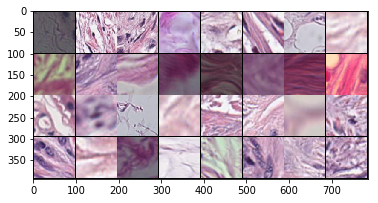

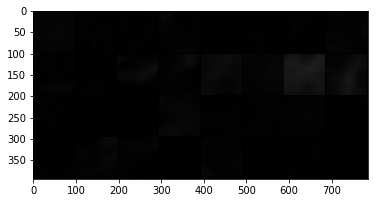

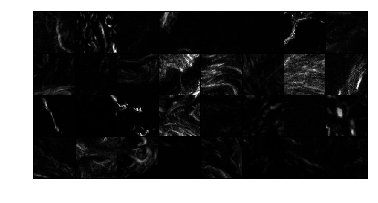

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


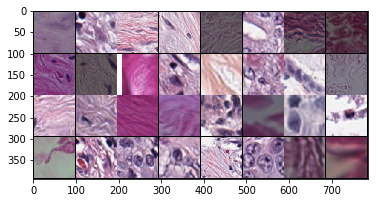

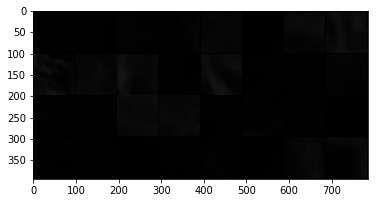

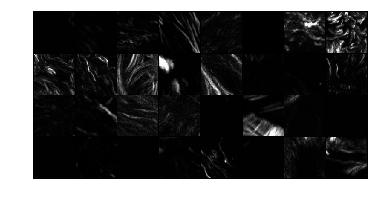

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


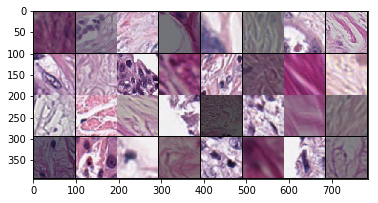

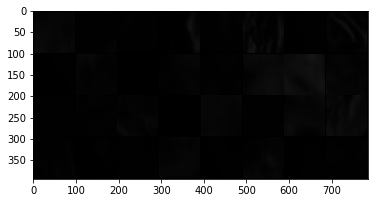

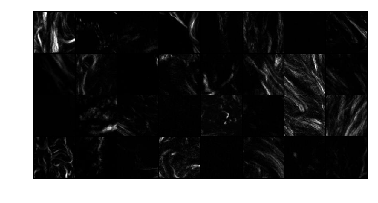

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


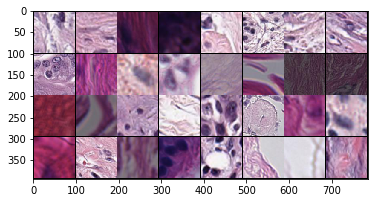

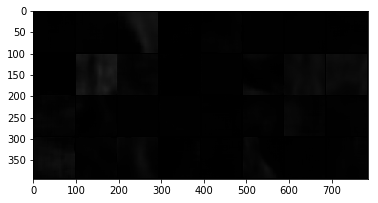

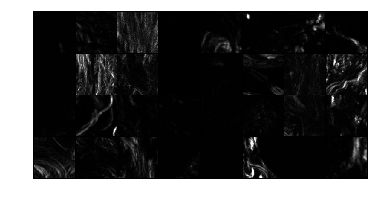

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


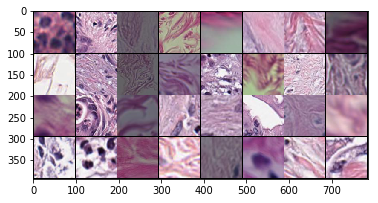

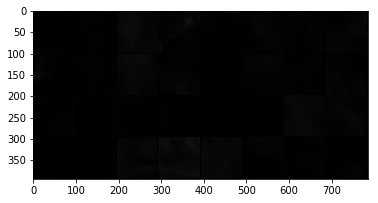

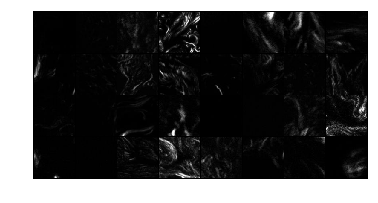

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


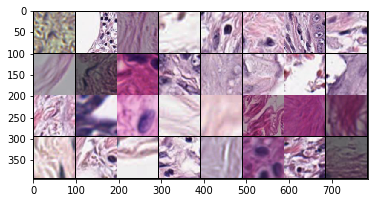

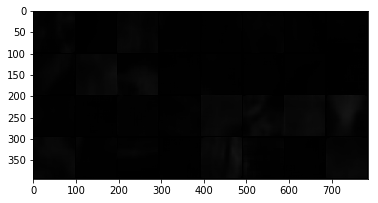

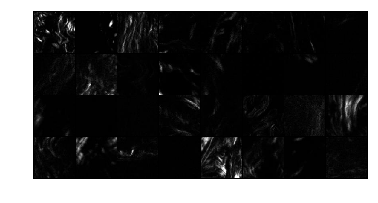

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


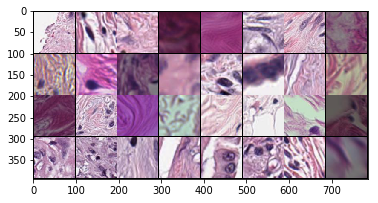

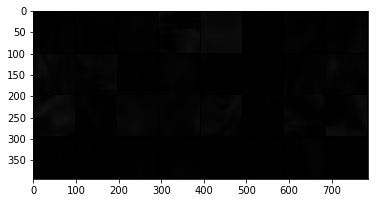

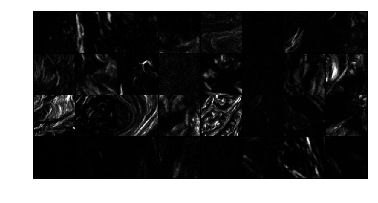

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


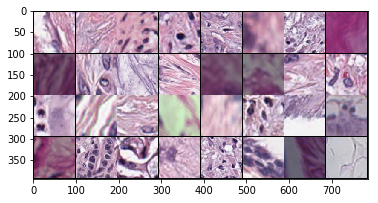

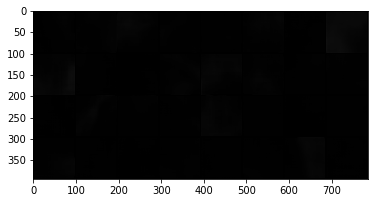

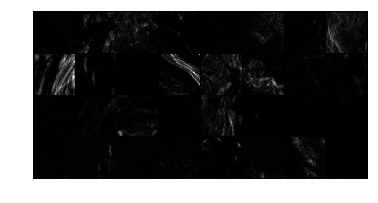

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


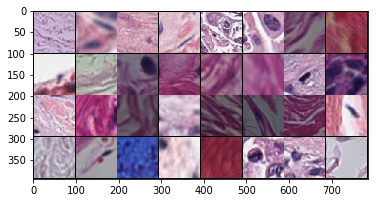

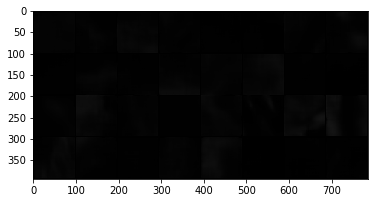

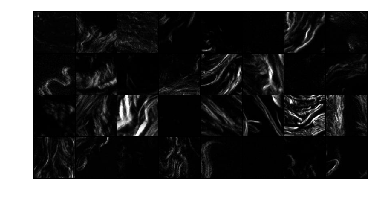

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


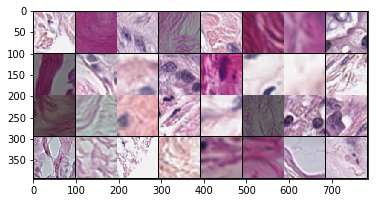

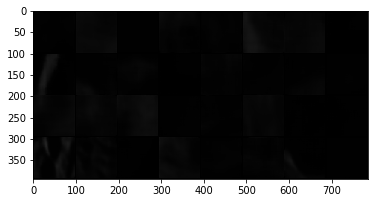

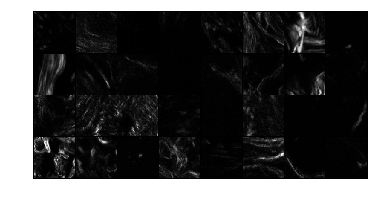

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


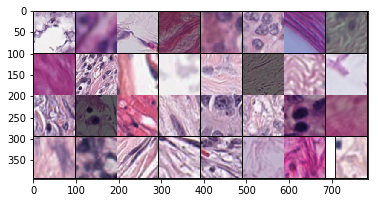

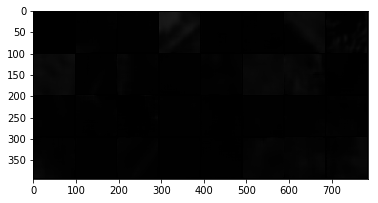

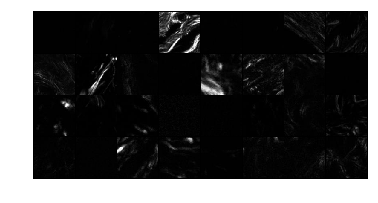

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


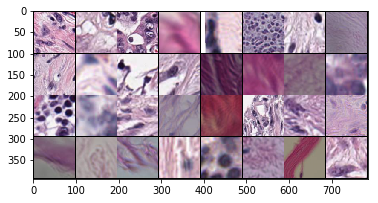

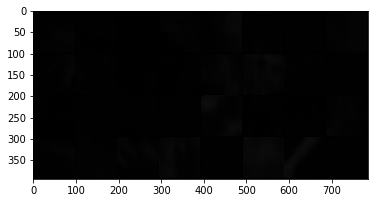

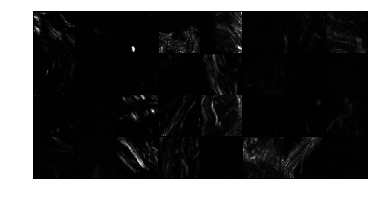

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


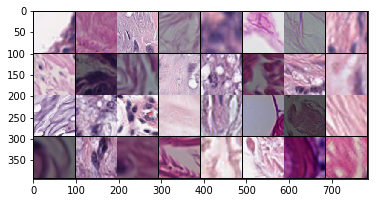

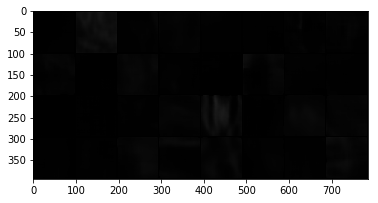

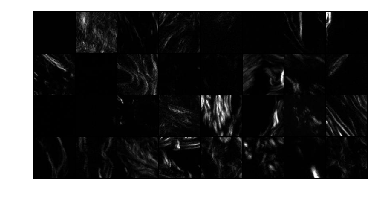

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


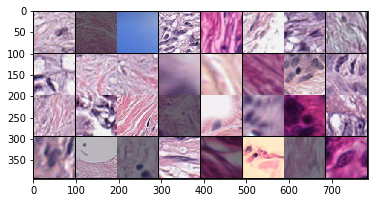

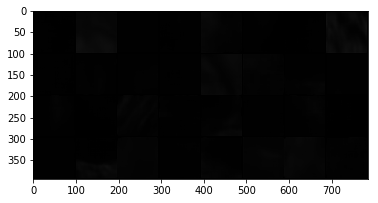

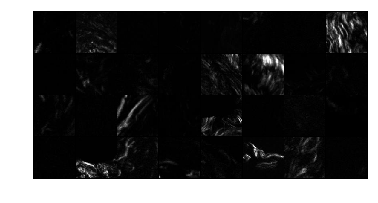

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


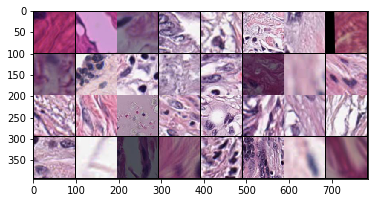

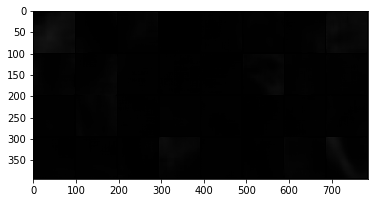

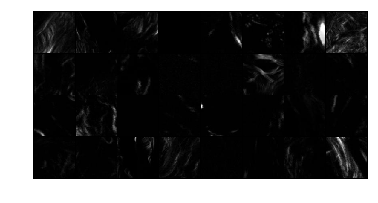

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


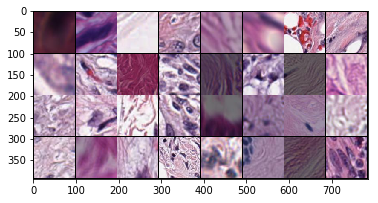

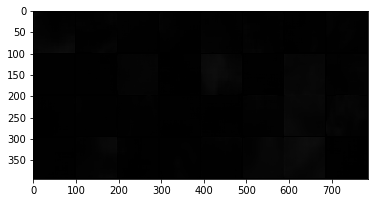

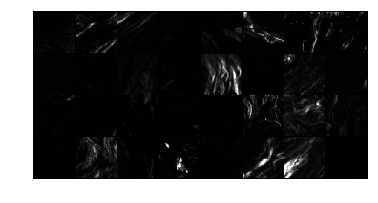

torch.Size([32, 1, 96, 96]) torch.Size([32, 96, 96])
torch.Size([32, 1, 96, 96])


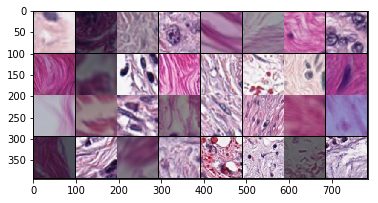

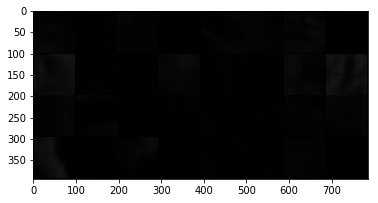

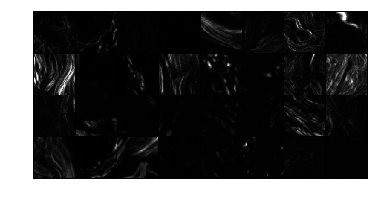

===> Avg. PSNR: nan dB


In [61]:
test()